In [2]:
import pandas as pd
import numpy as np
import scanpy as sc
import time
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
from scTools import input, preprocess, process, out
from scTools.process import draw
import gseapy

%load_ext autoreload
%autoreload 2

In [14]:
h5ad=False
combined=True

### Load adata objects
#treatments = ['NonfatVehicle', 'FriedVehicle', 'FriedCRV431', 'FriedLANI', 'FriedCRVLAN']
treatments = ['Normal', 'Vehicle', 'RCF', 'LAN', 'RCF+LAN']

if h5ad and combined:
    treatments = ['Combined']
    path="/Volumes/Expansion/Hepion/ClusteringResults/"
    Data = {t:sc.read_h5ad(path + t + '.h5ad') for t in treatments}
    #Data = input.loadAllFriedman(path)
else:
    mtxPath = "/Volumes/Expansion/Hepion/Data/"
    Data = {t:input.loadSTAR(f"{mtxPath}{t}/", labels=True, make_unique=False) for t in treatments}
    for t in treatments:
        preprocess.filter(Data[t], min_cells=5, min_genes=200)
        Data[t] = preprocess.mitoFilter(Data[t], plot=False)
        Data[t] = preprocess.riboFilter(Data[t], plot=False)
        Data[t] = Data[t][:,Data[t].X.sum(axis=0)>=10]
        Data[t].raw=Data[t]
        preprocess.logNorm(Data[t])
        #Data[t].raw = Data[t]
        #sc.pp.scale(Data[t], max_value=10)
        print(Data[t])
        
        print(Data[t].obs)

### To draw
doDraw=False
if doDraw:
    adata = process.catAdata(Data, Data.keys())
    preprocess.umapify(adata, color=['batch','fineClusters'], redoPCA=True)
    Data = { k:adata[adata.obs['batch']==k] for k in Data.keys() }
    preprocess.umapify(process.catAdata(Data, Data.keys(), obsKey='coarseClusters', obsVal='T Cells'), color=['batch','fineClusters'], redoPCA=False)
print(Data.keys())

AnnData object with n_obs × n_vars = 5541 × 12407
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                 coarseClusters fineClusters  n_genes  n_genes_by_counts  \
AAACCCAAGCGAGTCA        B Cells      B Cells      621                620   
AAACCCACAAACCATC          Blood        Blood     2020               2019   
AAACCCATCCGTAGGC        B Cells      B Cells      525                525   
AAACGAAAGTTGAATG        B Cells      B Cells      502                501   
AAACGAAGTAGCGTTT        T Cells   Naive CD4+      981                979   
...                         ...          ...      ...                ...   
TTTGTTGAGATCACCT        B Cells      B Cells     1072               1072   
TTTGTTGAGATTGACA        B Cells      

AnnData object with n_obs × n_vars = 5227 × 14796
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                  coarseClusters     fineClusters  n_genes  n_genes_by_counts  \
AAACCCAAGGGATGTC         T Cells  Y-Delta T Cells     1201               1199   
AAACCCACAGTATACC       Monocytes   CV & Cap. Macs     1104               1104   
AAACCCAGTAAGTCAA        NK Cells         NK Cells      991                990   
AAACCCAGTTTGTGGT           cDC1s            cDC1s     1234               1233   
AAACCCATCGCTGATA        NK Cells         NK Cells      777                776   
...                          ...              ...      ...                ...   
TTTGTTGAGACTTCGT       Monocytes   CV & Cap. Macs     1235               1233 

In [47]:
count=0
for v in Data['FriedCRV431'].var_names.str.startswith('mt-'):
    if v==True:
        count+=1
print(count)
print(Data['FriedVehicle'].obs.sort_values('pct_counts_mt'))

2
                  coarseClusters    fineClusters  n_genes  n_genes_by_counts  \
AACACACTCGCCGAAC       Monocytes  CV & Cap. Macs      727                724   
GACCCAGGTCGACGCT     Neutrophils     Neutrophils     1082               1081   
GACTGATTCATCTACT     Neutrophils     Neutrophils      732                731   
GAGTGTTTCTTGGTGA     Neutrophils     Neutrophils      818                818   
GCAGCCAAGGTAGCCA     Neutrophils     Neutrophils     1238               1232   
GCCAGGTGTTCGGACC     Neutrophils     Neutrophils      893                889   
GGGAGATCAGATTTCG     Neutrophils     Neutrophils     1368               1366   
GGGATGATCATACAGC     Neutrophils     Neutrophils      862                860   
GGTGTCGCAGGTTCCG     Neutrophils     Neutrophils      599                596   
GTAGGTTAGCGATGAC     Neutrophils     Neutrophils      743                742   
GTGCACGGTAGGCAGT     Neutrophils     Neutrophils     1371               1366   
GTGTAACGTAAGCTCT     Neutrophils     N

None
AnnData object with n_obs × n_vars = 6194 × 15582
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'


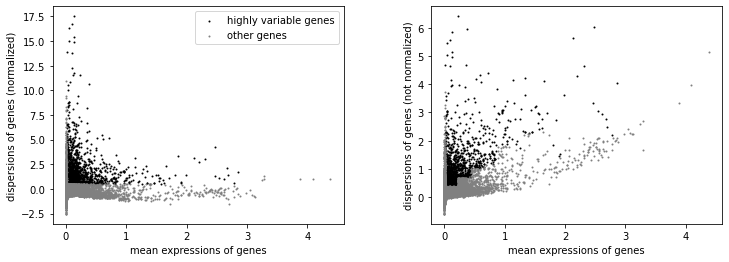

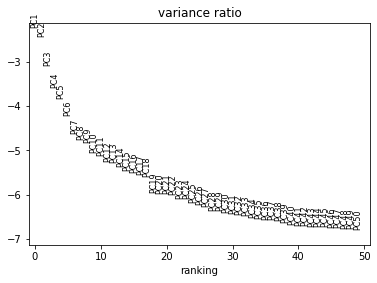

AnnData object with n_obs × n_vars = 6194 × 1605
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


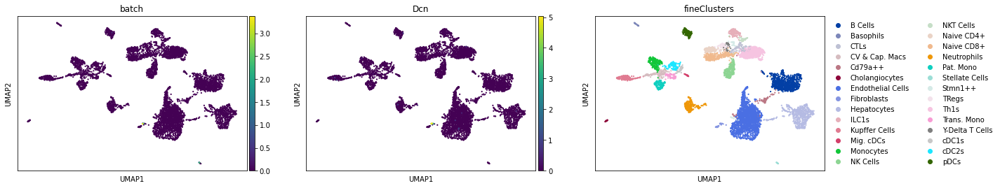

In [35]:
adata=None
print(adata)
'''
dataPath = "/Volumes/Expansion/Hepion/Data/"
for t in treatments:
    Data[t].obs['coarseClusters'].to_csv(f"{dataPath}{t}/coarseClusters.csv", index=True)
    Data[t].obs['fineClusters'].to_csv(f"{dataPath}{t}/fineClusters.csv", index=True)
'''
adata=Data['FriedCRVLAN'].copy()
print(adata)
adata=preprocess.hvg(adata, flavor='seurat')
adata.raw=adata
sc.pp.scale(adata, max_value=10)
preprocess.doPCA(adata, inplace=True)
print(adata)
#preprocess.fullEmbedShebang(adata)
preprocess.umapify(adata, color=['Col3a1','Dcn','fineClusters'], redoPCA=False)
adata=None

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/JackBrons/miniconda3/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


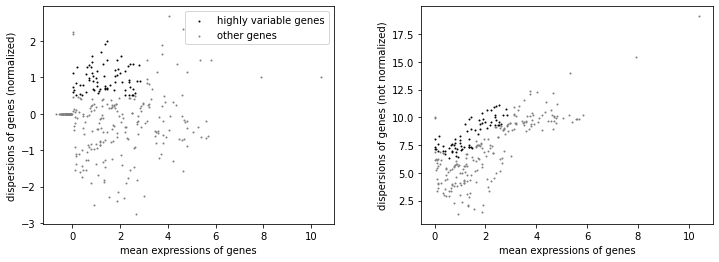

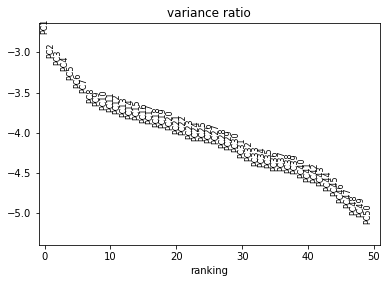

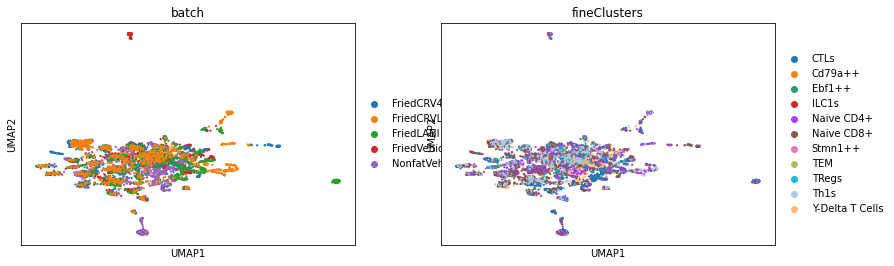

In [10]:
newData = process.batchIt(Data, inplace=False)
adata = process.catAdata(newData, newData.keys(), combat=True)

adata = adata[adata.obs['coarseClusters']=='T Cells']
adata=preprocess.hvg(adata)
preprocess.doPCA(adata)
preprocess.umapify(adata, color=['batch','fineClusters'])

['B Cells' 'Basophils' 'Cd79a++' 'Cholangiocytes' 'Endothelial Cells'
 'ILC1s' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Neutrophils' 'Stellate Cells'
 'Stmn1++' 'T Cells' 'cDC1s' 'cDC2s' 'pDCs']


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(2885, 13779)
PCA


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


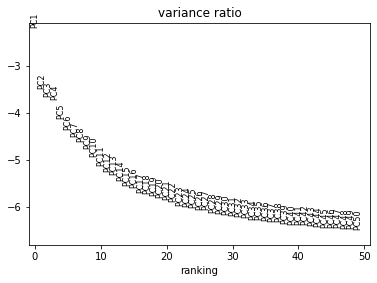

AnnData object with n_obs × n_vars = 2885 × 13779
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'batch', 'n_counts'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
UMAPPING


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


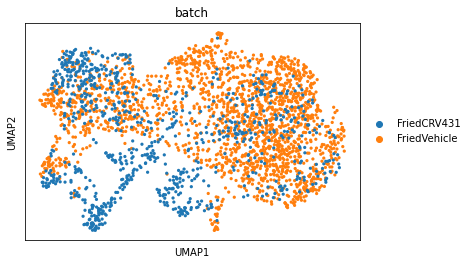

RANKING


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


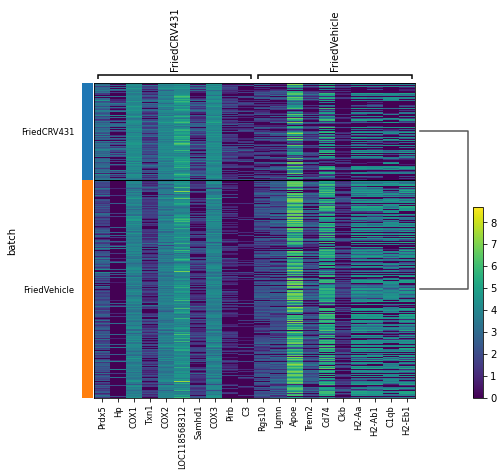

In [87]:
treat1='Vehicle'
treat2='RCF'
depth='coarse' #'macro', 'coarse', 'fine'
cellType='Monocytes'
doUMAP=True
print(np.unique(Data[treat2].obs[f'{depth}Clusters']))


adata = process.catAdata(Data, [treat1, treat2], obsKey=f"{depth}Clusters", obsVal=cellType, normReads=False, combat=False)
adata = adata[:,~adata.var_names.str.startswith(("Rps","Rpl"))]
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
print(adata.shape)
if doUMAP:
    print("PCA")
    preprocess.doPCA(adata)
    print(adata)
    print("UMAPPING")
    preprocess.umapify(adata, color='batch')
print("RANKING")
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False, use_rep='X')
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)
#sc.tl.rank_genes_groups(adata, 'batch', method='logreg', max_iter=2000, pts=True)

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


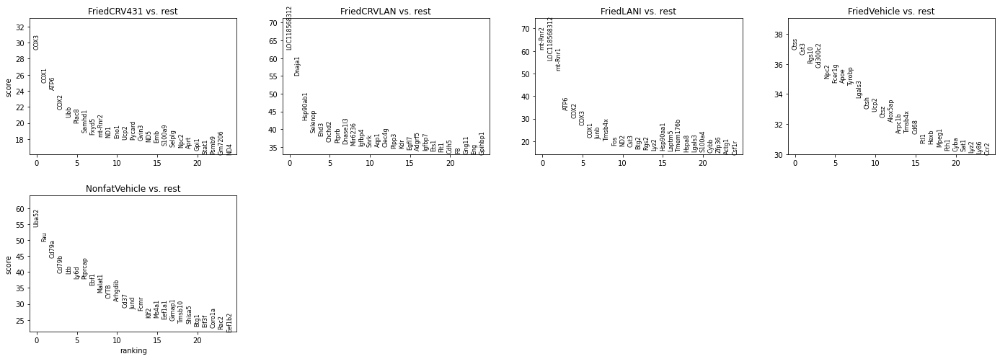

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


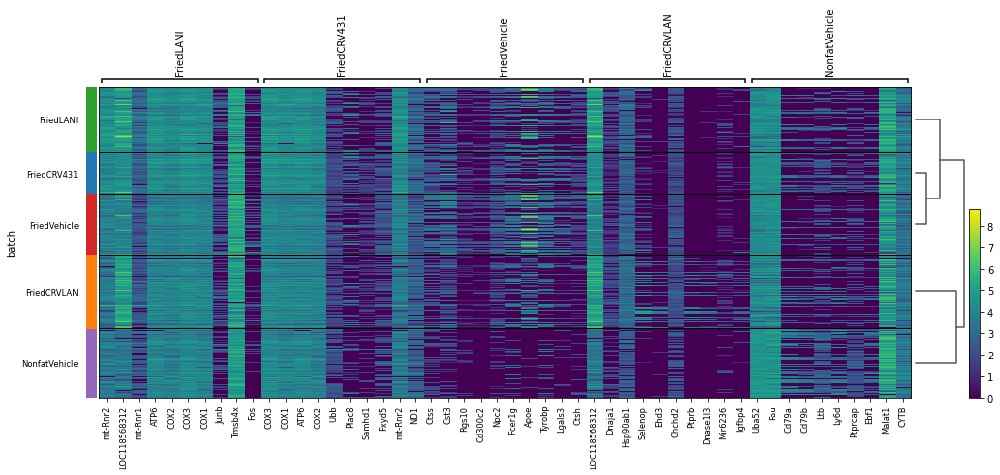

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

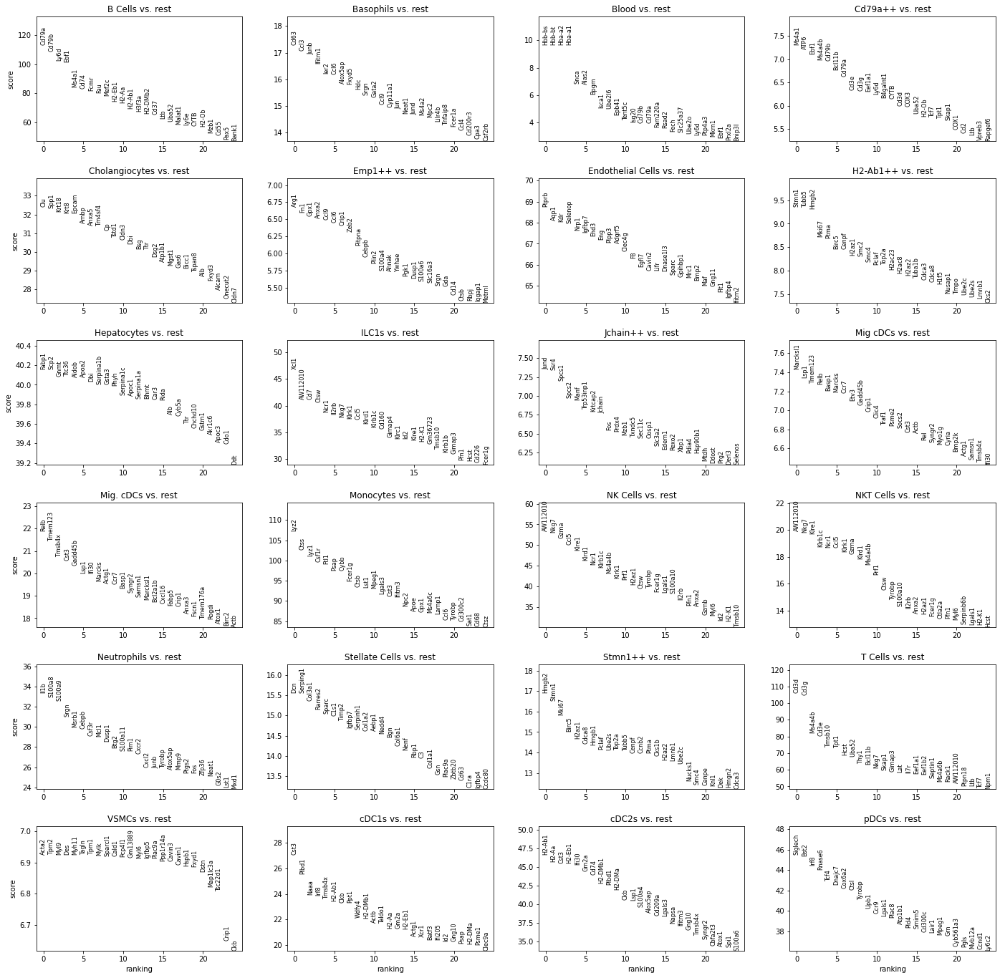

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


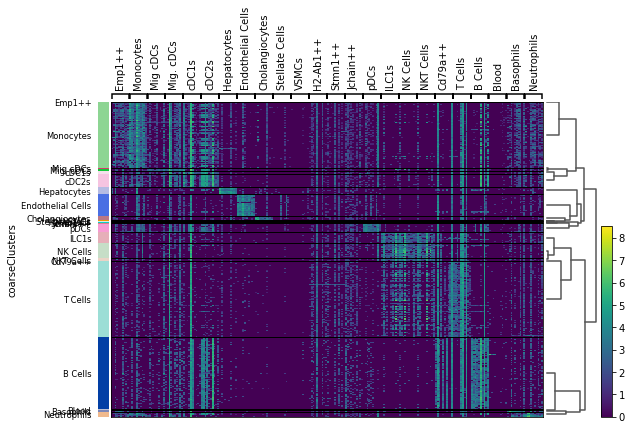

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


KeyboardInterrupt: 

In [73]:
### Dendrogram across all treatments
adata = process.catAdata(Data, treatments, normReads=False, combat=False)
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

#adata = adata[adata.obs['coarseClusters'] == 'Monocytes',:]
#adata.obs['coarseClusters'].value_counts()
adata = adata[:,~adata.var_names.str.startswith(("Rps","Rpl"))]

sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)

sc.tl.rank_genes_groups(adata, 'coarseClusters', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='coarseClusters')
sc.pl.rank_genes_groups_heatmap(adata)

adata=adata[adata.obs['batch']!='NonfatVehicle']
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


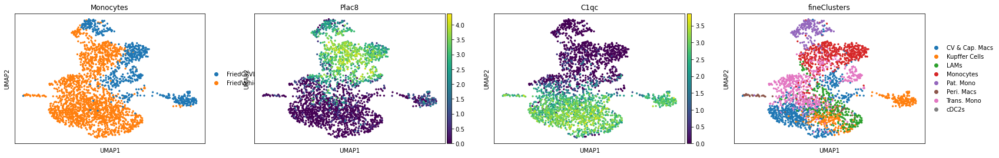

In [6]:
#preprocess.umapify(adata, color='fineClusters')
#sc.pl.umap(adata, color='fineClusters', title=cellType, legend_loc='on data')
sc.pl.umap(adata, color=['batch','Plac8','C1qc','fineClusters'], title=cellType)

In [18]:

print(adata.obs['batch'][-1])

dgeDF = process.tablize(adata, index=True, treatment=[treat1,treat2], cellType=cellType)

print(dgeDF[dgeDF['pvals_adj']<0.05].sort_values('pvals_adj').head(450))
#sc.pl.umap(adata, color=dgeDF[dgeDF['pvals_adj']<0.05].sort_values('pvals_adj').index, legend_loc='on data')

FriedCRVLAN
                         treatment baseTreatment contrastTreatment   cellType  \
Dntt    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Tshz2   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Ccr7    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Cxcr2   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Vpreb3  FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
...                            ...           ...               ...        ...   
Bhmt    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
H2-Ob   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Csf1    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
H2ac8   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Ehd3    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   

         genes 

In [38]:
print(list(adata.uns['rank_genes_groups'].keys()))

['params', 'pts', 'pts_rest', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']


FriedCRVLAN


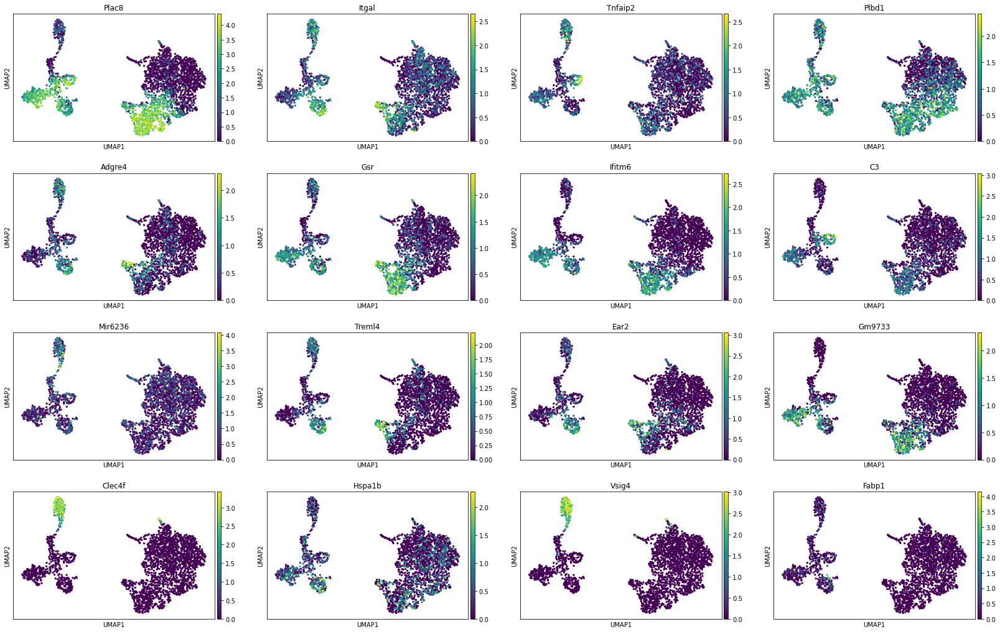

FriedVehicle


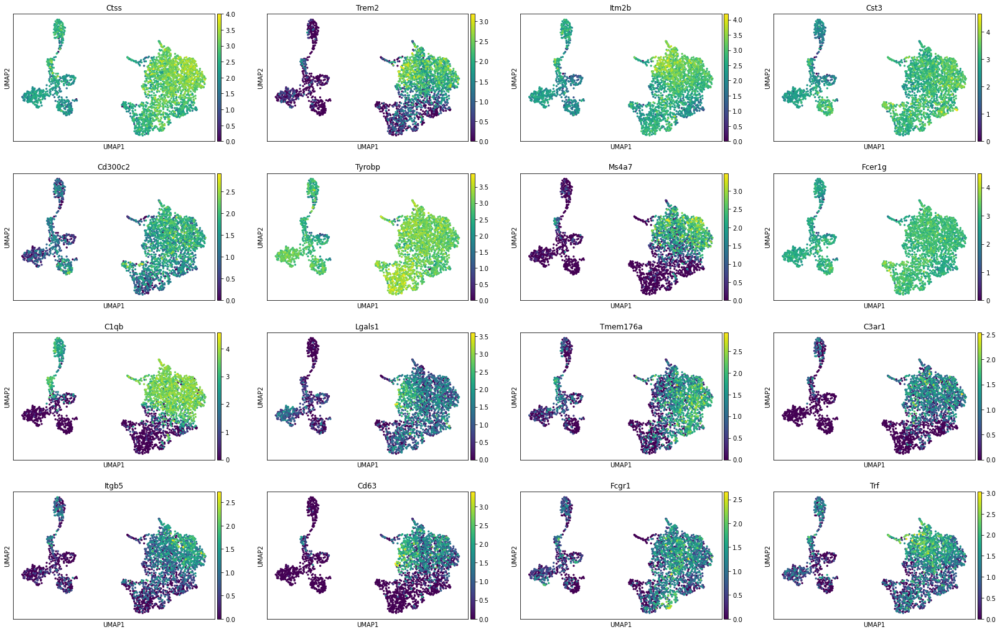

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


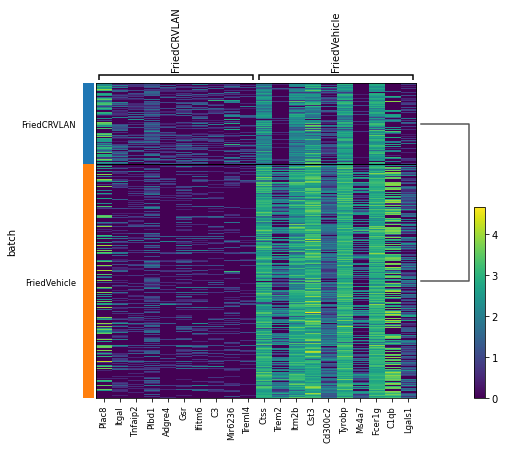

In [19]:
#sc.tl.rank_genes_groups(adata, 'batch', method='logreg', max_iter=2000)
#sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon')
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=Fals ]\
                        e, max_iter=2000, pts=False)'
sc.tl.umap(adata)
for val in np.unique(adata.obs['batch']):
    print(val)
    #print(adata.uns['rank_genes_groups'])
    sc.pl.umap(adata, color=adata.uns['rank_genes_groups']['names'][str(val)][:16])
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)
#sc.pl.umap(adata, color=['fineClusters', 'batch'])

In [15]:
### Make a df of all the dge results

coarseOrFine = 'fine'

t0=time.time()
combinedData = process.catAdata(Data, treatments, normReads=False, combat=False)
combinedData = process.dgeNorm(combinedData, scale=False)

#combinedData = combinedData.raw.to_adata()
#sc.pp.normalize_total(combinedData)
#sc.pp.log1p(combinedData)
# ?
#sc.pp.scale(combinedData)
print(f"Norming Means Finished: {time.time()-t0}s")
'''
dfs=[]
for i, treat1 in enumerate(treatments):
    print(treat1)
    for j, treat2 in enumerate(treatments):
        if j>i:
            cellTypes = np.unique(Data[treat2].obs[f'{coarseOrFine}Clusters'])
            adata = combinedData[(combinedData.obs['batch']==treat1) | (combinedData.obs['batch']==treat2)]
            for celltype in cellTypes:
                if celltype in np.unique(Data[treat1].obs[f'{coarseOrFine}Clusters']):
                    print(f"{treat1} {treat2} {celltype}")
                    cellTypeAdata = adata[adata.obs[f"{coarseOrFine}Clusters"]==celltype]
                    sc.tl.rank_genes_groups(cellTypeAdata, 'batch', groups=[treat2], reference=treat1, use_raw=False, method='wilcoxon', max_iter=2000, pts=False)
                    dgeDF = process.tablize(cellTypeAdata, index=True, treatment=[treat1,treat2], cellType=celltype, counts=False)

                    dfs.append(dgeDF)
adata=None
totalDF = pd.concat(dfs, ignore_index=True)
'''
totalDF = process.doDGE(combinedData, treatments, obsKey = f'{coarseOrFine}Clusters')

print("\nFinished")


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Norming Means Finished: 1.1066768169403076s
Normal
Normal Vehicle B Cells
Normal Vehicle Basophils
Normal Vehicle CTLs
Normal Vehicle ILC1s
Normal Vehicle Monocytes
Normal Vehicle NK Cells
Normal Vehicle Naive CD4+
Normal Vehicle Naive CD8+
Normal Vehicle Neutrophils
Normal Vehicle Peri. Macs
Normal Vehicle Y-Delta T Cells
Normal Vehicle pDCs
Normal RCF B Cells
Normal RCF Basophils
Normal RCF CTLs
Normal RCF ILC1s
Normal RCF Monocytes
Normal RCF NK Cells
Normal RCF Naive CD4+
Normal RCF Naive CD8+
Normal RCF Neutrophils
Normal RCF Peri. Macs
Normal RCF Y-Delta T Cells
Normal RCF pDCs
Normal LAN B Cells
Normal LAN Basophils
Normal LAN CTLs
Normal LAN ILC1s
Normal LAN Monocytes
Normal LAN NK Cells
Normal LAN Naive CD4+
Normal LAN Naive CD8+
Normal LAN Neutrophils
Normal LAN Peri. Macs
Normal LAN Y-Delta T Cells
Normal LAN pDCs
Normal RCF+LAN B Cells
Normal RCF+LAN Basophils
Normal RCF+LAN CTLs
Normal RCF+LAN ILC1s
Normal RCF+LAN Monocytes
Normal RCF+LAN NK Cells
Normal RCF+LAN Naive CD4+

In [10]:
print(len(np.unique(totalDF['genes'])))
print(totalDF.sort_values('logfoldchanges'))

1444
                treatment baseTreatment contrastTreatment           cellType  \
147283  Vehicle x RCF+LAN       Vehicle           RCF+LAN  Endothelial Cells   
203622          RCF x LAN           RCF               LAN    Y-Delta T Cells   
47672        Normal x LAN        Normal               LAN    Y-Delta T Cells   
49117        Normal x LAN        Normal               LAN               pDCs   
177611          RCF x LAN           RCF               LAN          Basophils   
...                   ...           ...               ...                ...   
278681      LAN x RCF+LAN           LAN           RCF+LAN               pDCs   
278685      LAN x RCF+LAN           LAN           RCF+LAN               pDCs   
278686      LAN x RCF+LAN           LAN           RCF+LAN               pDCs   
278688      LAN x RCF+LAN           LAN           RCF+LAN               pDCs   
278691      LAN x RCF+LAN           LAN           RCF+LAN               pDCs   

          genes     scores     pva

In [16]:
### Add counts to DF
t0 = time.time()
depth='fine'
otherDF = totalDF

print("Normalizing")
combinedData = process.catAdata(Data, treatments, normReads=False, combat=False)
combinedData = process.dgeNorm(combinedData)
'''
for i,t in enumerate(treatments):
    print(f"\nOn treatment {t}")
    adata = combinedData[combinedData.obs['batch']==t]
    col=[]
    col2=[]
    
    arr=[]
    ### Create a matrix of mean gene expressions for all cell in a cellType
    ### Precomputing this speeds up data extraction significantly
    print("Calculating EXP")
    adata.X=np.expm1(adata.X)
    
    print("Making meanMatrixDF")
    for cluster in np.unique(otherDF['cellType']):
        if cluster in np.unique(adata.obs[f'{depth}Clusters']):
            arr.append(np.asarray(adata[adata.obs[f'{depth}Clusters']==cluster].X.mean(axis=0))[0])
        else:
            arr.append([np.nan]*otherDF.shape[1])
    meanMatrixDF = pd.DataFrame(arr, index=np.unique(otherDF['cellType']), columns=adata.var.index)
    #print(meanMatrixDF)
    
    print("Making cellMatrix")
    cellCounts=[]
    for cluster in np.unique(otherDF['cellType']):
        cellCounts.append(adata[adata.obs[f'{depth}Clusters']==cluster].shape[0])
    cellCountDF = pd.DataFrame(cellCounts, index=np.unique(otherDF['cellType']), columns=['cellCounts'])
    
    
    print("Appending reads to DF")
    for index, row in otherDF.iterrows():
        cluster = row['cellType']
        gene = row['genes']
        col.append(meanMatrixDF.loc[cluster, gene])
        col2.append(cellCountDF.loc[cluster,'cellCounts'])
        #col2.append(adata[adata.obs[f'{depth}Clusters']==cluster].shape[0])
    otherDF[t]=col
    otherDF[t+'_cells']=col2
    
    adata.X=np.log1p(adata.X)
    
cells = [t+'_cells' for t in treatments]
cols=otherDF.columns[:9].tolist()+ treatments + cells
otherDF = otherDF[cols]
'''
print(totalDF)
print(combinedData)
otherDF = process.addReadCounts(totalDF, combinedData, treatments, obsKey=f'{depth}Clusters')

print(otherDF)
t1 = time.time()
print(f"Total Time Elapsed: {t1-t0}")

Normalizing


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


                treatment baseTreatment contrastTreatment cellType  \
0        Normal x Vehicle        Normal           Vehicle  B Cells   
1        Normal x Vehicle        Normal           Vehicle  B Cells   
2        Normal x Vehicle        Normal           Vehicle  B Cells   
3        Normal x Vehicle        Normal           Vehicle  B Cells   
4        Normal x Vehicle        Normal           Vehicle  B Cells   
...                   ...           ...               ...      ...   
2359835     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2359836     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2359837     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2359838     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2359839     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   

                genes     scores pvals pvals_adj logfoldchanges  
0             mt-Rnr2  20.784603   0.0       0.0       0.816041  
1        LOC118568312  19.5

KeyboardInterrupt: 

In [13]:
#print(Data['FriedVehicle'][Data['FriedVehicle'].obs['coarseClusters']=='B Cells'][:,'COX3'].X)
print(otherDF)
#print(outputDF[f'{outputDF["baseTreatment"]}_AvgReadsPerCell'])
#print(outputDF[outputDF['contrastTreatment'].values])

                treatment baseTreatment contrastTreatment cellType  \
0        Normal x Vehicle        Normal           Vehicle  B Cells   
1        Normal x Vehicle        Normal           Vehicle  B Cells   
2        Normal x Vehicle        Normal           Vehicle  B Cells   
3        Normal x Vehicle        Normal           Vehicle  B Cells   
4        Normal x Vehicle        Normal           Vehicle  B Cells   
...                   ...           ...               ...      ...   
2323715     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2323716     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2323717     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2323718     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
2323719     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   

                genes     scores pvals pvals_adj logfoldchanges  \
0             mt-Rnr2  20.784603   0.0       0.0       0.816041   
1        LOC118568312  19

In [7]:
print("Filter 1")
outputDF = otherDF[otherDF.pvals<=0.05]
print("Filter 2")
outputDF = outputDF[np.abs(outputDF.logfoldchanges)>0.75]
for i,t in enumerate(treatments):
    print(f'Filter {i+3}')
    avgMask=(outputDF[t+'_AvgReadsPerCell']>0.01)
    mask = (outputDF['baseTreatment'] != t)
    outputDF = outputDF[(mask)|(avgMask)]
    mask = (outputDF['contrastTreatment'] != t)
    outputDF = outputDF[(mask)|(avgMask)]
    
print("Making Spreadsheet")
out.makeSpreadsheet(outputDF, filename=f"{depth}DGE_results.xlsx", sheetKey='cellType', sortKey='pvals_adj')



Filter 1
Filter 2
Filter 3


<ipython-input-7-22598cbe4c2d>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outputDF = outputDF[(mask)|(avgMask)]
<ipython-input-7-22598cbe4c2d>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outputDF = outputDF[(mask)|(avgMask)]
<ipython-input-7-22598cbe4c2d>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outputDF = outputDF[(mask)|(avgMask)]


Filter 4
Filter 5
Filter 6


<ipython-input-7-22598cbe4c2d>:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outputDF = outputDF[(mask)|(avgMask)]


Filter 7
Making Spreadsheet
On B Cells
On Basophils
On CTLs
On CV & Cap. Macs
On Cd79a++
On Cholangiocytes
On Endothelial Cells
On Hepatocytes
On ILC1s
On Jchain++
On Kupffer Cells
On LAMs
On Mig. cDCs
On Monocytes
On NK Cells
On Naive CD4+
On Naive CD8+
On Neutrophils
On Pat. Mono
On Peri. Macs
On Stellate Cells
On Stmn1++
On TRegs
On Trans. Mono
On Y-Delta T Cells
On cDC1s
On cDC2s
On pDCs
File fineDGE_results.xlsx created


In [8]:
### Load Previous DGE DF
#path = f"{depth}DGE_results.xlsx"
path = "fineDGE_results.xlsx"
dgeDF = pd.read_excel(path)
print(dgeDF)

              treatment baseTreatment contrastTreatment cellType  \
0      Normal x Vehicle        Normal           Vehicle  B Cells   
1      Normal x Vehicle        Normal           Vehicle  B Cells   
2      Normal x Vehicle        Normal           Vehicle  B Cells   
3      Normal x Vehicle        Normal           Vehicle  B Cells   
4      Normal x Vehicle        Normal           Vehicle  B Cells   
...                 ...           ...               ...      ...   
44826     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44827     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44828     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44829     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44830     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   

              genes     scores         pvals     pvals_adj  logfoldchanges  \
0           mt-Rnr2  20.784603  5.965488e-96  7.182448e-92        0.816041   
1      LOC118568312  19.501

In [9]:
otherDF = dgeDF
print(otherDF)

              treatment baseTreatment contrastTreatment cellType  \
0      Normal x Vehicle        Normal           Vehicle  B Cells   
1      Normal x Vehicle        Normal           Vehicle  B Cells   
2      Normal x Vehicle        Normal           Vehicle  B Cells   
3      Normal x Vehicle        Normal           Vehicle  B Cells   
4      Normal x Vehicle        Normal           Vehicle  B Cells   
...                 ...           ...               ...      ...   
44826     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44827     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44828     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44829     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   
44830     LAN x RCF+LAN           LAN           RCF+LAN     pDCs   

              genes     scores         pvals     pvals_adj  logfoldchanges  \
0           mt-Rnr2  20.784603  5.965488e-96  7.182448e-92        0.816041   
1      LOC118568312  19.501

In [10]:
### Count number of DEGs by cellType
def numDEGs(DGEDF, t1, t2, cellTypes=None, doFilter=True):
    print(f"\n{t1} x {t2}")
    if doFilter:
        sigDF = DGEDF[DGEDF.pvals<=0.1]
        sigDF = sigDF[np.abs(sigDF.logfoldchanges)>1.0]
        sigDF = sigDF[sigDF['baseTreatment'] == t1]
        sigDF = sigDF[sigDF['contrastTreatment'] == t2]
        for i,t in enumerate(treatments):
            avgMask=(sigDF[t+'_AvgReadsPerCell']>0)
            mask = (sigDF['baseTreatment'] != t)
            sigDF = sigDF[(mask)|(avgMask)]
            mask = (sigDF['contrastTreatment'] != t)
            sigDF = sigDF[(mask)|(avgMask)]
    l = []
    for cellType in cellTypes:
        numDEGs = sigDF[sigDF['cellType']==cellType].shape[0]
        l.append(numDEGs)
    return l

treatments = ['Normal', 'Vehicle', 'RCF', 'LAN', 'RCF+LAN']
gdf = pd.DataFrame(index=np.unique(otherDF['cellType']))
for i, t1 in enumerate(treatments):
    for j, t2 in enumerate(treatments):
        if i<j:
            DEGNumbers = process.numDEGs(otherDF, t1,t2, cellTypes = np.unique(otherDF['cellType']))
            #DEGNumbers=numDEGs(otherDF, t1,t2, cellTypes = np.unique(otherDF['cellType']))
            gdf[f'{t1} x {t2} DEGs'] = DEGNumbers
#numDEGs()
print(gdf)
#gdf.to_csv("DEGs_per_treatment.csv")

                   Normal x Vehicle DEGs  Normal x RCF DEGs  \
B Cells                               59                247   
Basophils                             60                129   
CTLs                                  90                348   
CV & Cap. Macs                         0                  0   
Cd79a++                                0                  0   
Cholangiocytes                         0                  0   
Endothelial Cells                      0                  0   
Hepatocytes                            0                  0   
ILC1s                                 39                 94   
Jchain++                               0                  0   
Kupffer Cells                          0                  0   
LAMs                                   0                  0   
Mig. cDCs                              0                  0   
Monocytes                            658                776   
NK Cells                              32               

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Normal x Vehicle


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9209697604080266


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


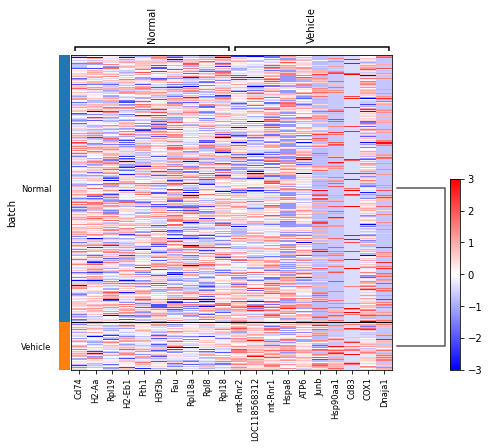

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9677489884225051


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


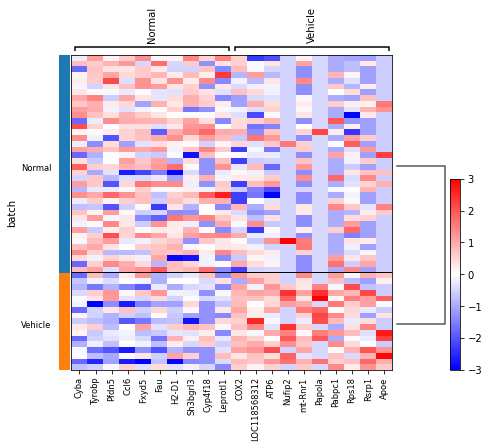

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9394100795245002


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


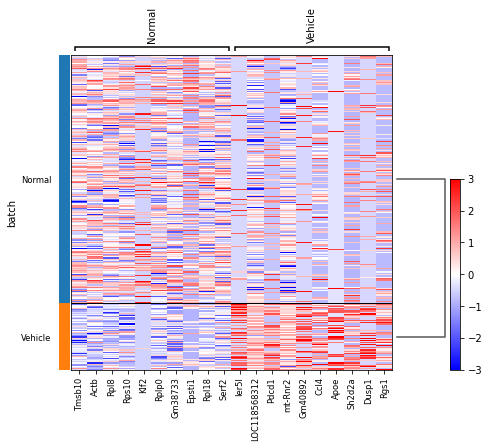

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9576937863810238


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


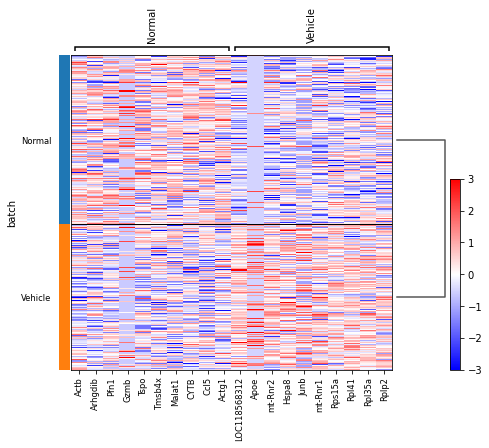

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.42833905057707944


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


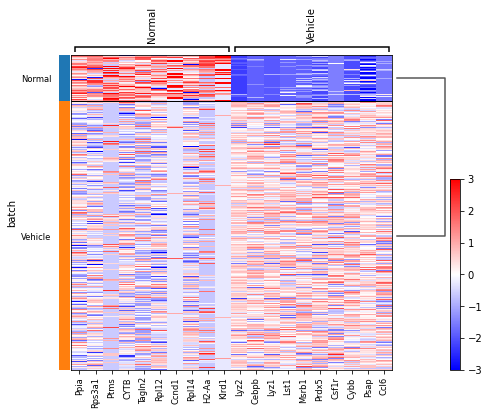

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9540233468232855


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


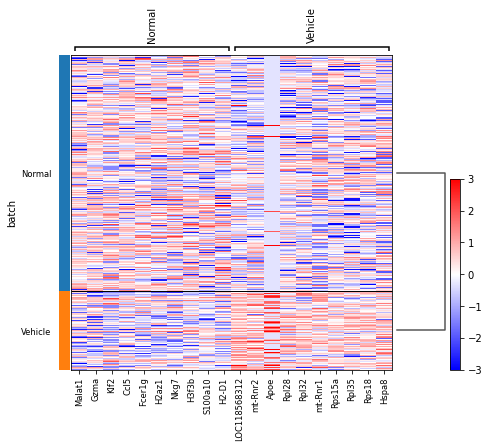

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9745607064444735


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


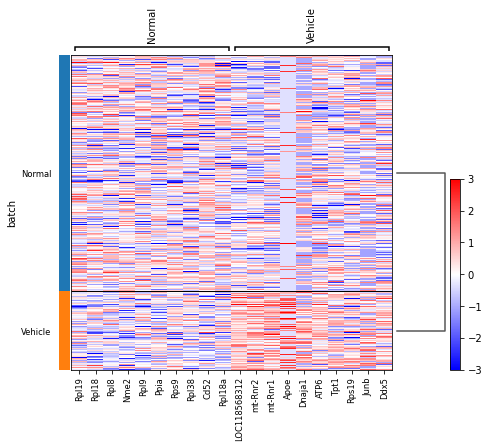

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9403819719609912


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


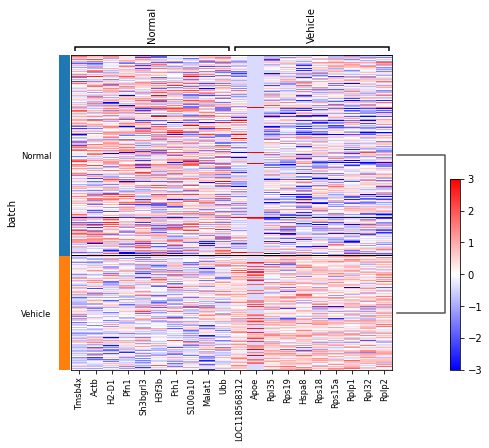

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9516498104105382


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


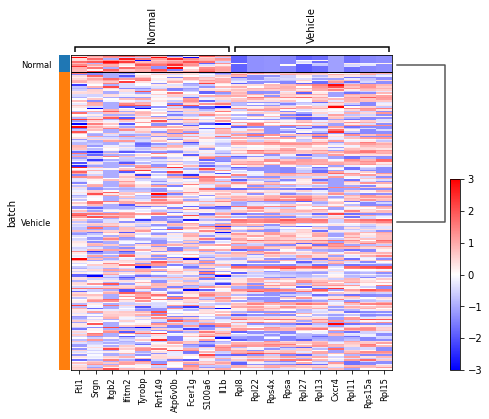

Pat. Mono
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.79943744402889


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


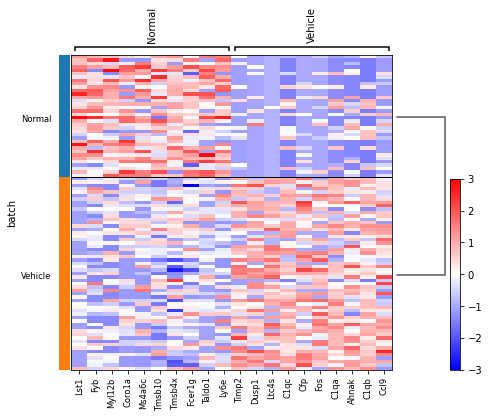

Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9553418719492087


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


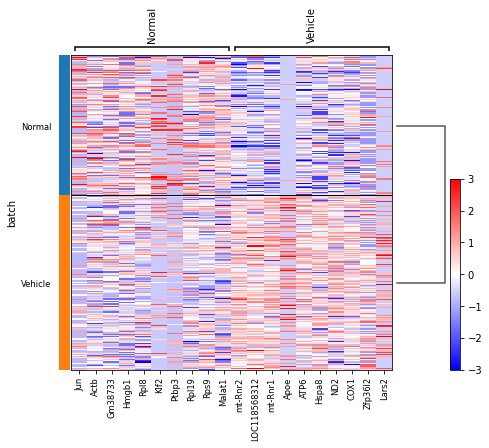

cDC1s
cDC2s
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9858020918463315


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


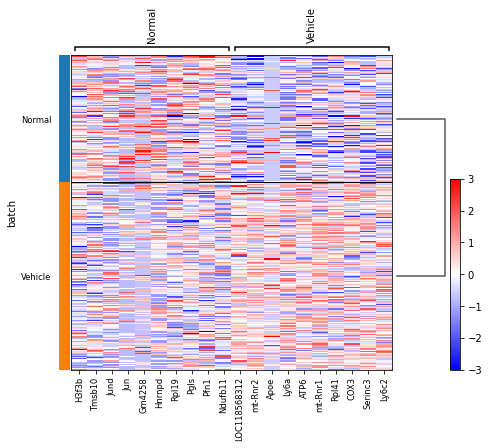

Normal x RCF


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8185541177153965


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


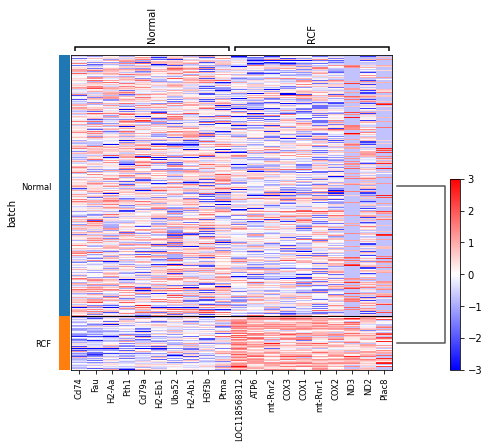

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9681890191930401


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


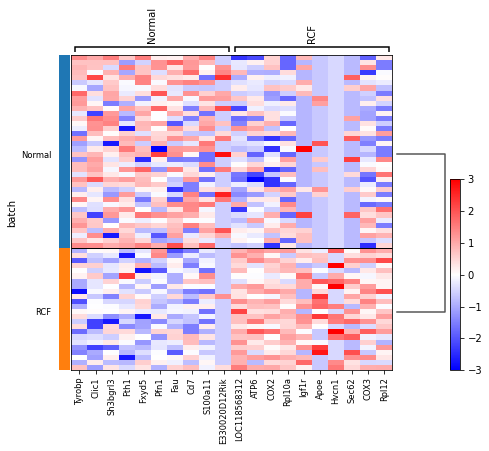

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8446784952834635


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


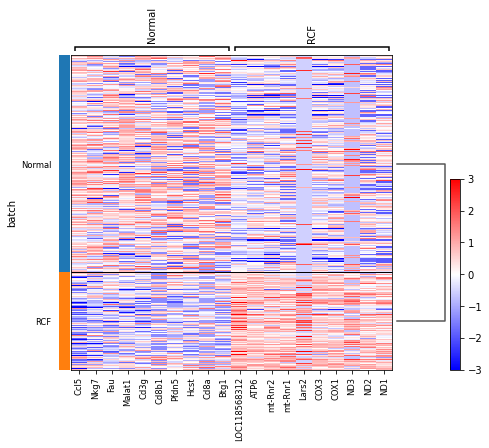

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9617767529681184


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


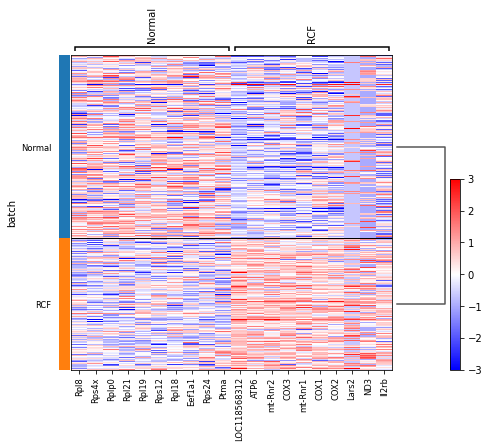

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.4999294883167721


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


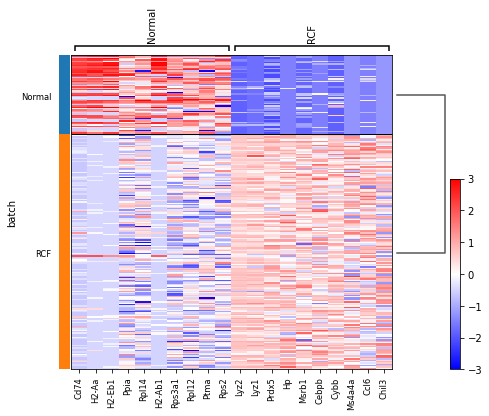

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9030972891548117


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


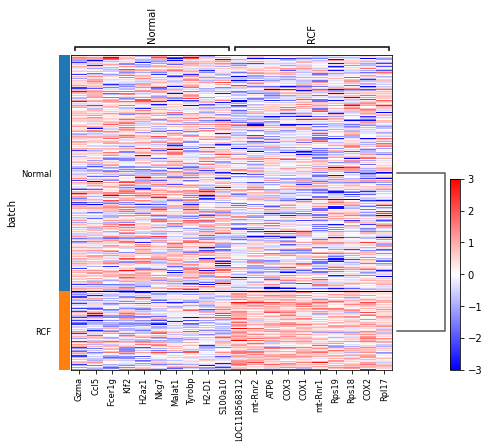

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9403316908406347


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


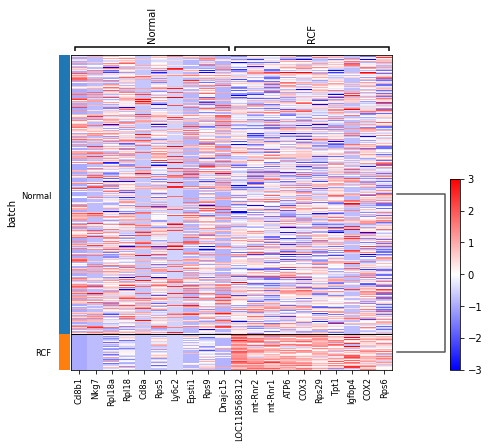

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7803913992585064


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


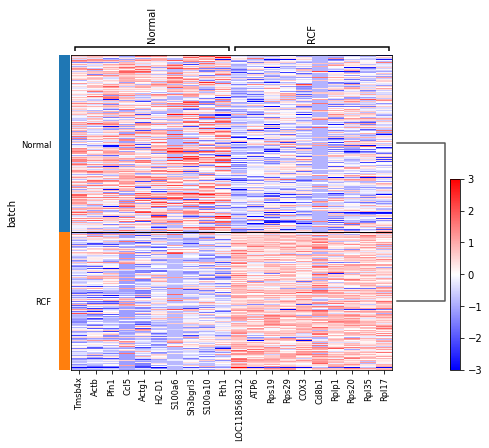

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9393834292151335


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


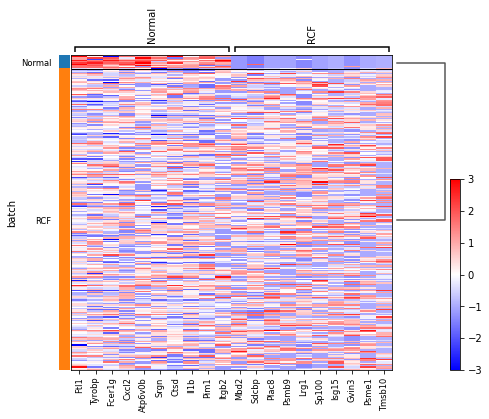

Pat. Mono
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8710447230342169


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


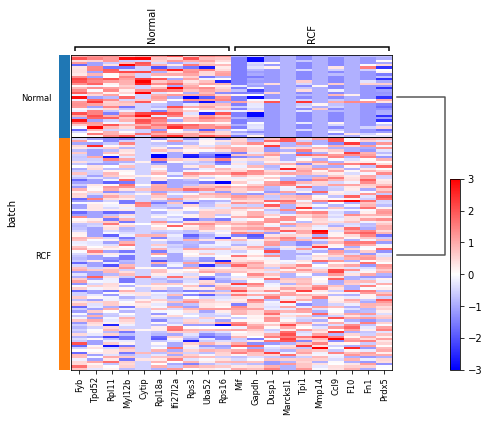

Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9384983324530448


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


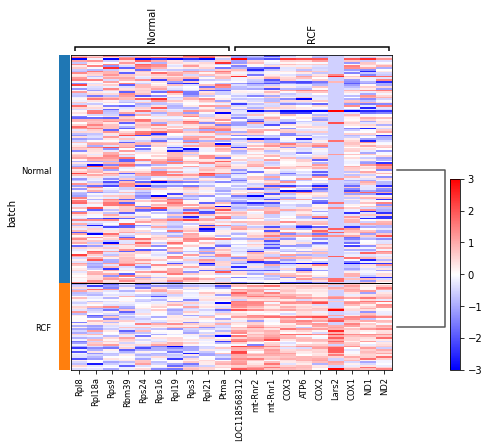

cDC1s
cDC2s
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9821893342624481


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


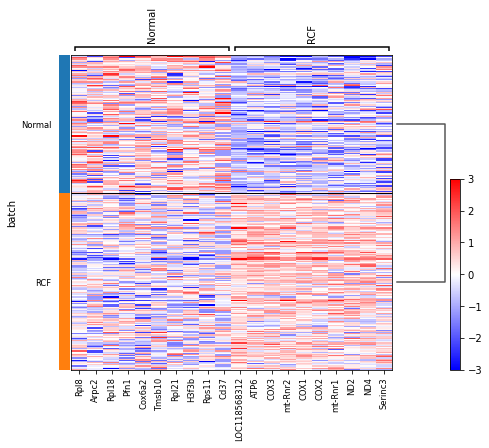

Normal x LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8722447786616175


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


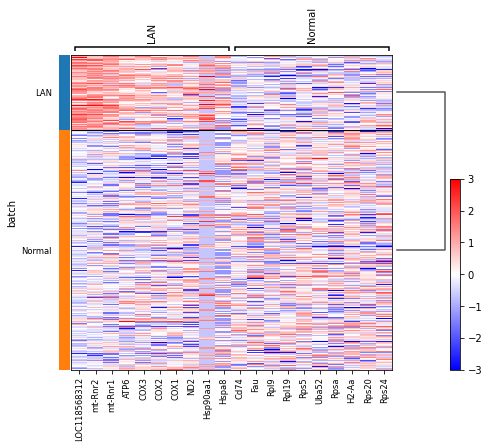

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9625575145966614


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


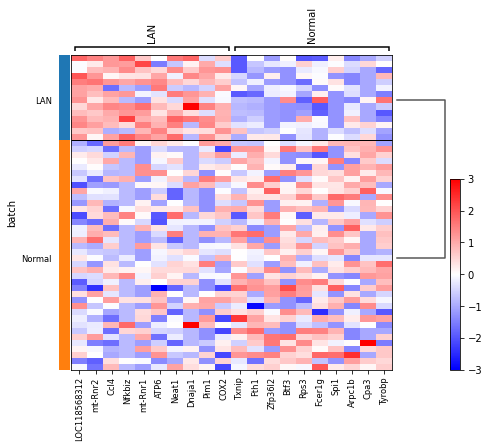

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8918910732176693


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


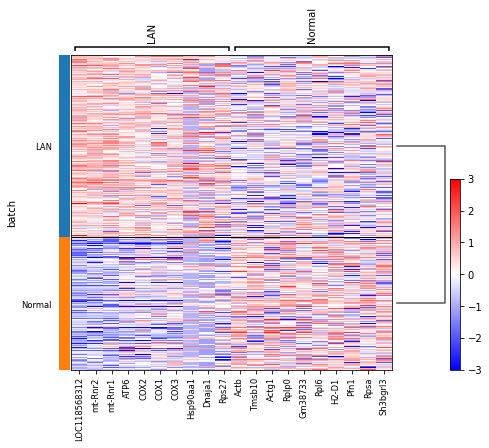

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9173332121012479


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


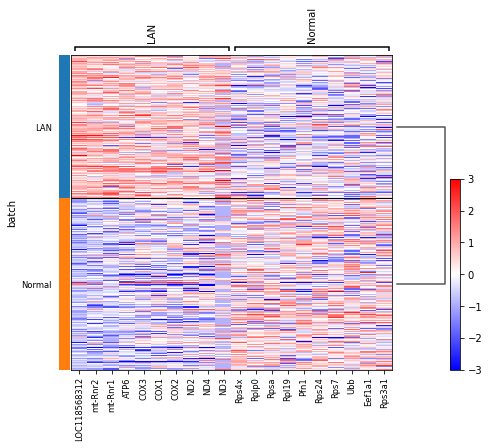

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.44602962583865446


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


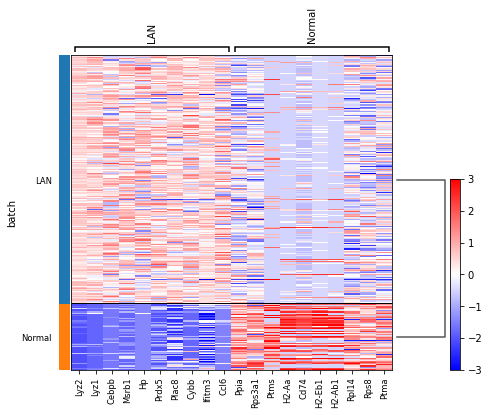

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9464996371090655


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


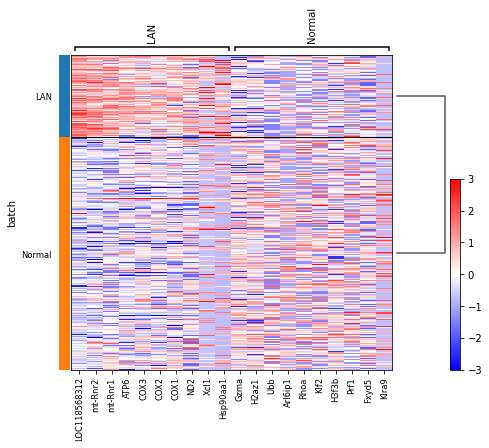

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9201651005397284


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


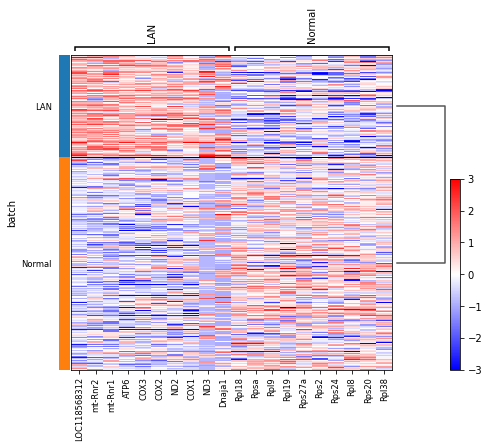

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8878850949245132


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


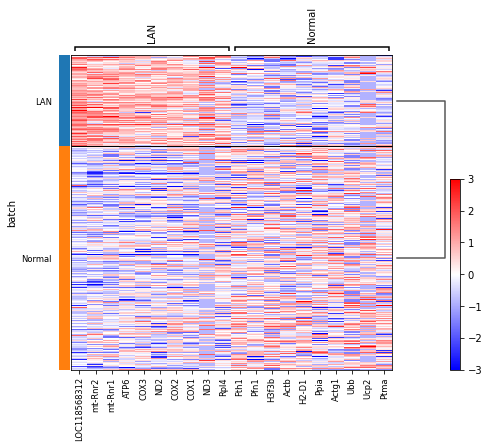

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9848659051956479


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


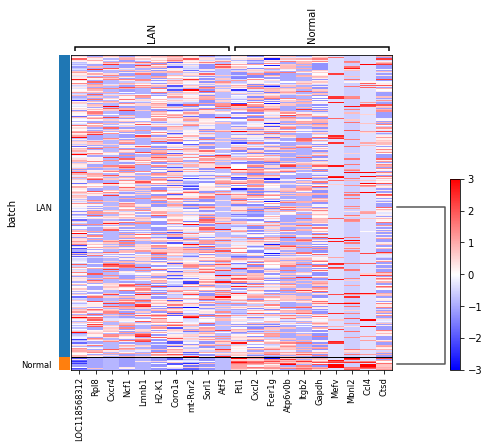

Pat. Mono
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7506705531221876


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


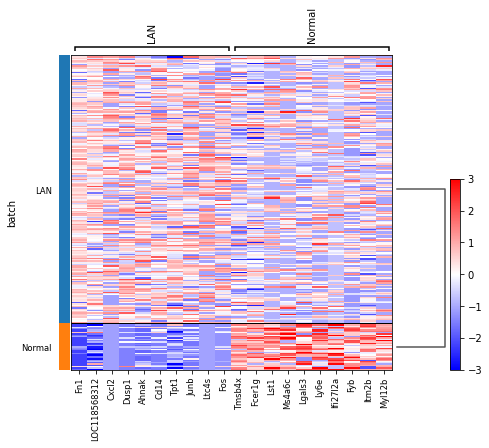

Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8880670956518711


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


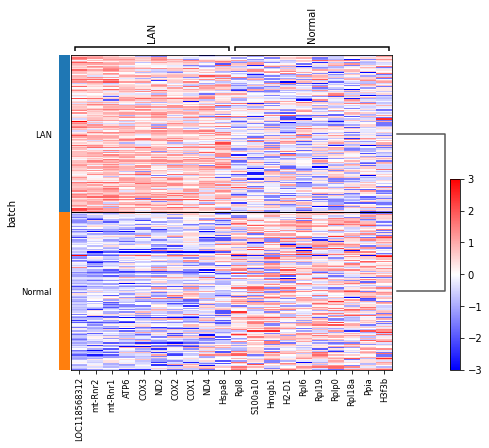

cDC1s
cDC2s
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9599060398069884


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


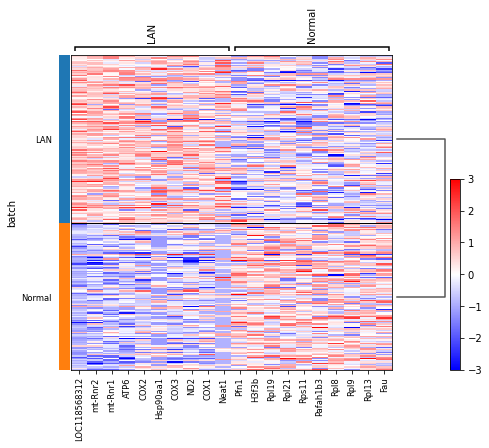

Normal x RCF+LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8845228949942647


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


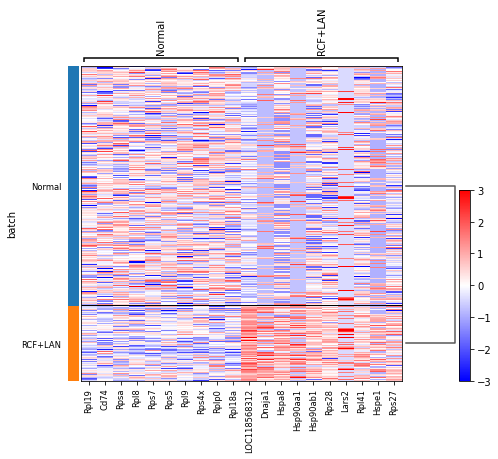

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.955508768490231


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


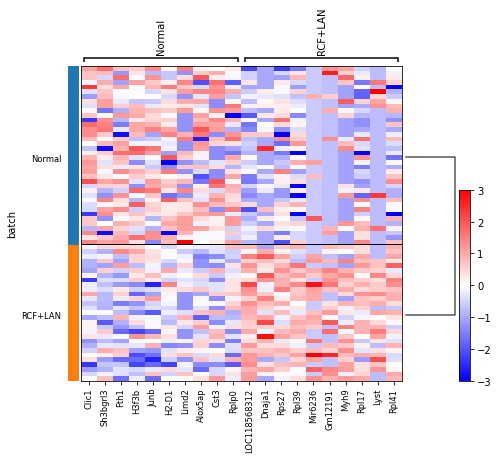

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8478885363447001


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


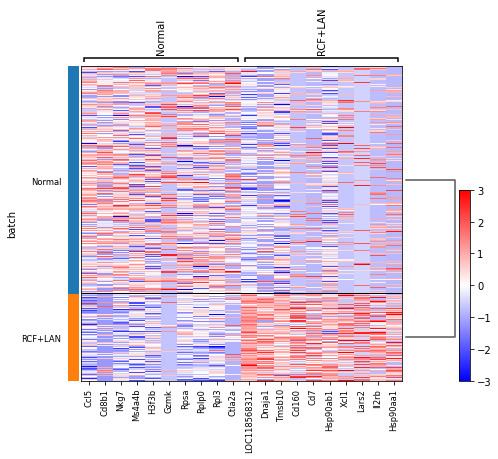

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8784821036626317


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


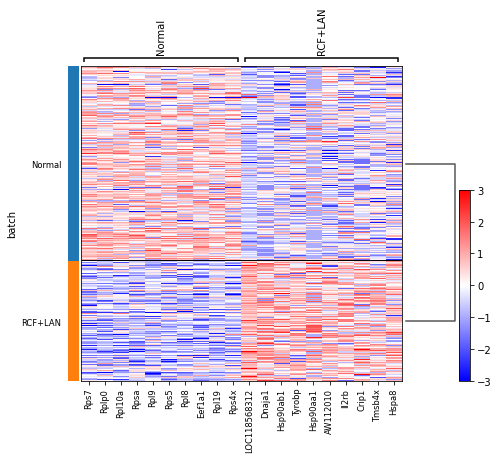

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.5656510442040665


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


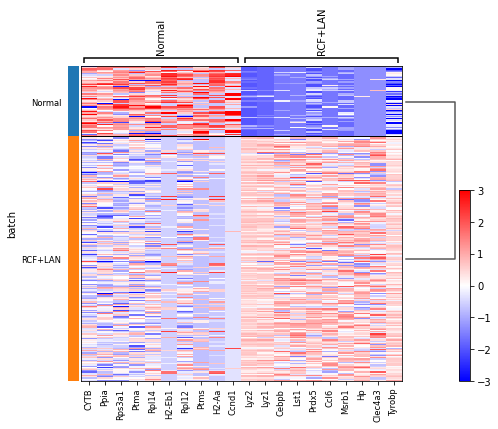

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9371004846854543


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


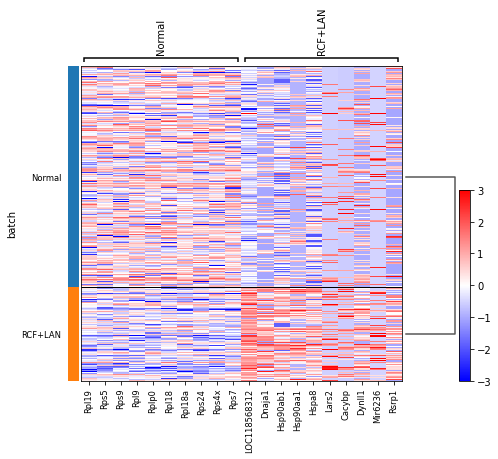

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9367227802639793


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


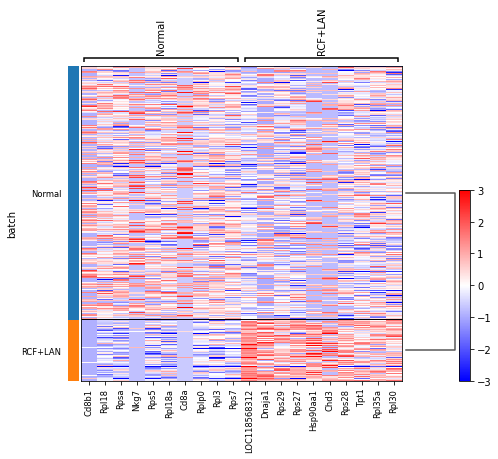

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8529780715234758


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


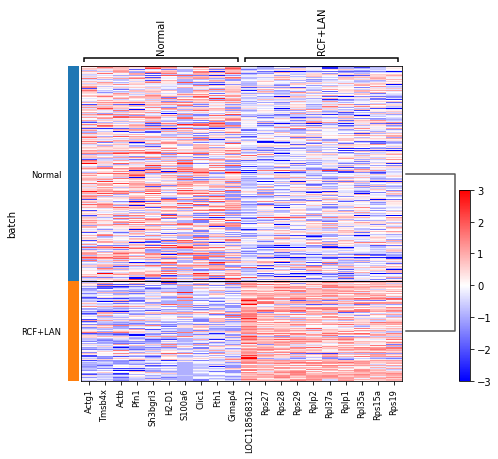

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9726712953917895


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


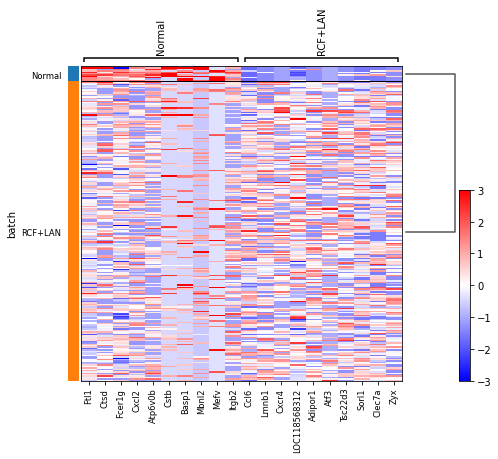

Pat. Mono
Peri. Macs
Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8512693317046486


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


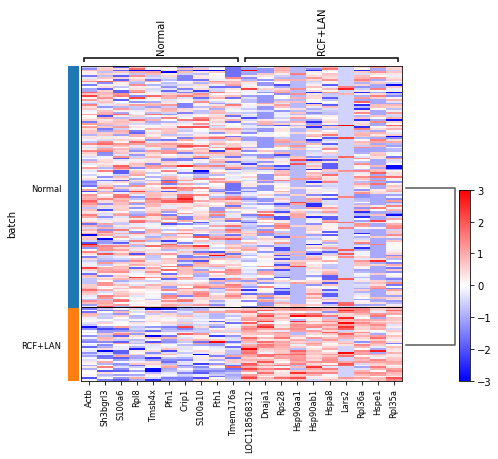

cDC1s
cDC2s
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9685250686485007


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


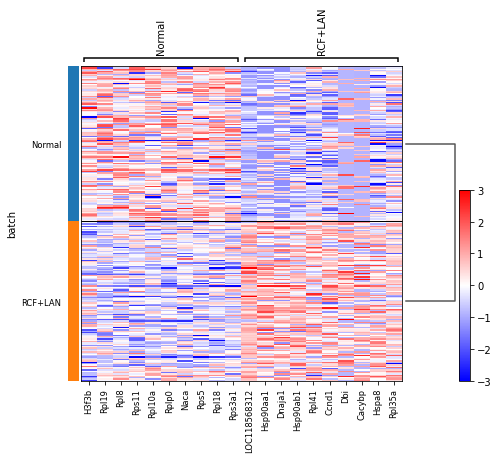

Vehicle x RCF


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9710666956084262


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


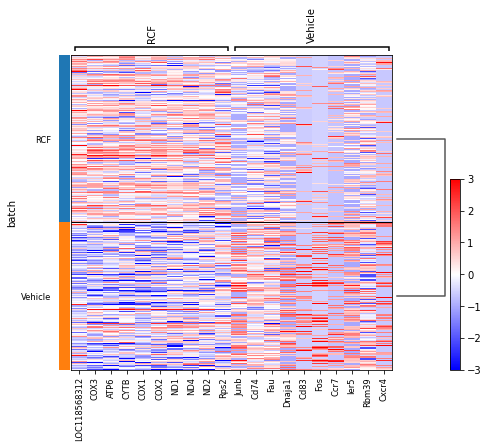

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.986015053754637


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


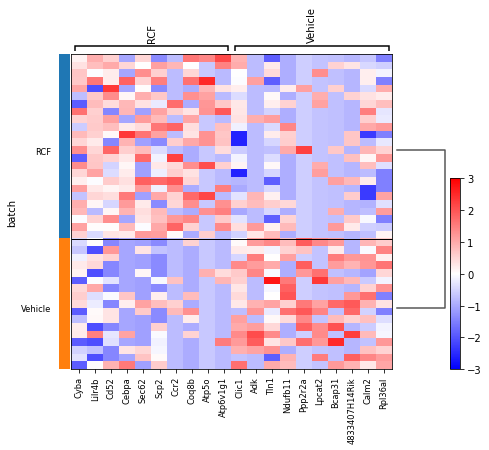

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8360743630595661


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


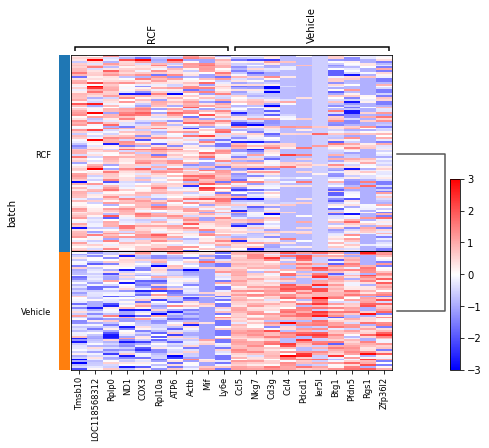

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8679947130222647


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


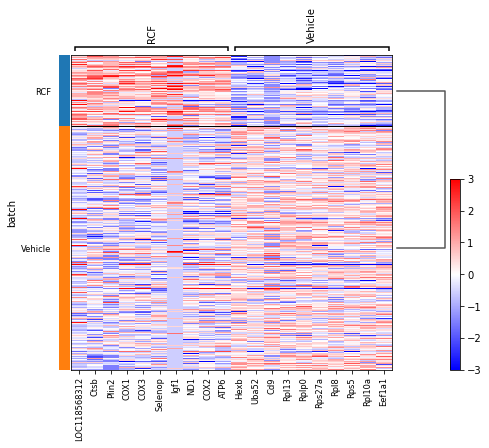

Cd79a++
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9917411853110004


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


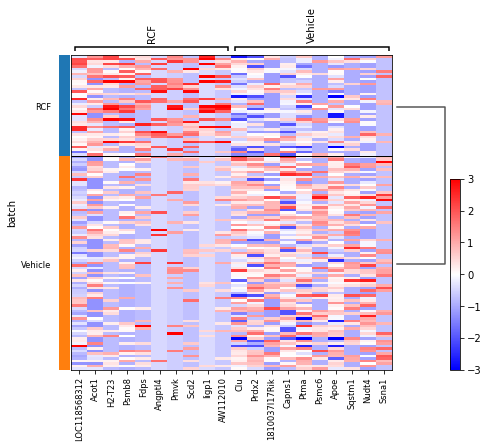

Ebf1++
Emp1++
Endothelial Cells
0.9544003489709851


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


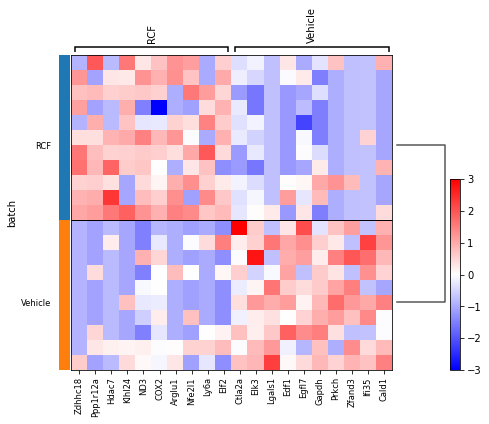

H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9523813088354853


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


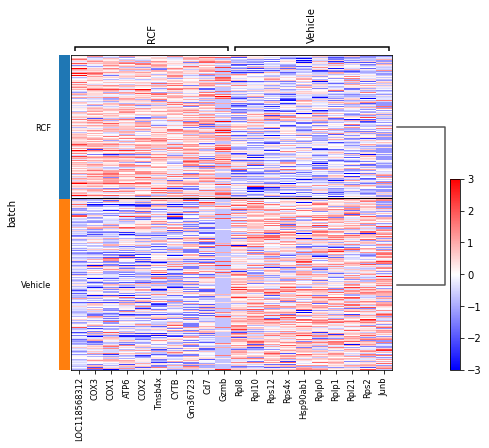

Jchain++
Kupffer Cells
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8581765247393919


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


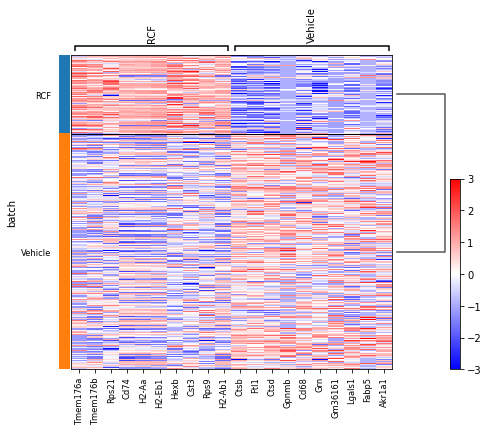

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9401678016753348


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


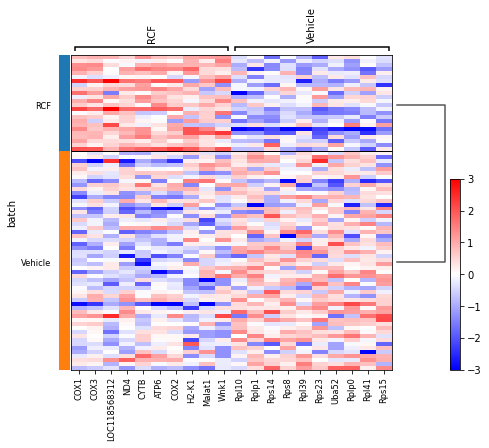

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9468165672198054


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


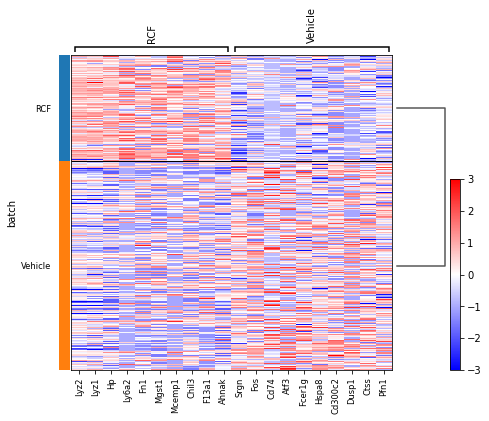

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9730042286926244


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


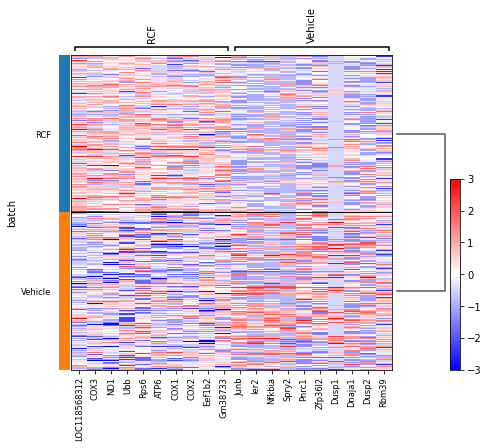

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9809423586477682


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


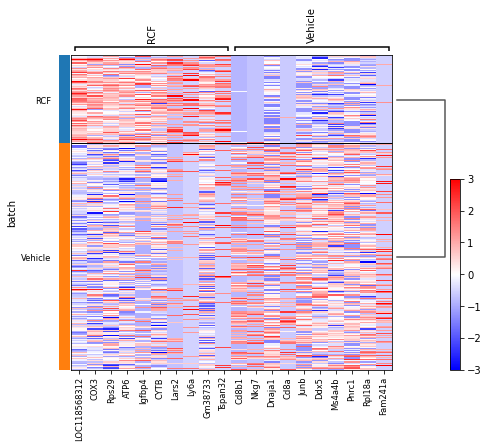

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9293853761812431


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


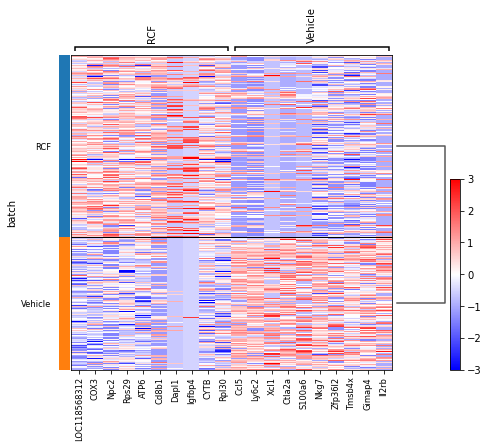

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9023459494572158


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


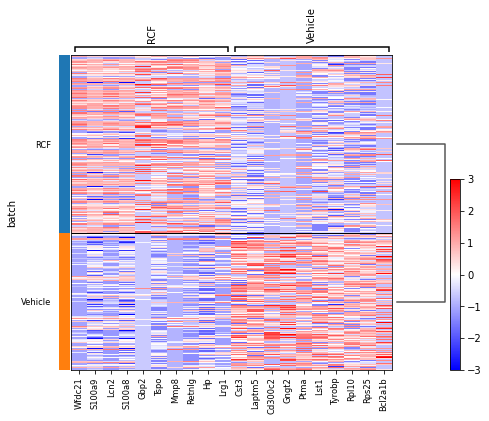

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8892591066851208


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


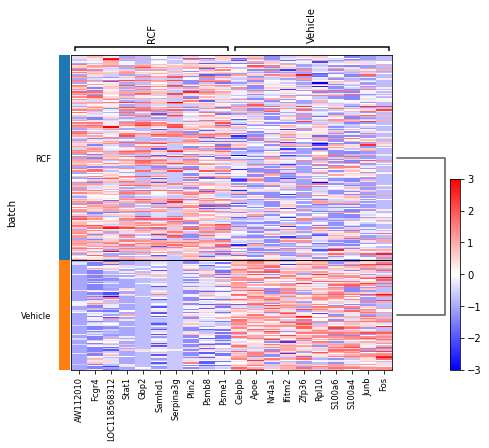

Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7630936674728191


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


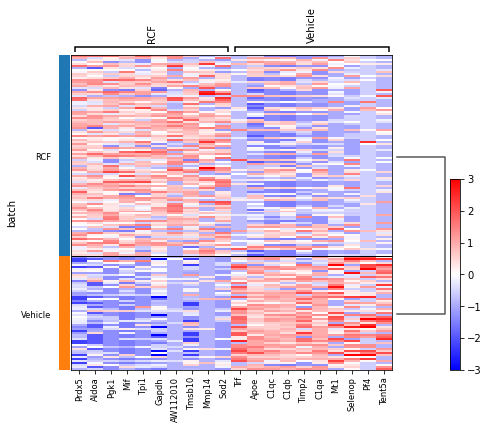

Stellate Cells
0.9529778527537229


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


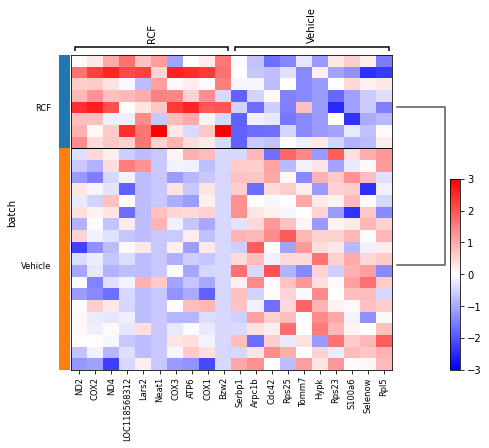

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9403783720734888


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


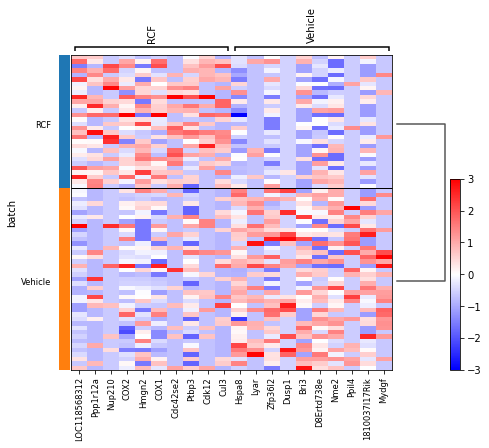

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9546386988791332


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


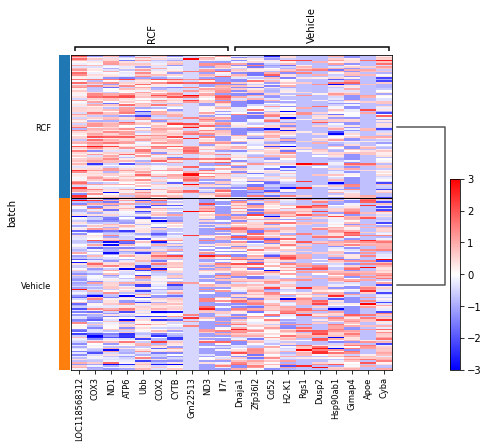

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.6642235598678772


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


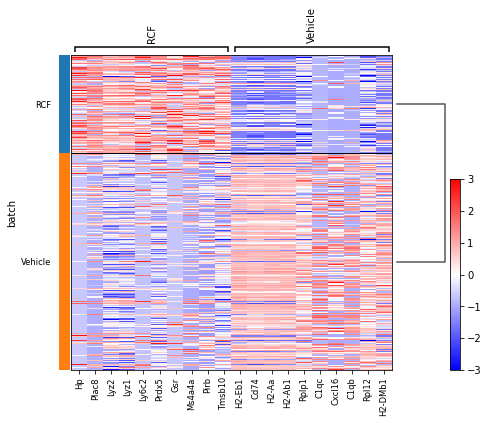

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9720856243443967


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


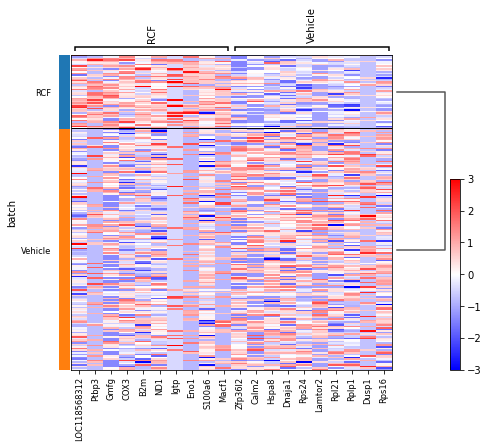

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9798578622425065


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


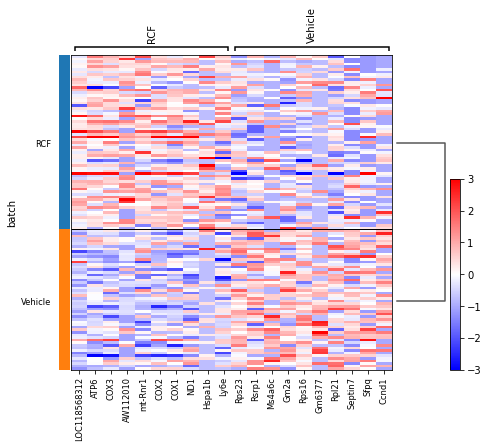

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9633695092837163


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


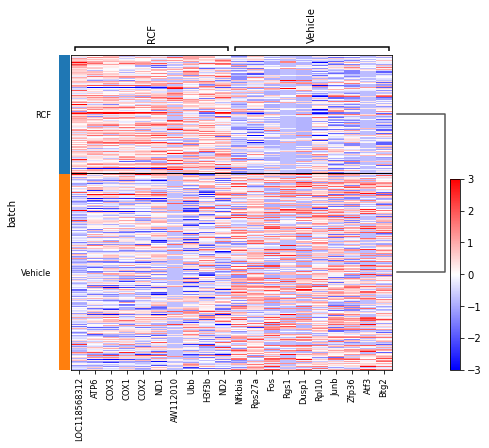

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9921105952796939


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


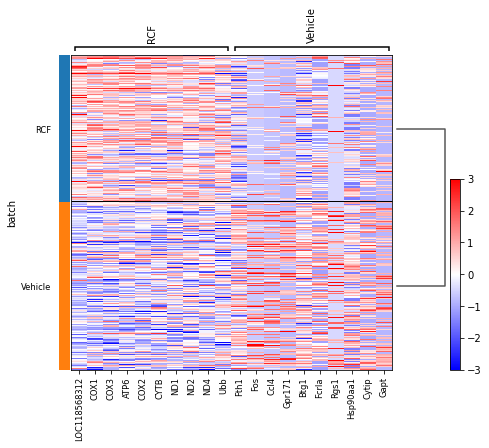

Vehicle x LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9602606204695928


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


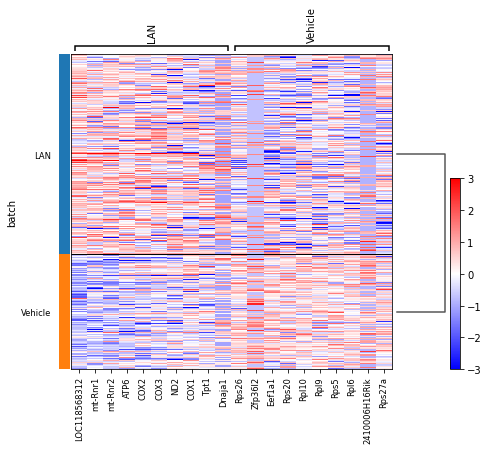

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9590029799805592


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


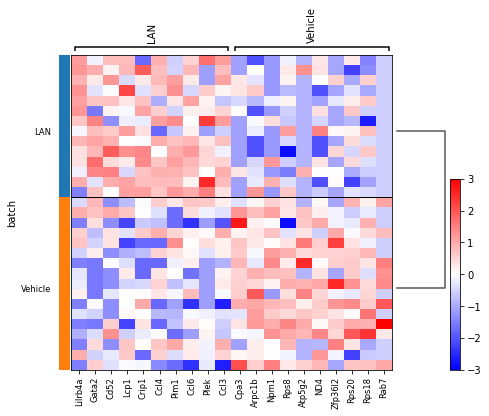

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9414030759134382


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


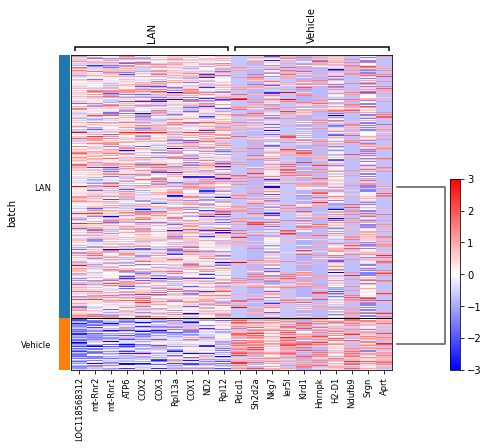

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9132654552341877


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


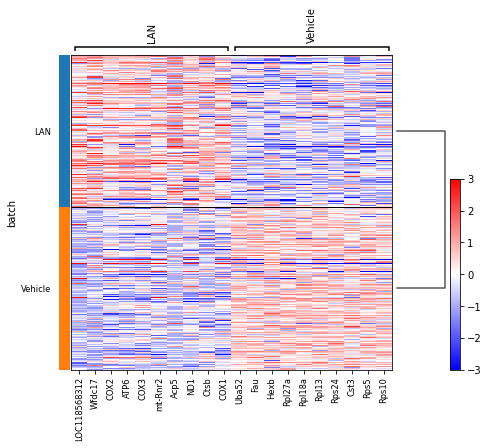

Cd79a++
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9946614396245029


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


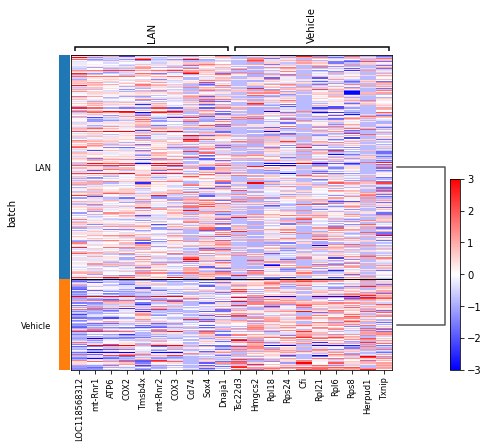

Ebf1++
Emp1++
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9597758582629458


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


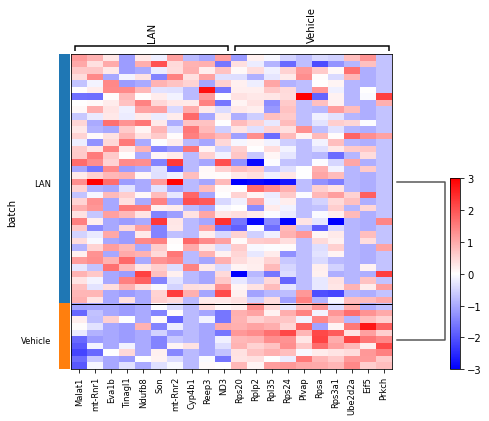

H2-Ab1++
Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9890362085896077


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


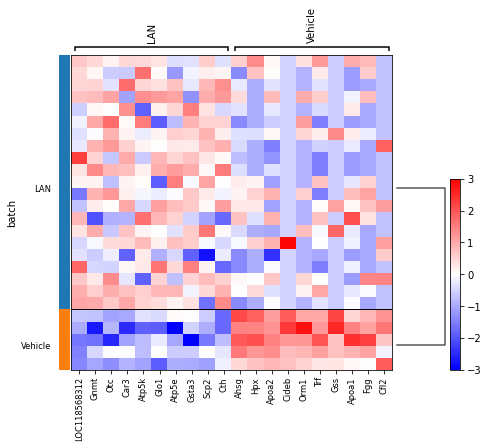

ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9494270793981955


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


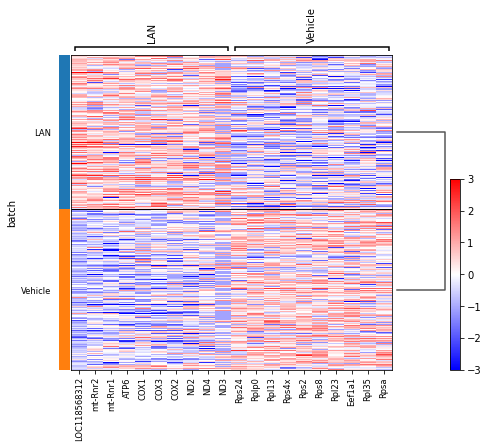

Jchain++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.898614094547981


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


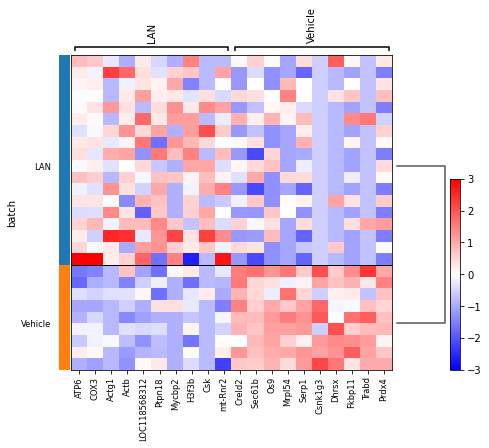

Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8613992650952402


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


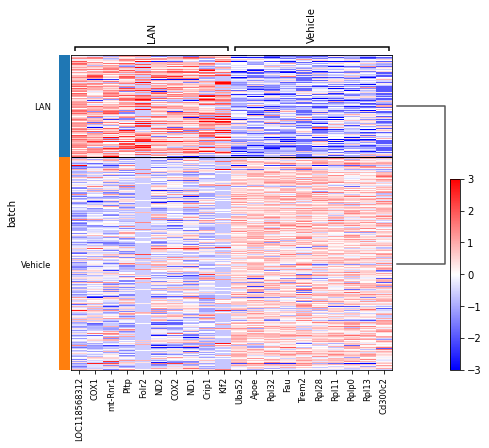

LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8405143720459324


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


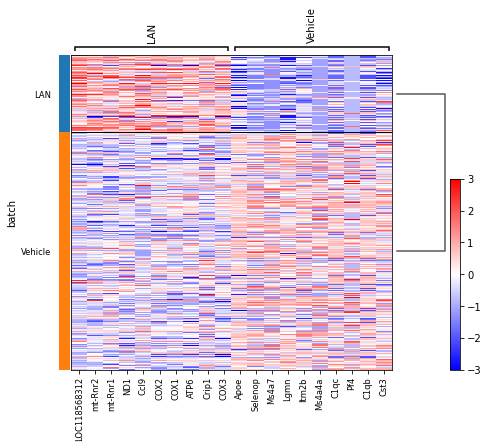

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8936388449441388


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


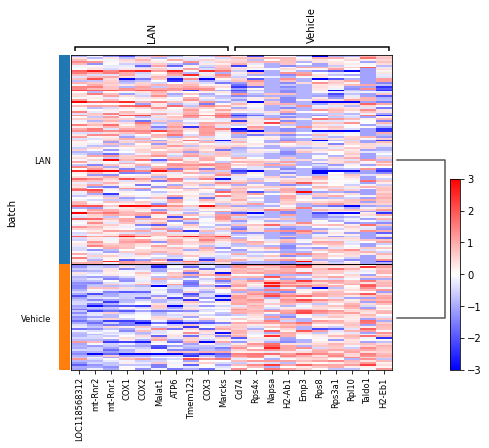

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9610302875210692


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


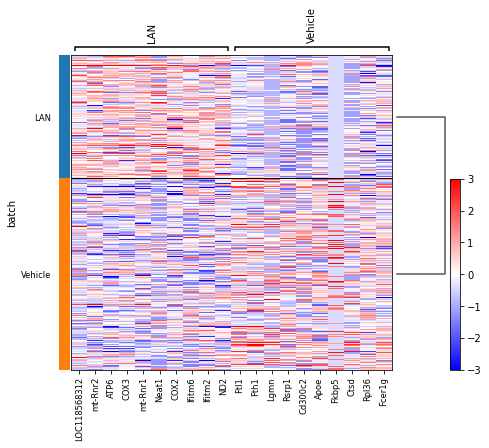

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.971072166982857


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


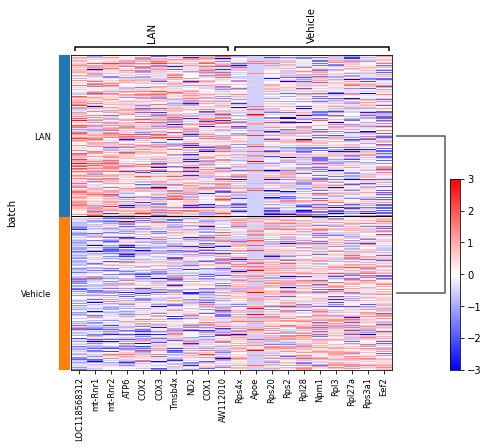

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9734533252639419


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


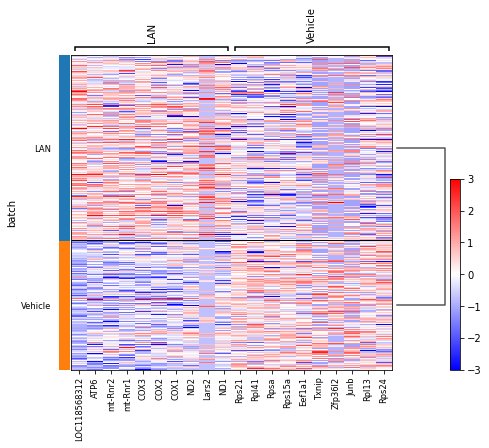

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9601928493163384


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


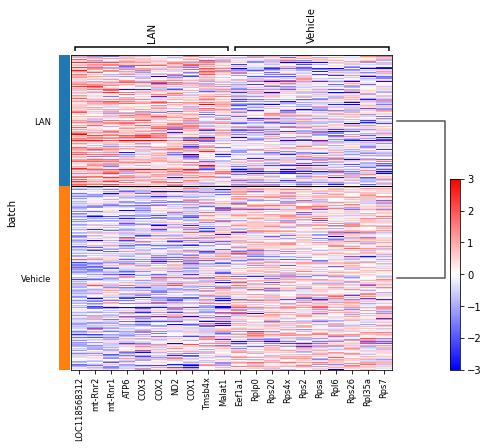

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9668594426160129


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


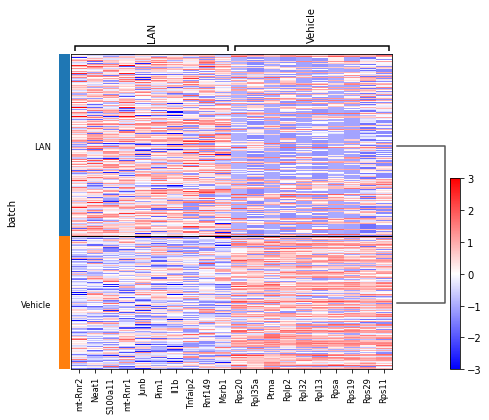

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9201633912889192


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


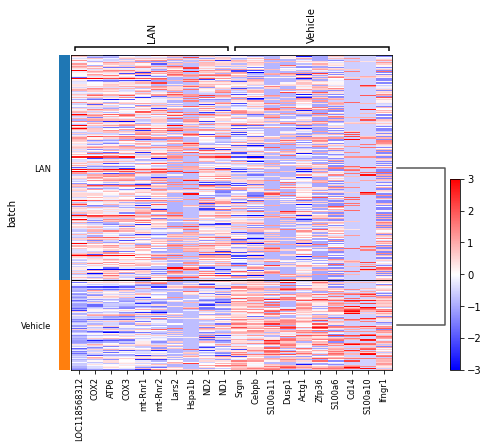

Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8676467166095003


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


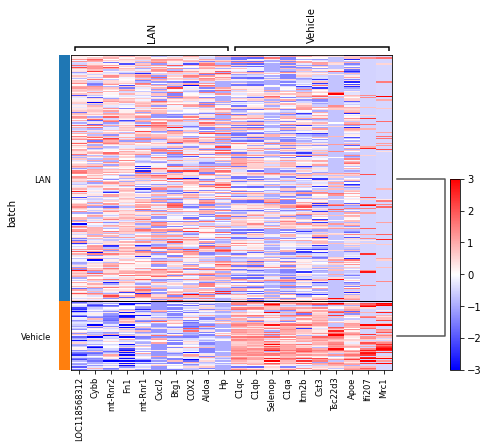

Stellate Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9687185993196642


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


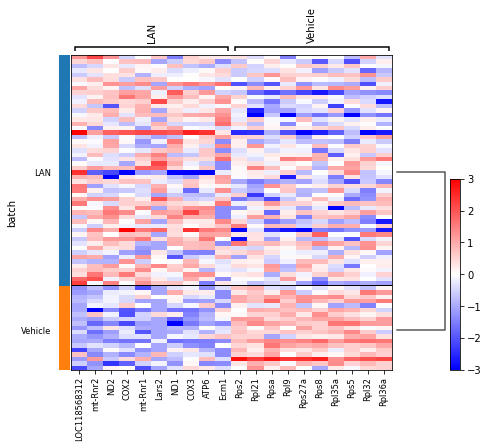

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8628436747435415


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


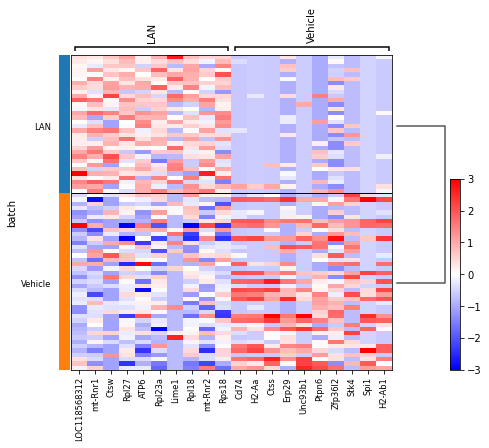

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9200250000014911


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


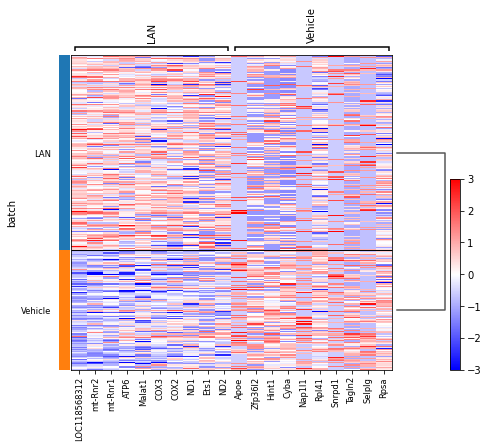

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8549630291691379


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


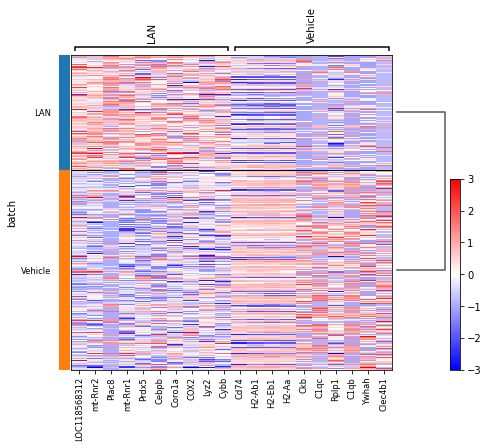

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9590306353587414


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


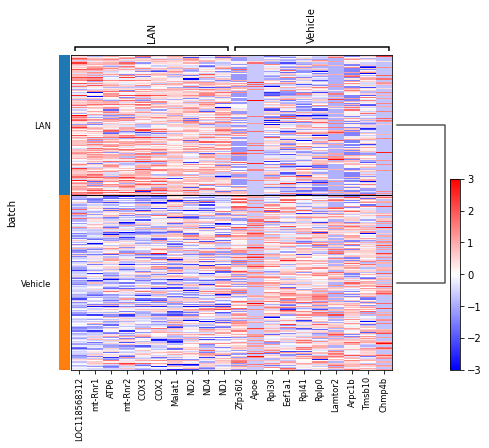

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9638948182706102


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


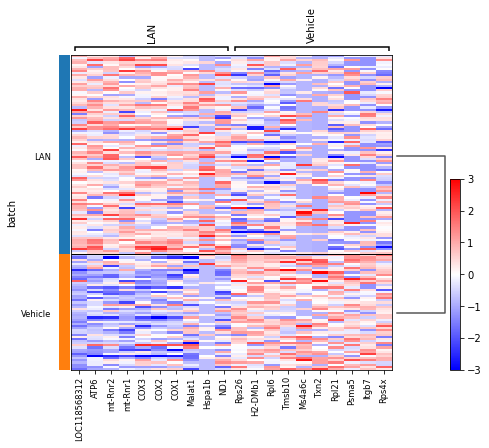

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9498191907322199


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


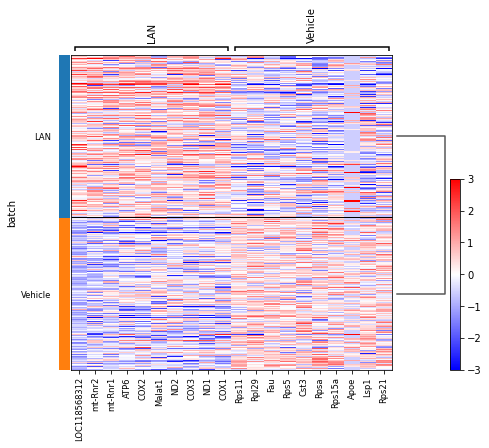

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9756892941274979


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


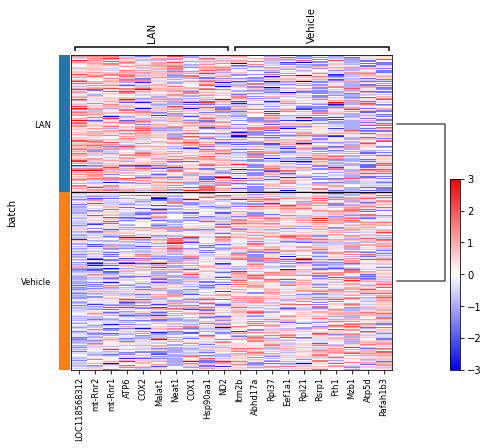

Vehicle x RCF+LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9711175541500883


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


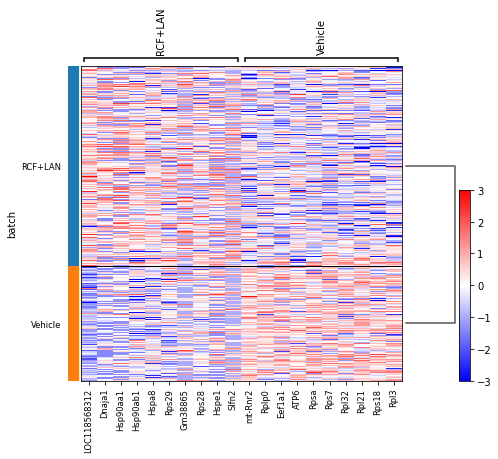

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9646742946180106


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


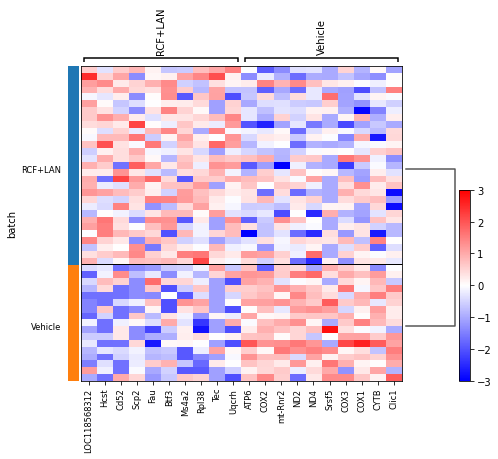

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8445495826583727


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


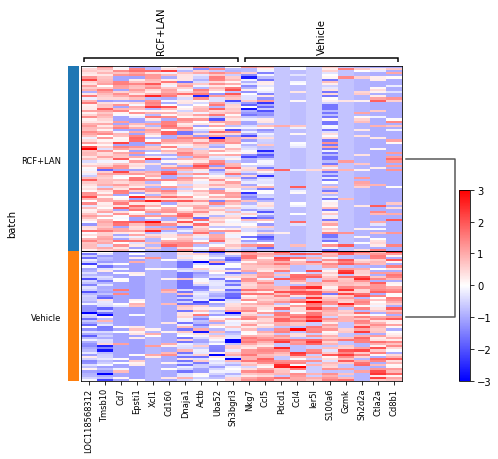

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.6739747089755702


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


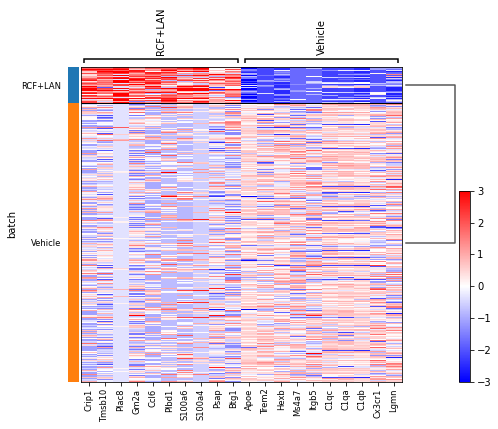

Cd79a++
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9775589029551333


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


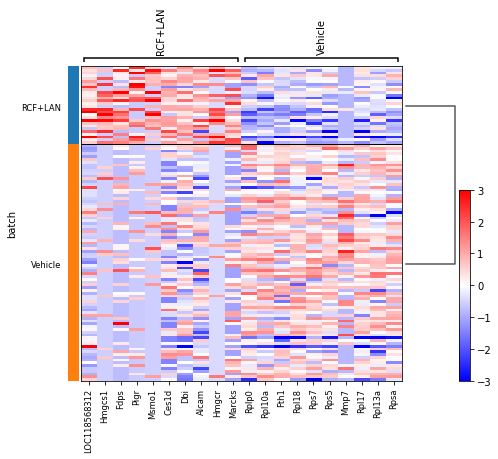

Ebf1++
Emp1++
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8496962547773365


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


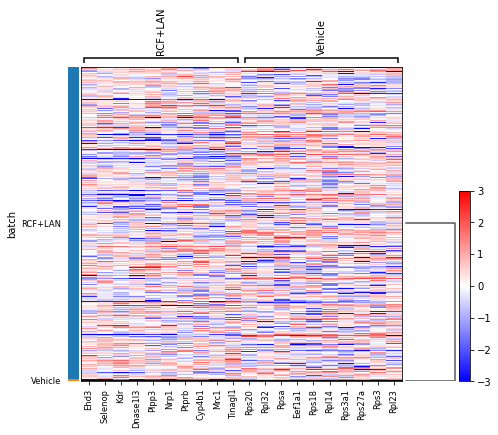

H2-Ab1++
Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9816532637475593


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


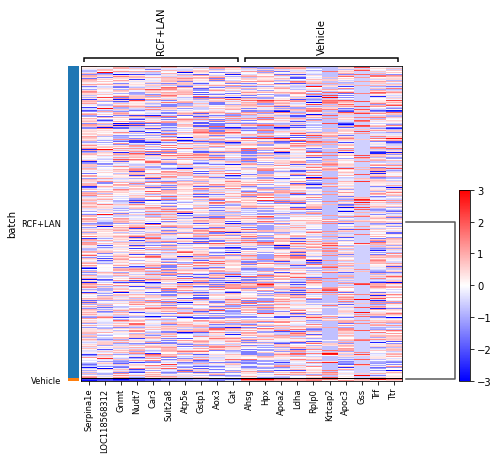

ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8675543482200918


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


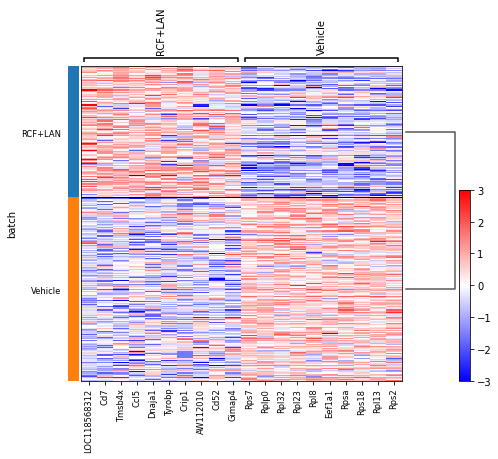

Jchain++
Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.6278098135352577


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


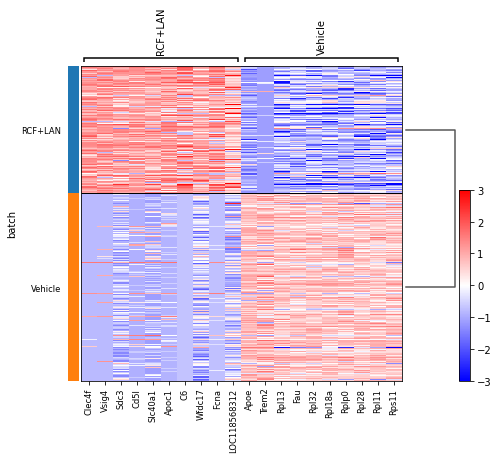

LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7946241404655621


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


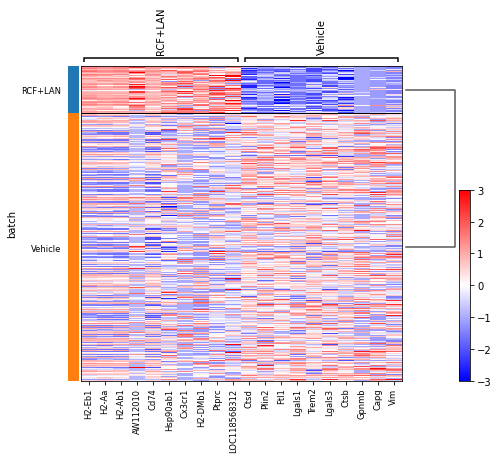

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9141787143689459


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


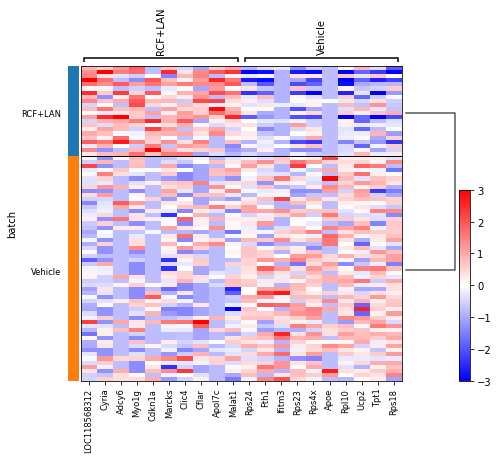

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9597641288344859


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


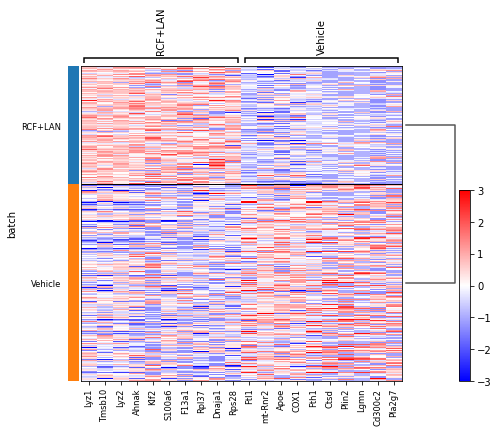

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9318558888819909


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


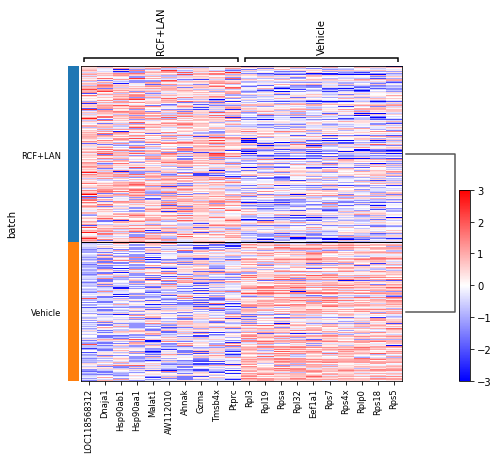

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9730233456081544


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


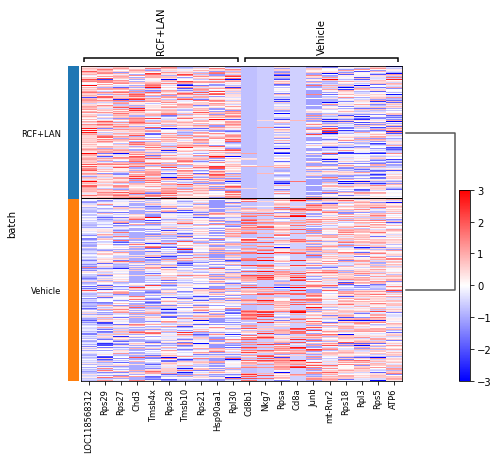

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9405825976835303


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


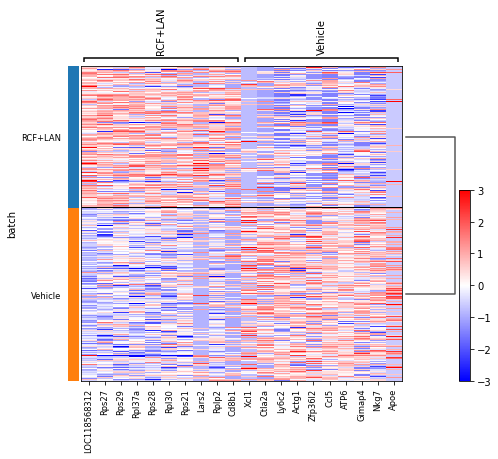

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9435870882027056


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


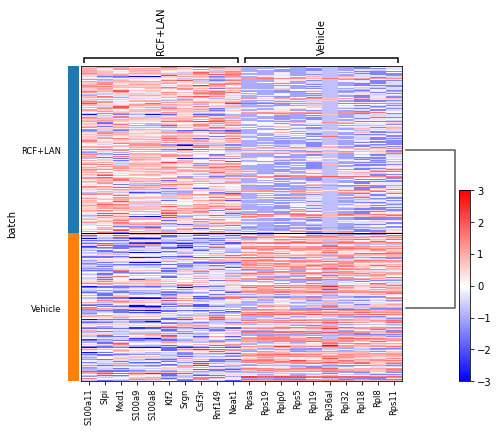

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9424924920758564


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


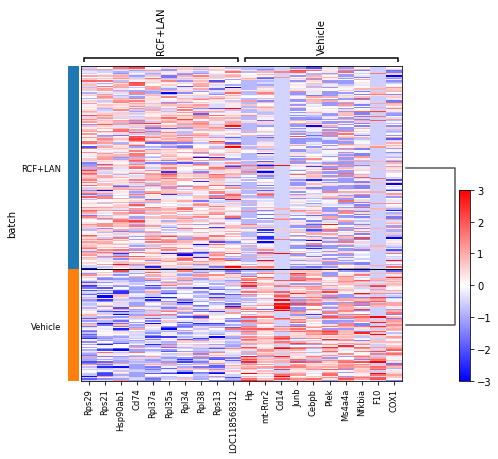

Peri. Macs
Stellate Cells
0.9050742551981922


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


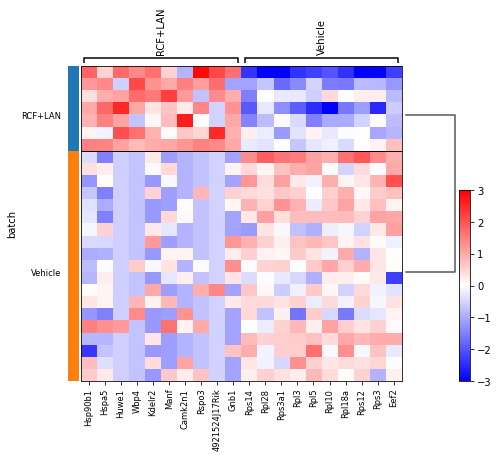

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7258504950648175


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


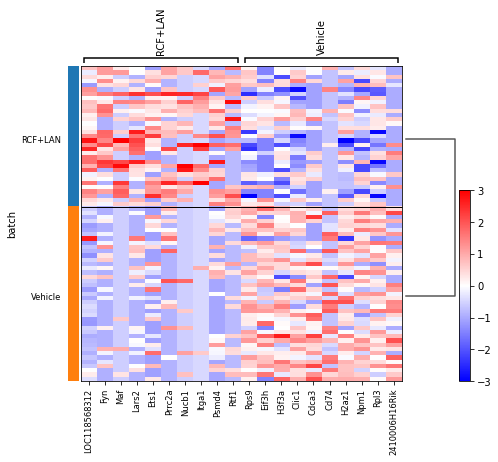

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9216526907338064


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


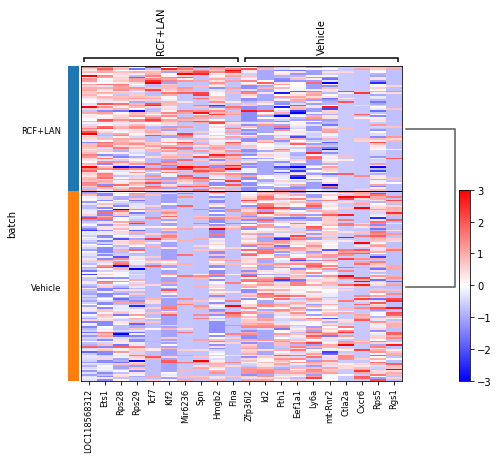

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.637292829447673


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


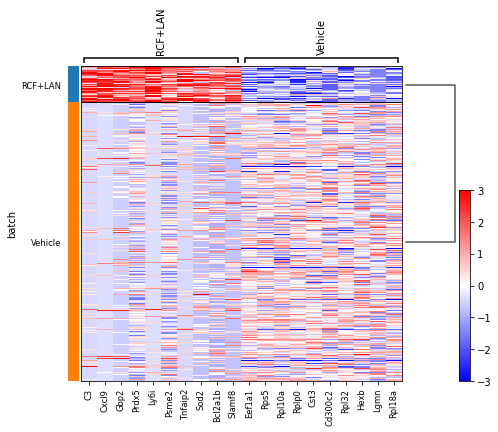

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9197449139643777


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


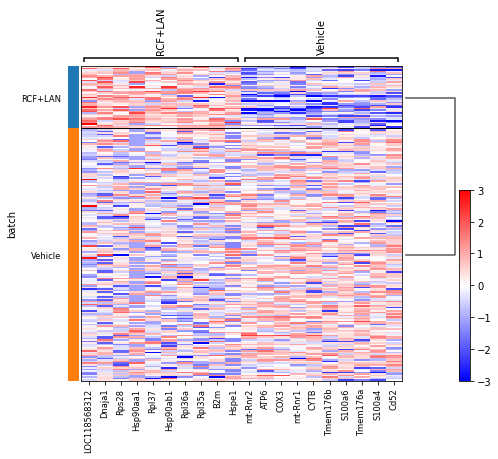

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.946686356999257


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


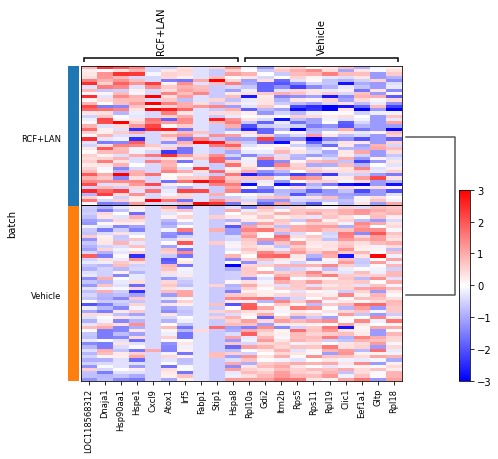

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.965169671985934


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


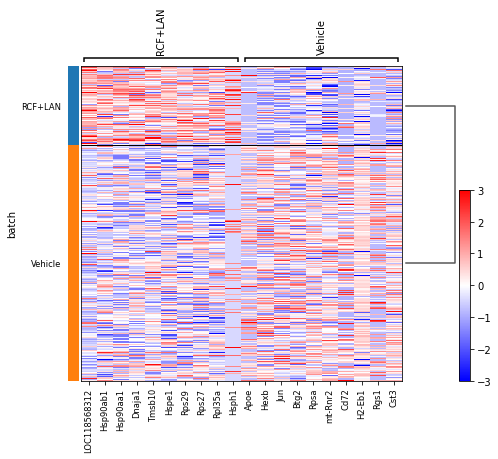

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.978817010370666


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


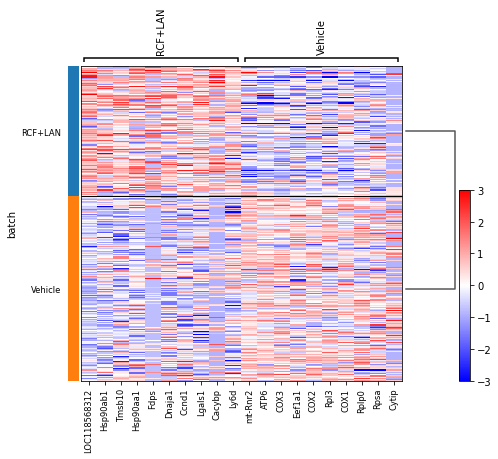

RCF x LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9089420034839298


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


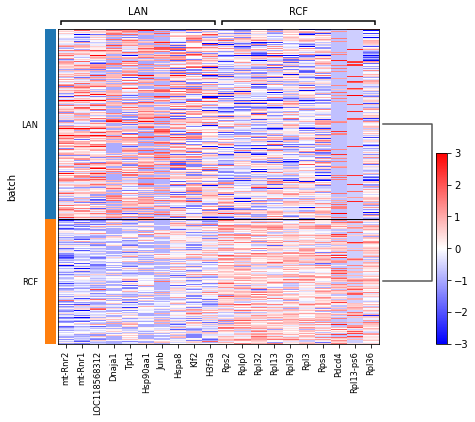

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9573584983415185


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


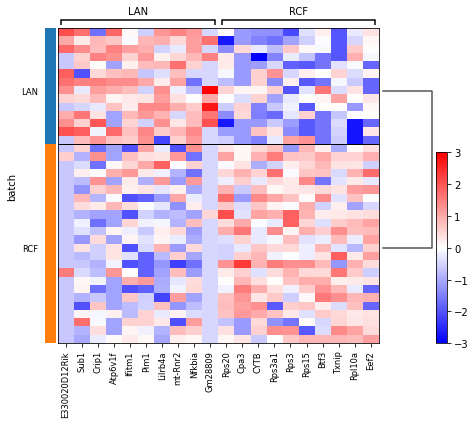

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8083838028743378


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


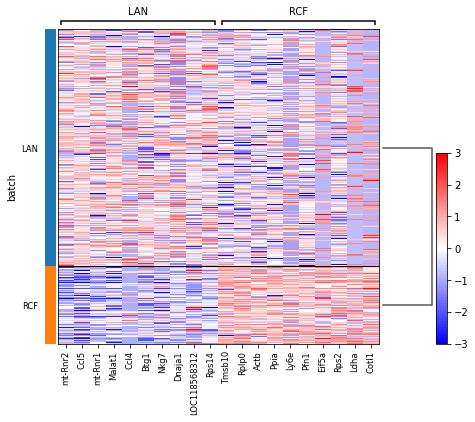

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9409888562780868


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


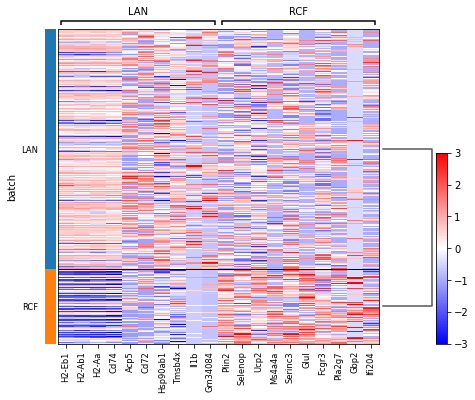

Cd79a++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9266588222856723


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


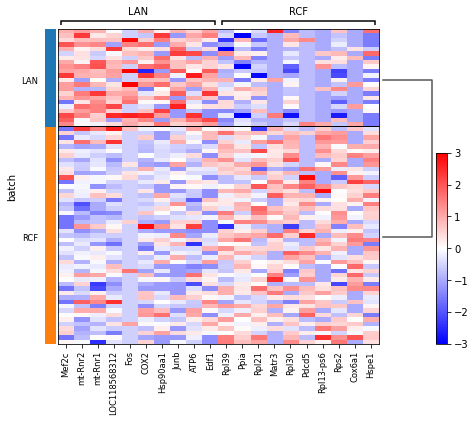

Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.992264457910031


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


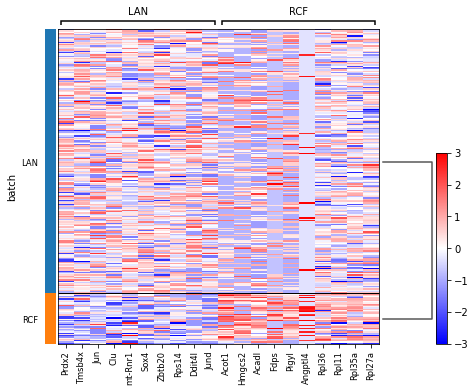

Ebf1++
Emp1++
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9770006202144406


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


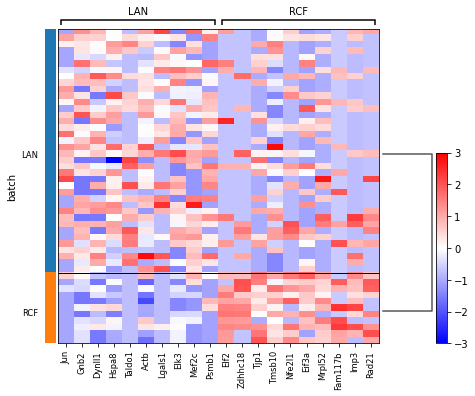

H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9628916908871


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


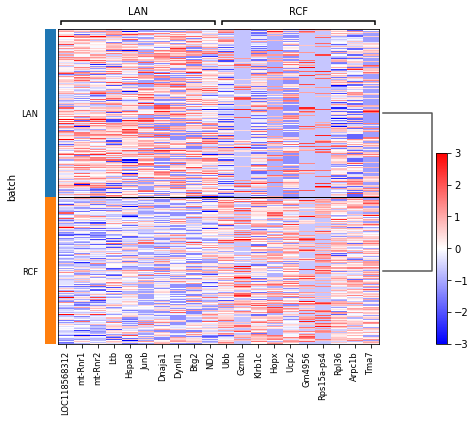

Jchain++
Kupffer Cells
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7856483674638016


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


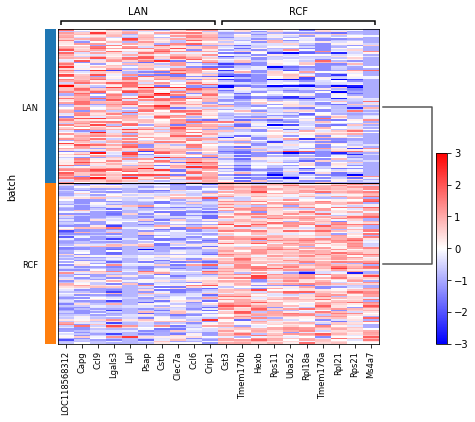

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9586988598361293


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


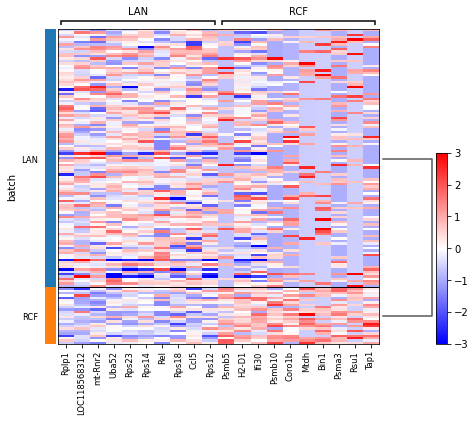

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9732417091450748


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


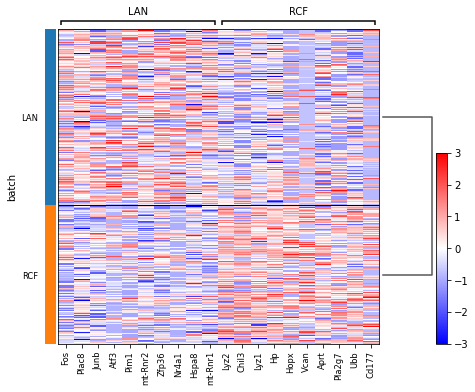

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9301817023172815


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


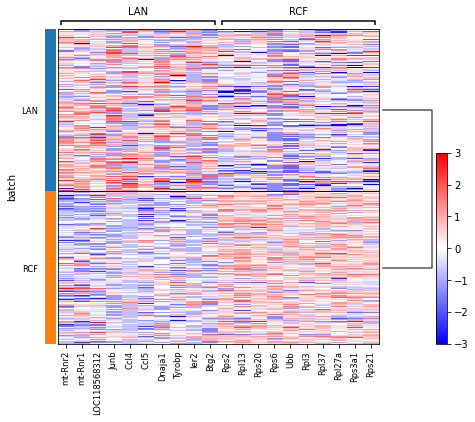

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9719915321320909


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


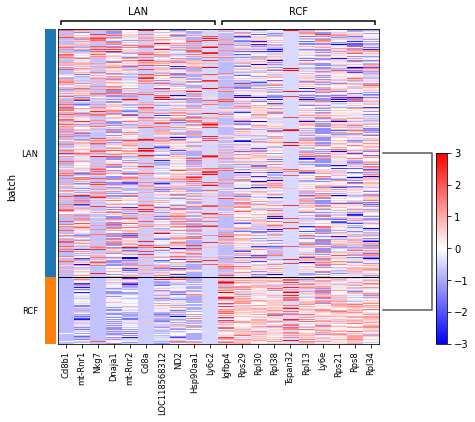

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8913892002213795


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


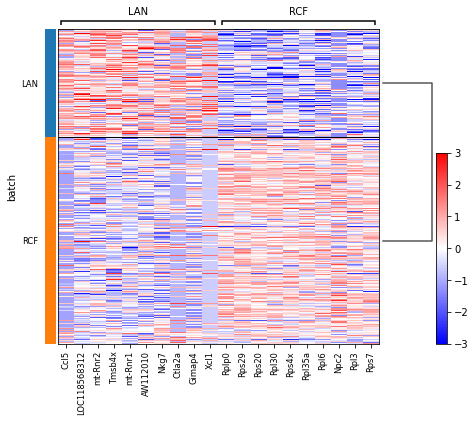

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9400013225147391


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


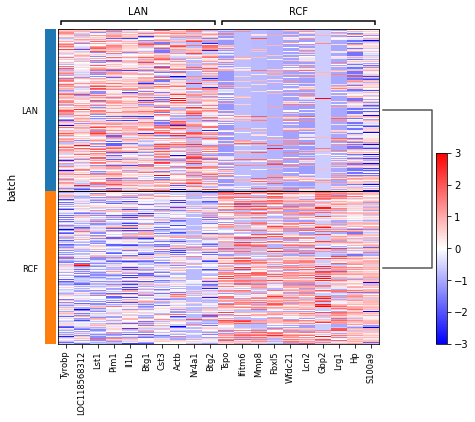

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8847193609045311


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


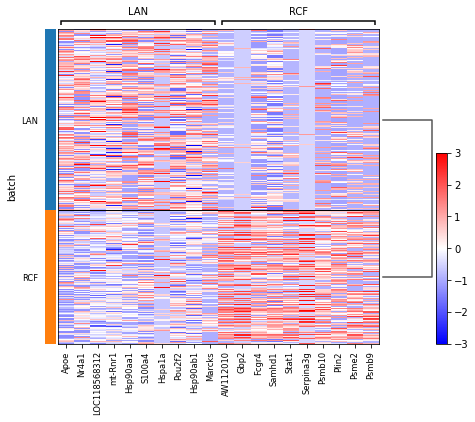

Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.844143252116536


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


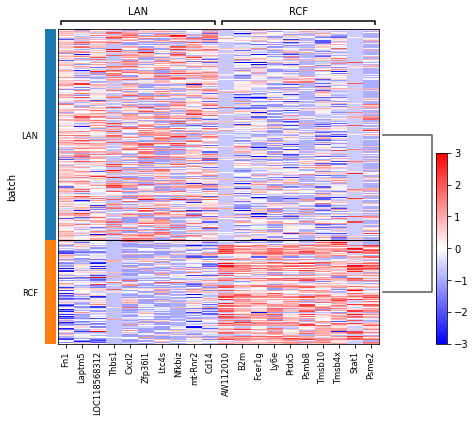

Stellate Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9743269545163594


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


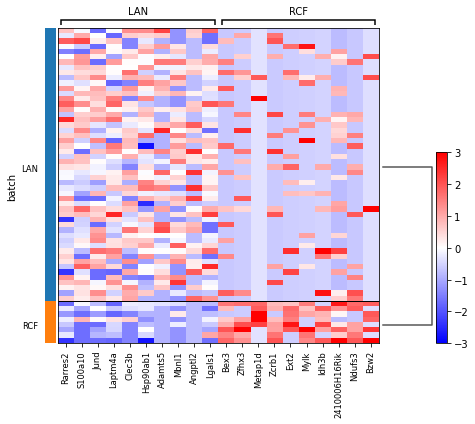

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9089746640284274


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


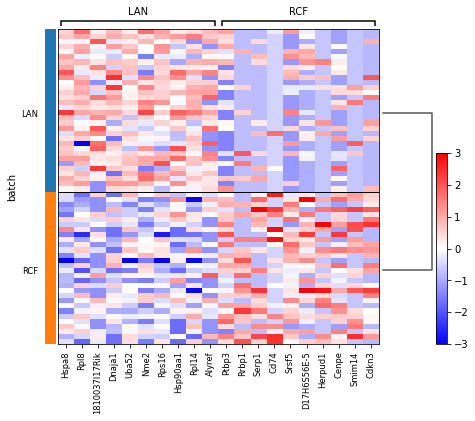

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8702171956567121


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


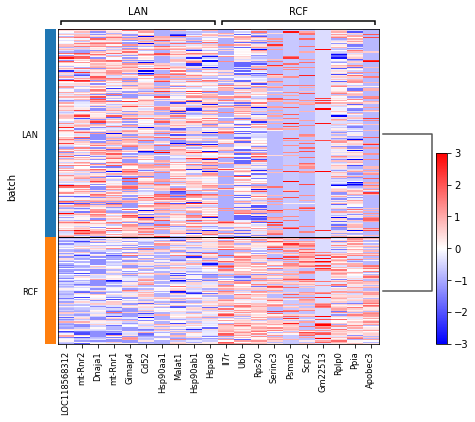

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.878714149812499


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


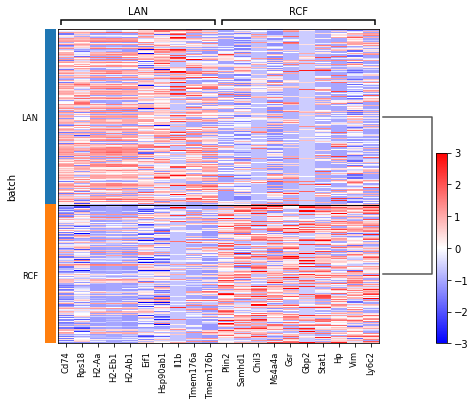

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9261864809641029


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


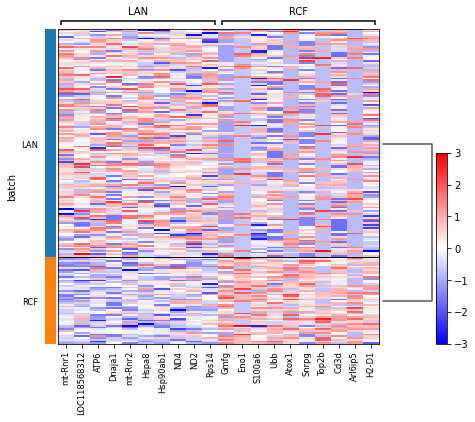

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.971661260343732


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


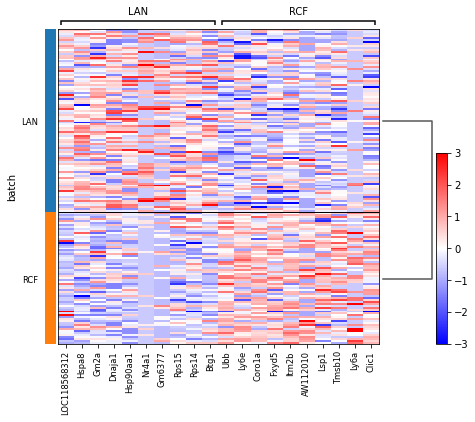

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.949671503335514


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


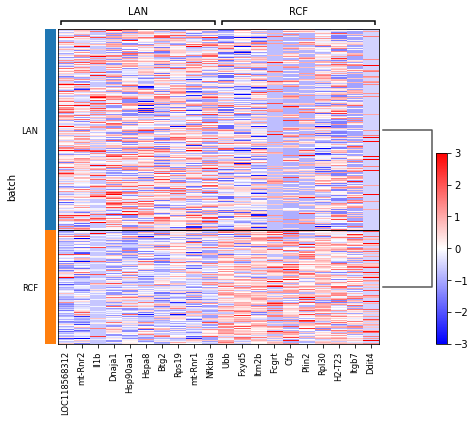

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9785422969992111


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


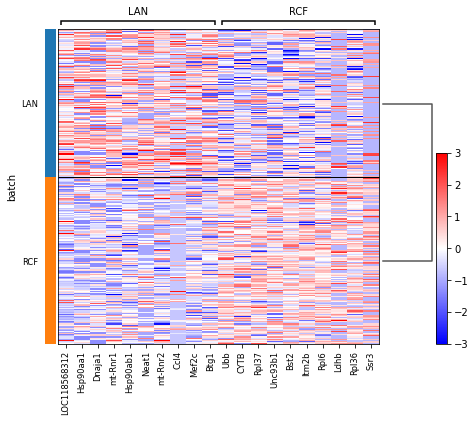

RCF x RCF+LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9469806815913943


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


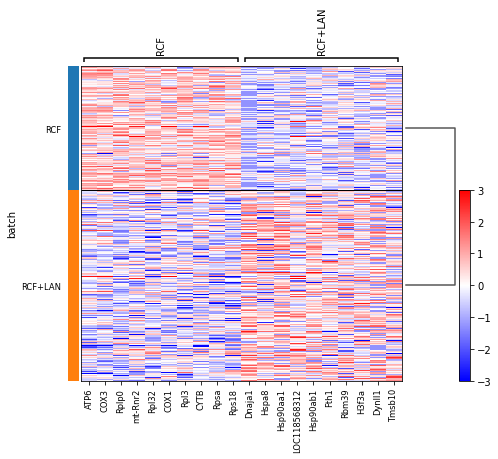

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.975688738956315


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


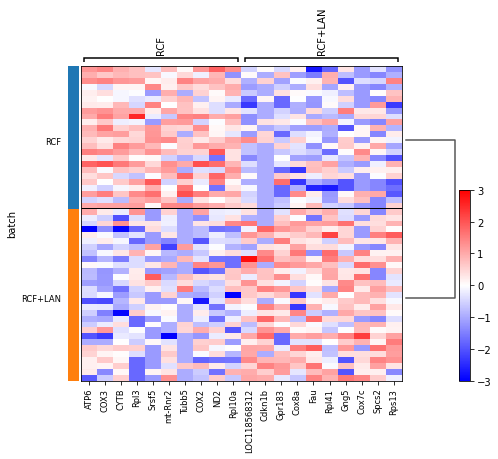

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9109670745903177


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


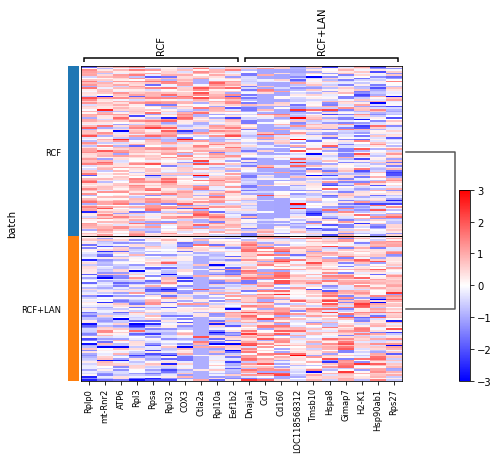

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7143797532692077


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


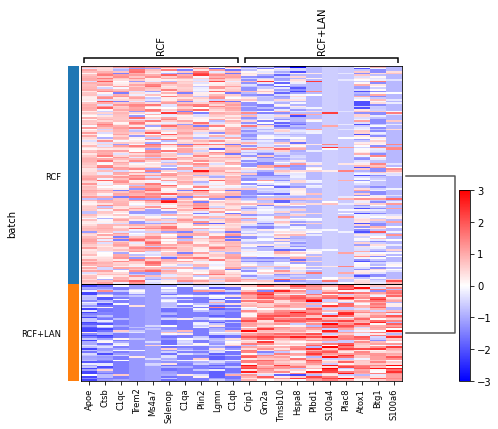

Cd79a++
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9800217978782998


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


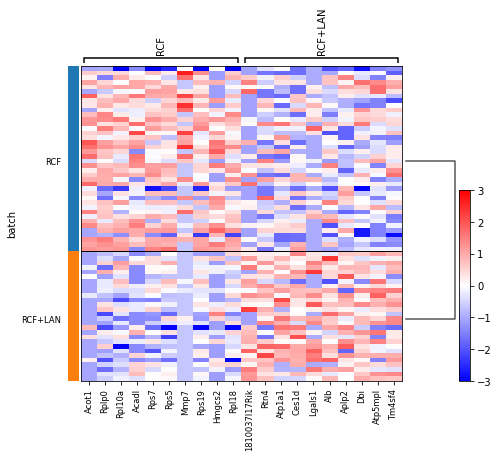

Ebf1++
Emp1++
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9252122888167519


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


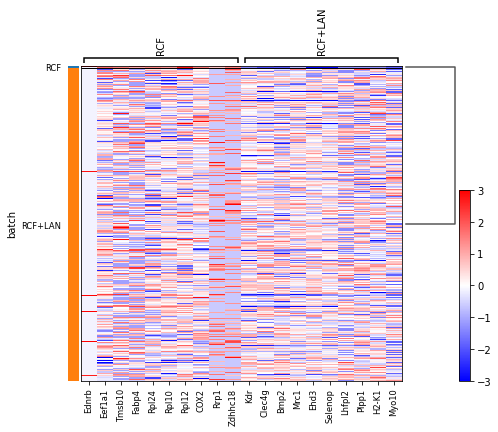

H2-Ab1++
Hepatocytes
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9335174530552801


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


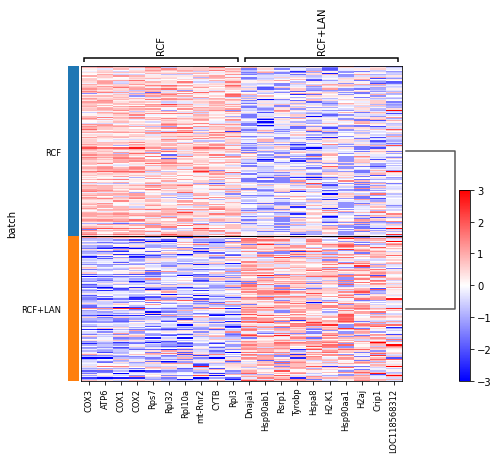

Jchain++
Kupffer Cells
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9188613572115869


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


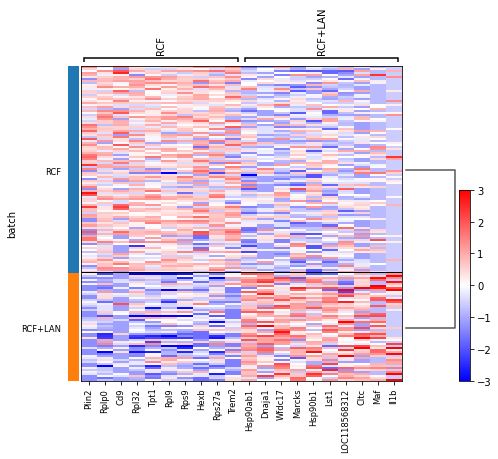

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9648338905253524


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


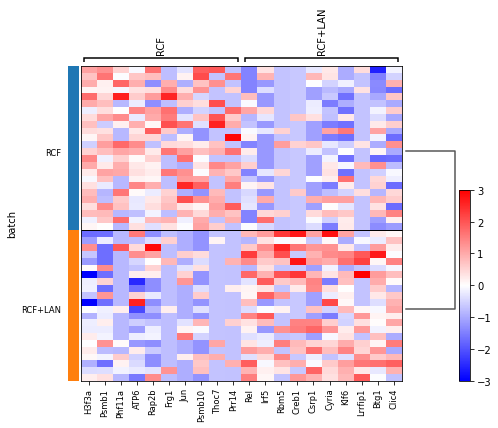

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.974698220514878


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


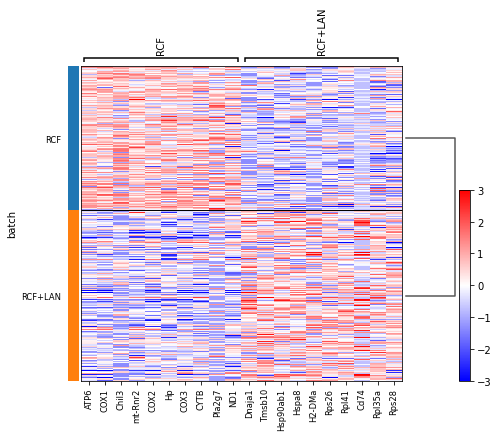

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8986549073320014


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


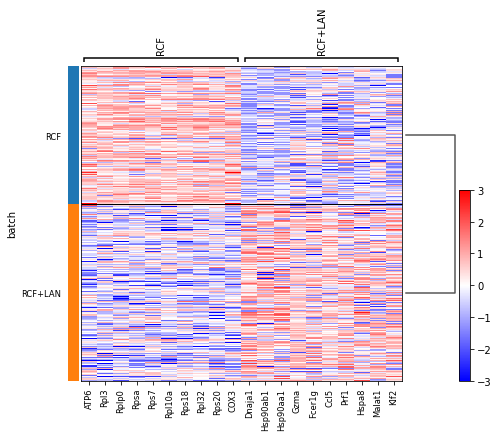

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9774924339895524


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


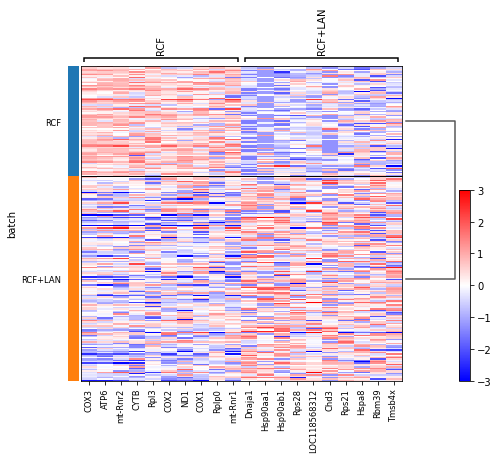

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9762743820898546


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


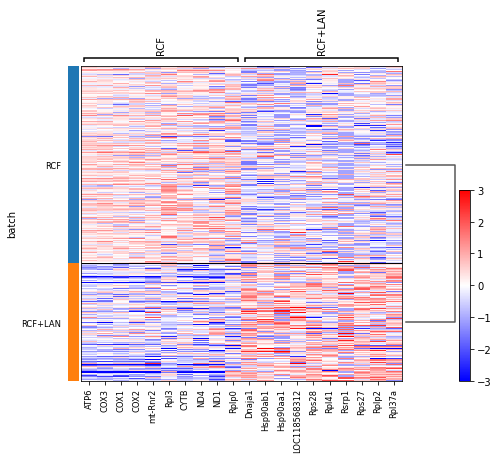

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9489305214338141


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


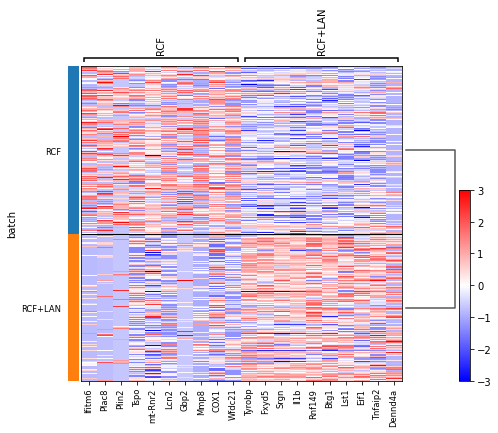

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9060887029364607


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


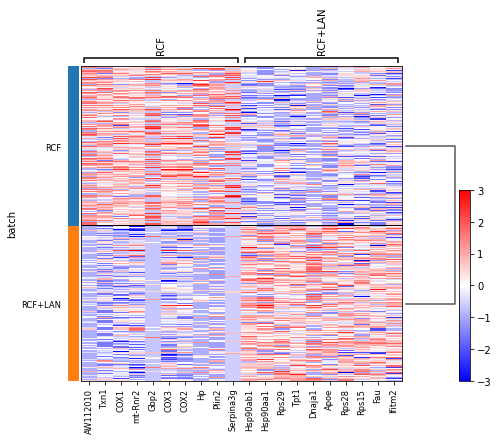

Peri. Macs
Stellate Cells
0.8963286760658636


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


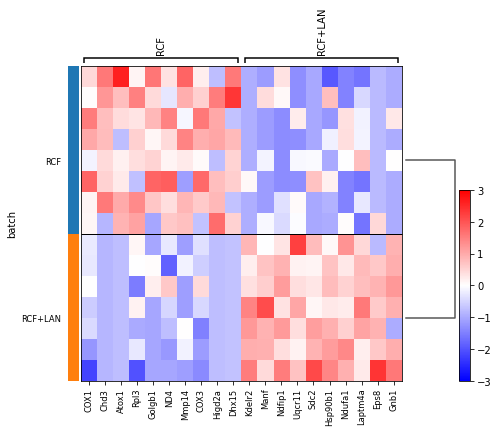

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7829657022175049


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


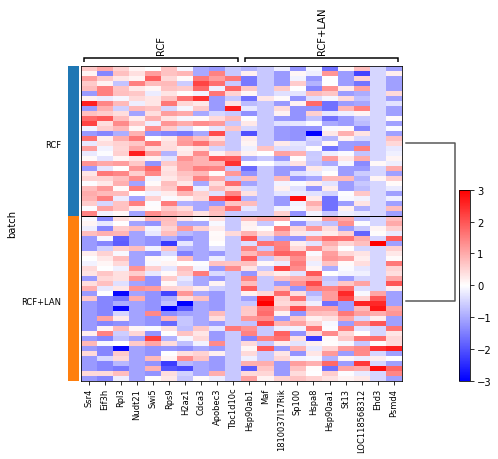

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9225808406131736


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


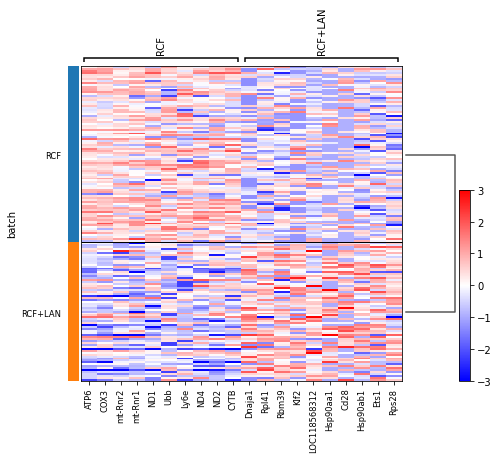

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7471246477013034


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


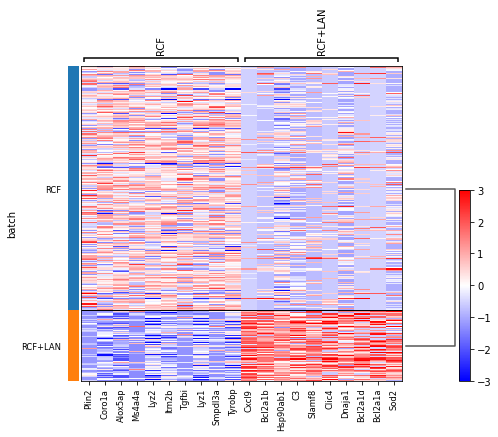

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9057241861907238


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


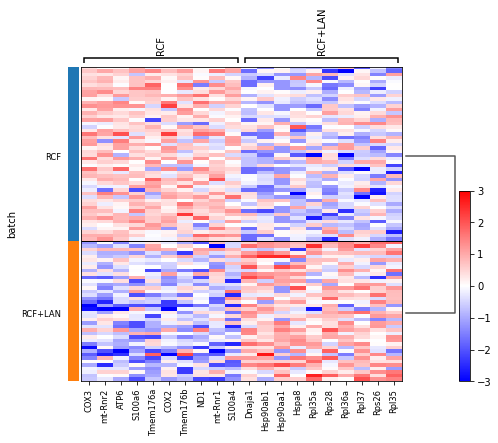

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9483456431443968


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


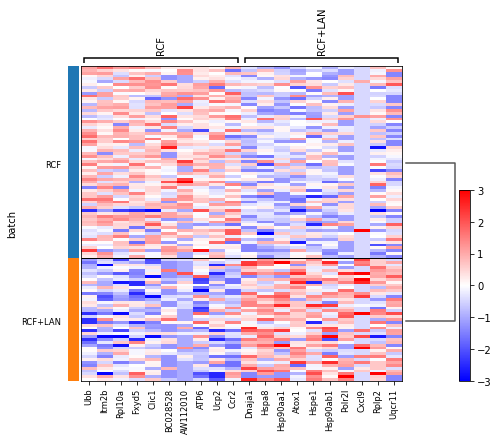

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9599838023440781


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


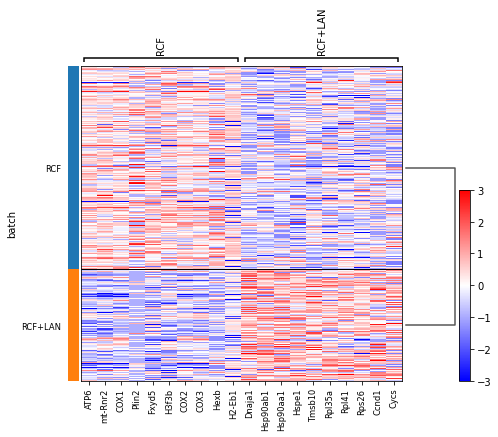

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9776368835895966


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


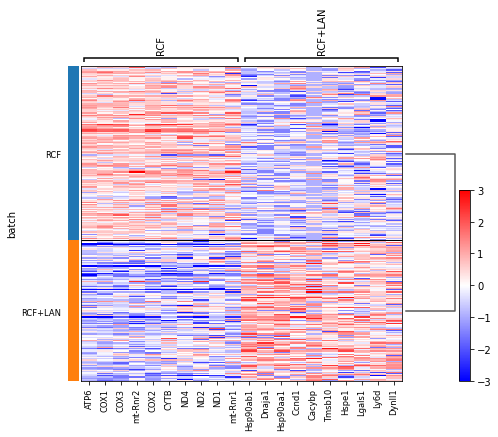

LAN x RCF+LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9544677027691496


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


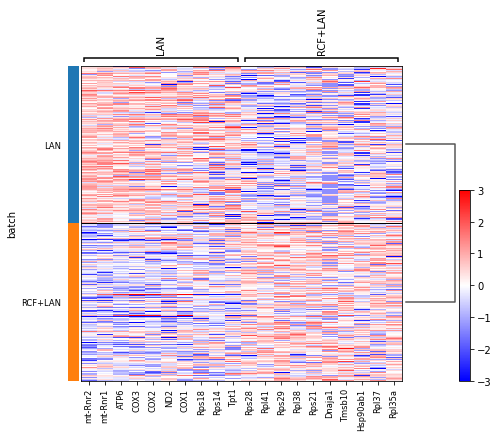

Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9513934129868302


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


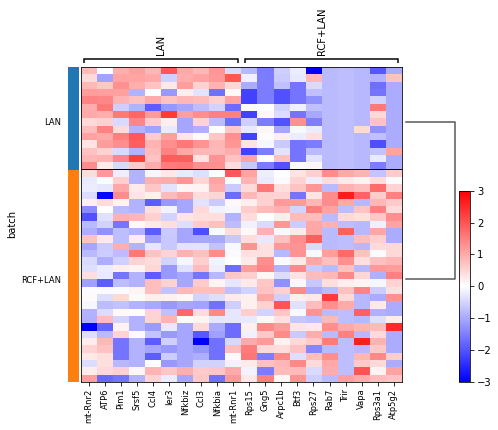

Blood
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8497212310690956


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


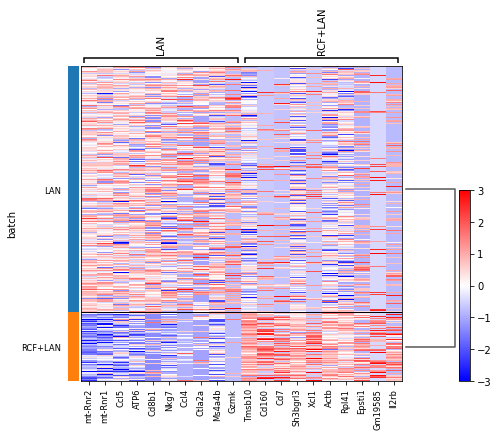

CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7556424608581922


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


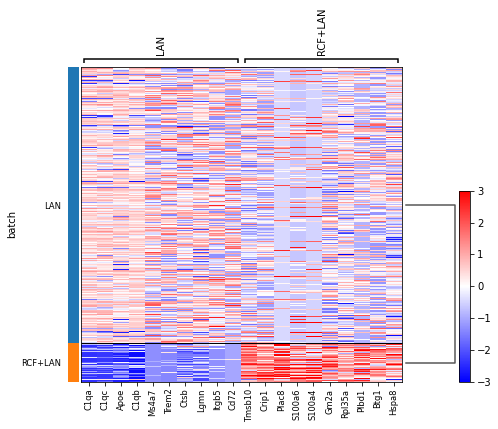

Cd79a++
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9834449602139207


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


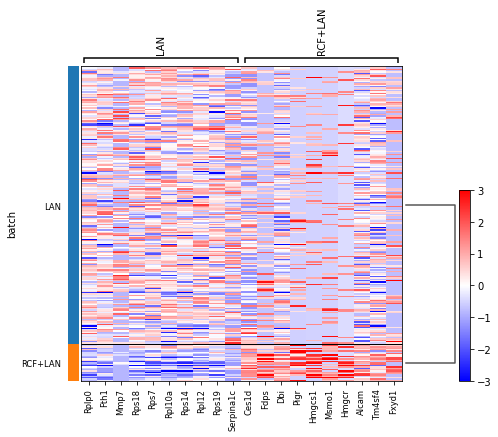

Ebf1++
Emp1++
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9109761516393607


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


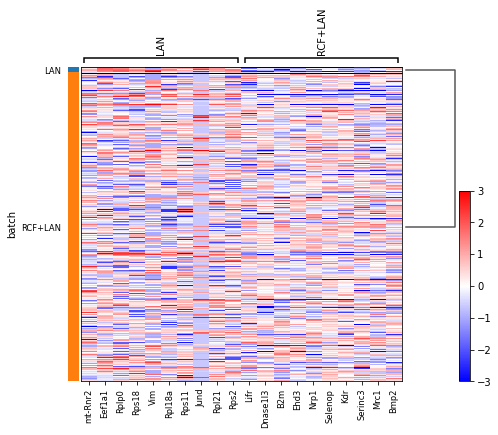

H2-Ab1++
Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9907063091767483


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


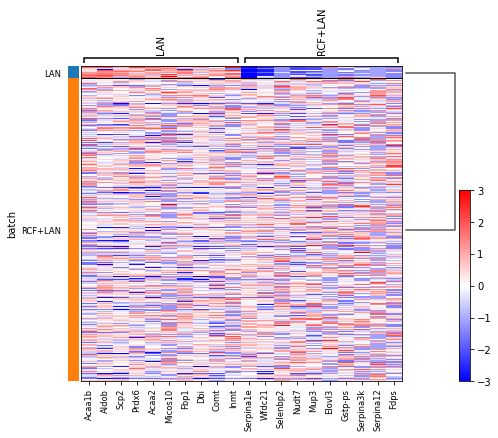

ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9026231229493716


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


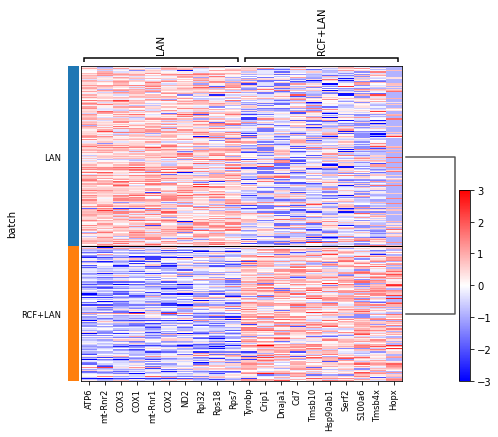

Jchain++
Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8682364467862296


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


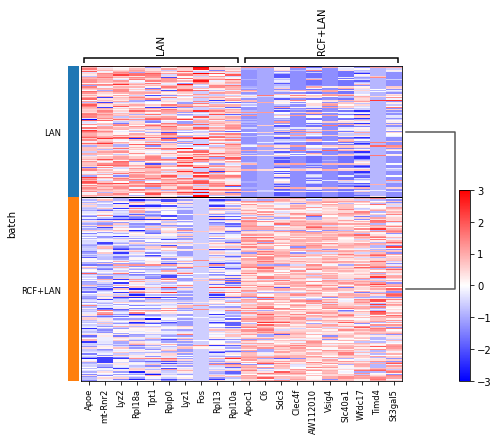

LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7917492224297376


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


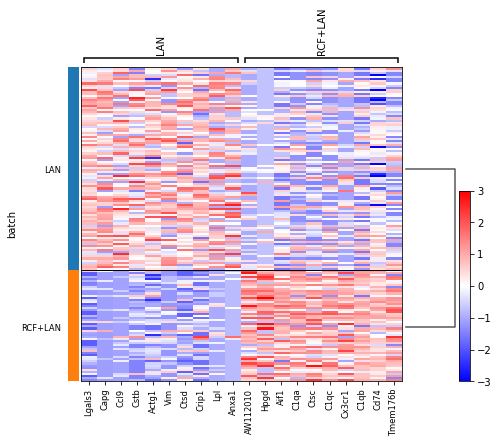

Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9718875040310927


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


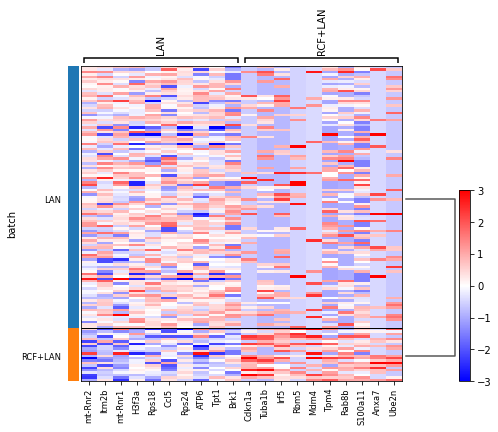

Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9759252782944847


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


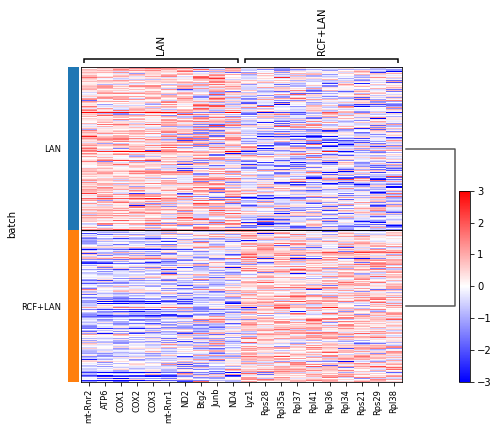

NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9382001404284138


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


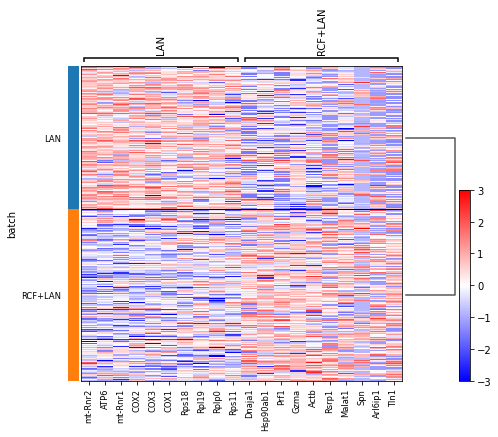

NKT Cells
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9688714789483325


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


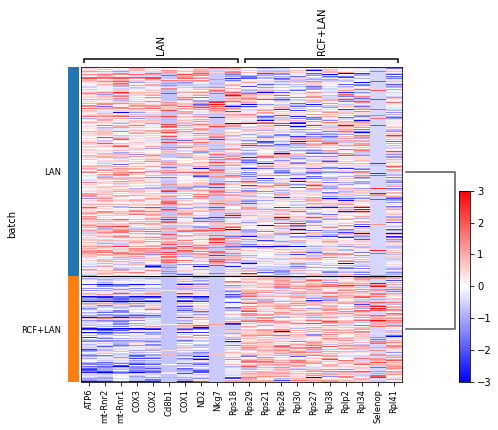

Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9209115097377527


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


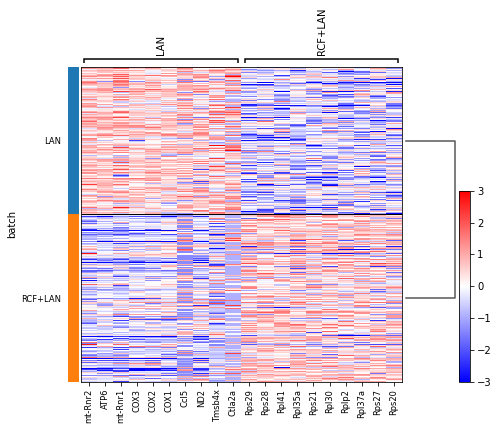

Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9835592837052756


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


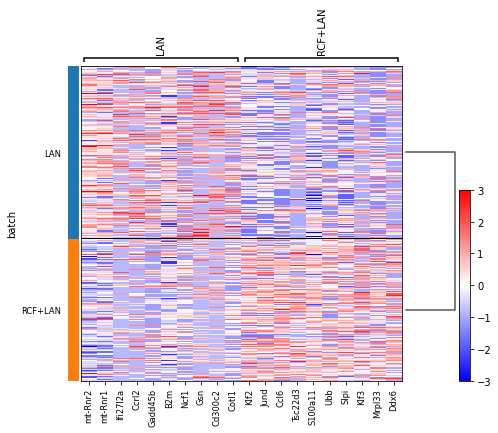

Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9336926850278076


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


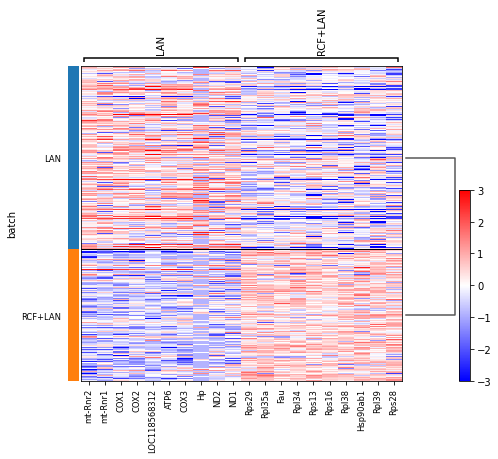

Peri. Macs
Stellate Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9729230061713694


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


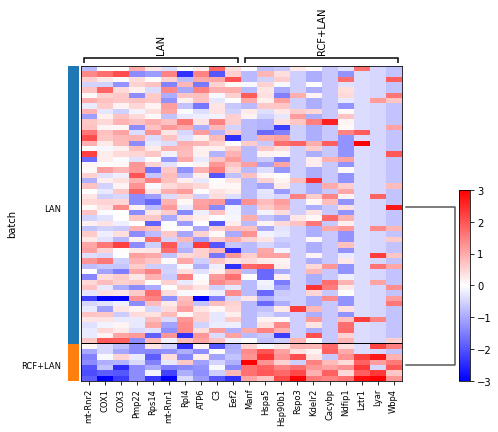

Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.725081279582924


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


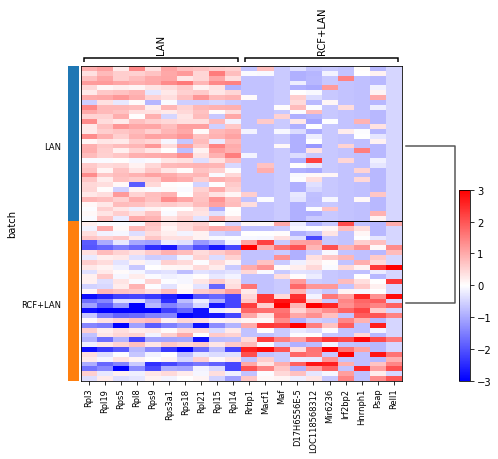

TEM
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8805346474506748


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


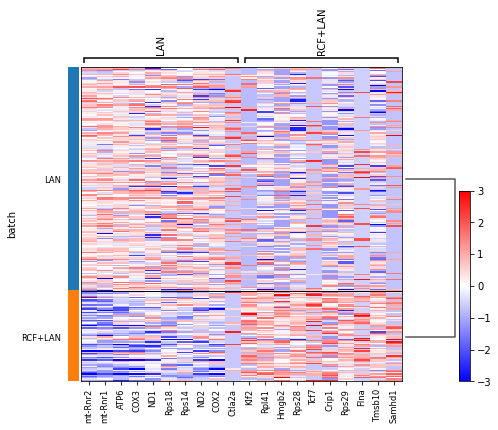

Th1s
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.7802254565614972


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


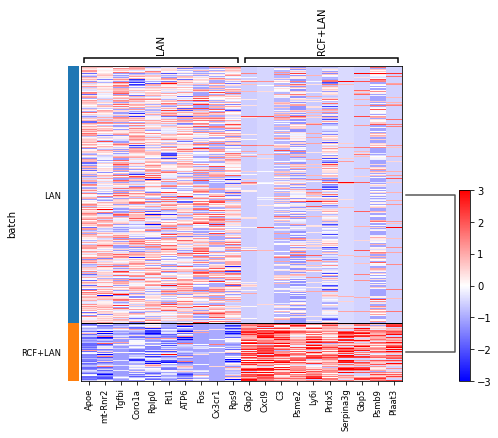

VSMCs
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.8826171587685415


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


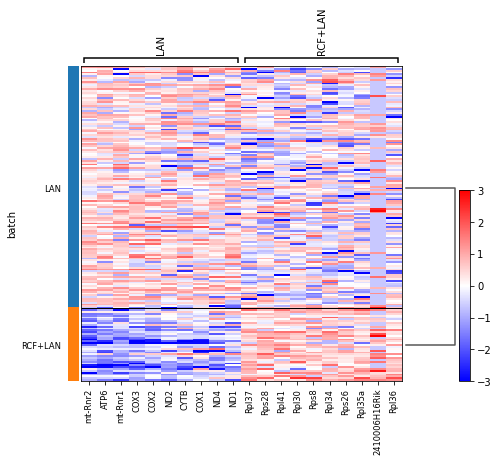

cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9524358165644383


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


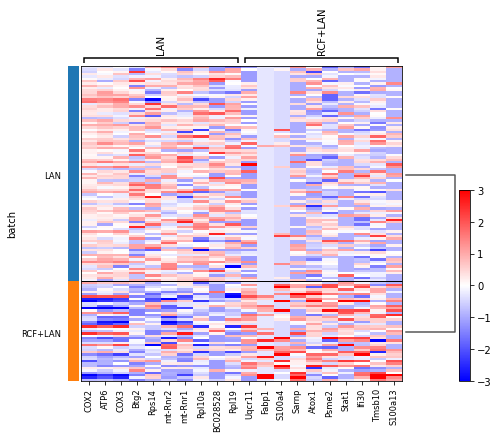

cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.9541135952595815


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


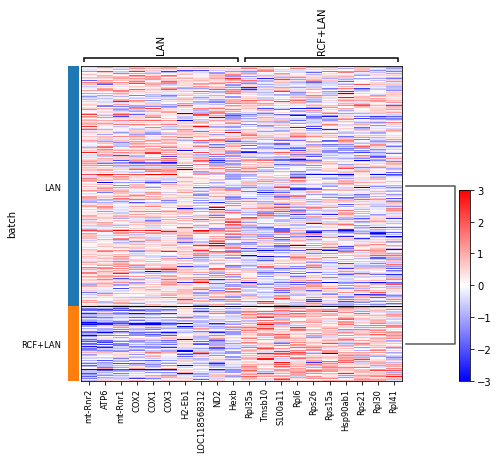

pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


0.971482671670486


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


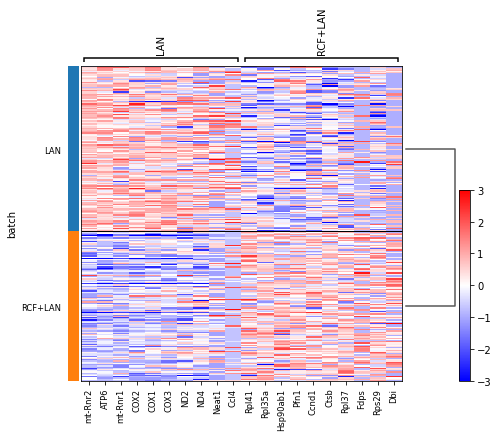

                  Normal x Vehicle Normal x RCF Normal x LAN Normal x RCF+LAN  \
B Cells                    0.92097     0.818554     0.872245         0.884523   
Basophils                 0.967749     0.968189     0.962558         0.955509   
Blood                         None         None         None             None   
CTLs                       0.93941     0.844678     0.891891         0.847889   
CV & Cap. Macs                None         None         None             None   
Cd79a++                       None         None         None             None   
Cholangiocytes                None         None         None             None   
Ebf1++                        None         None         None             None   
Emp1++                        None         None         None             None   
Endothelial Cells             None         None         None             None   
H2-Ab1++                      None         None         None             None   
Hepatocytes                 

In [11]:
#treatment = ['NonfatVehicle', 'FriedVehicle', 'FriedCRV431', 'FriedLANI', 'FriedCRVLAN']
treatment = ['Normal', 'Vehicle', 'RCF', 'LAN', 'RCF+LAN']
mtxPath = "/Volumes/Expansion/Hepion/Data/"
tempData = {t:input.loadSTAR(f"{mtxPath}{t}/", labels=True, make_unique=False) for t in treatment}
treatmentSimilarityDF = out.rankCellTypes(tempData, treatment, heatmap=True, silent=False)
tempData=None
print(treatmentSimilarityDF)


In [12]:
### Combines cluster correlations w # of DEGs
combinedDF = pd.merge(treatmentSimilarityDF, gdf, left_index=True, right_index=True,how='right')
combinedDF = combinedDF.reindex(sorted(combinedDF.columns), axis=1)
print(combinedDF)

combinedDF.to_csv("cluster_similarity_scores.csv")

                  LAN x RCF+LAN  LAN x RCF+LAN DEGs Normal x LAN  \
B Cells                0.954468                  30     0.872245   
Basophils              0.951393                  64     0.962558   
CTLs                   0.849721                 243     0.891891   
CV & Cap. Macs         0.755642                 277         None   
Cd79a++                    None                   0         None   
Cholangiocytes         0.983445                  80         None   
Endothelial Cells      0.910976                 270         None   
Hepatocytes            0.990706                 101         None   
ILC1s                  0.902623                 119     0.917333   
Jchain++                   None                   0         None   
Kupffer Cells          0.868236                 342         None   
LAMs                   0.791749                 353         None   
Mig. cDCs              0.971888                  92         None   
Monocytes              0.975925                 

In [24]:
mtxPath = "/Volumes/Expansion/Hepion/Data/"
theTs = ['FriedVehicle', 'FriedCRV431']
miData = {t:input.loadSTAR(f"{mtxPath}{t}/", labels=True, make_unique=False) for t in theTs}


heatData = process.catAdata(miData, theTs)
forbidden=['Cd79a++', 'Emp1++','Jchain++', 'Ebf1++']
for ct in forbidden:
    heatData = heatData[heatData.obs['coarseClusters']!=ct].copy()
sc.pp.highly_variable_genes(heatData, n_top_genes=3000, flavor='seurat_v3')
heatData = heatData[:,heatData.var.highly_variable]
heatData = process.dgeNorm(heatData, useRaw=False, scale=True, pca=True)
print("Ranking Gene Groups")
#sc.tl.rank_genes_groups(heatData, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False, cor_method='spearman')
print('Ranking Gene Groups2')
#sc.tl.rank_genes_groups(heatData, 'fineClusters', method='wilcoxon', use_raw=False, max_iter=2000, pts=False,n_genes=30, cor_method='pearson')
sc.tl.rank_genes_groups(heatData, 'coarseClusters', method='t-test', n_genes=30, cor_method='pearson')
#sc.tl.rank_genes_groups(heatData, 'fineClusters', method='wilcoxon', n_genes=30, cor_method='pearson')
#sc.tl.dendrogram(heatData, groupby='batch', )
print("finished")



/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Ranking Gene Groups
Ranking Gene Groups2
finished


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


In [23]:
print(heatData)
#print(np.unique(heatData.obs['coarseClusters']))
#forbidden=['Cd79a++', 'Emp1++','Jchain++']
#print(heatData.obs['coarseClusters']!='')

AnnData object with n_obs × n_vars = 8359 × 3000
    obs: 'coarseClusters', 'fineClusters', 'batch'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'rank_genes_groups', 'batch_colors', 'dendrogram_batch', 'dendrogram_batch_fineClusters'
    obsm: 'X_pca'
    varm: 'PCs'


categories: FriedCRV431, FriedVehicle
var_group_labels: B Cells, Basophils, Cholangiocytes, etc.


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


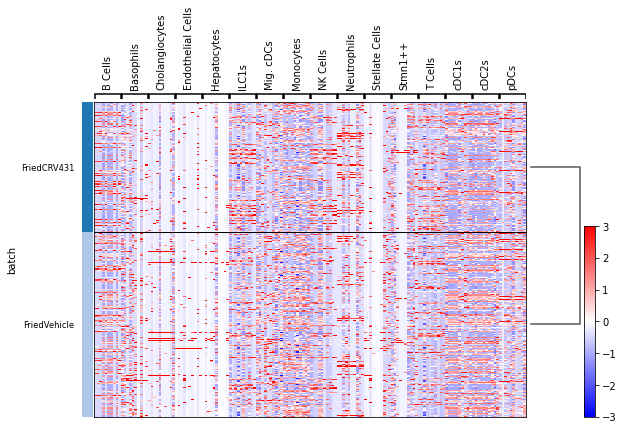

In [26]:
#draw.heatmapper(heatData, groupby=['batch','fineClusters'])
draw.heatmapper(heatData, groupby=['batch'])


Normal x Vehicle


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
B Cells
267
42


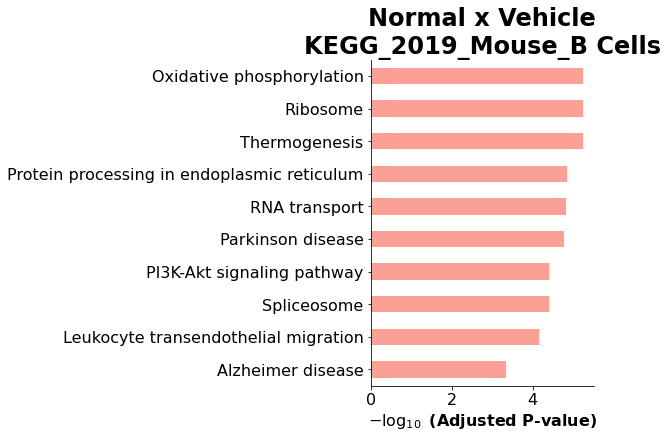

Basophils
No sig. genes
CTLs
18
1


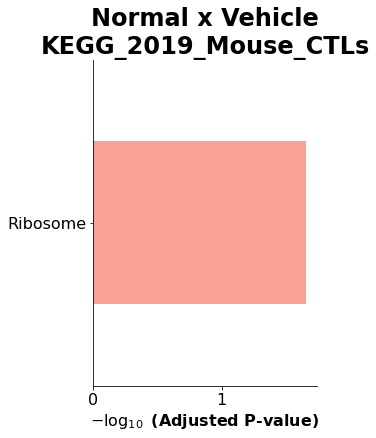

ILC1s
18
19


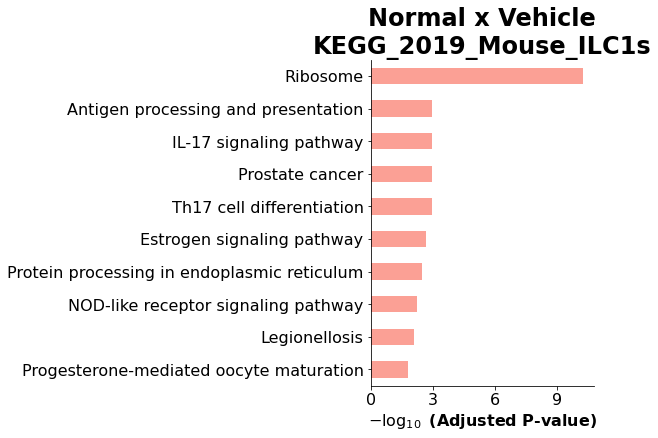

Monocytes
337
62


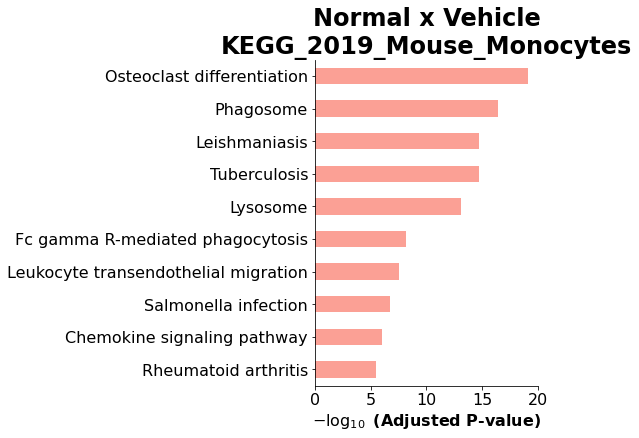

NK Cells
45
7


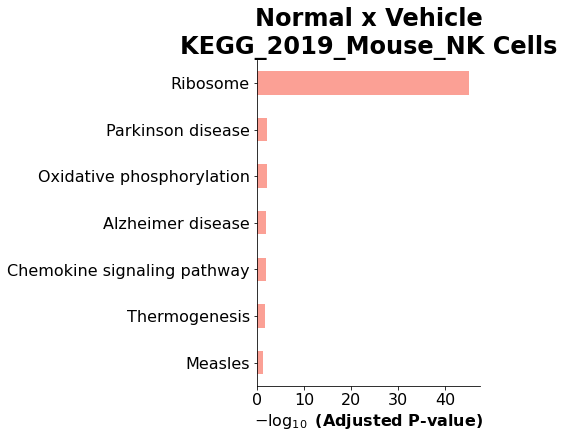

Naive CD4+
15
No Significant Stuffs
Naive CD8+
118
8


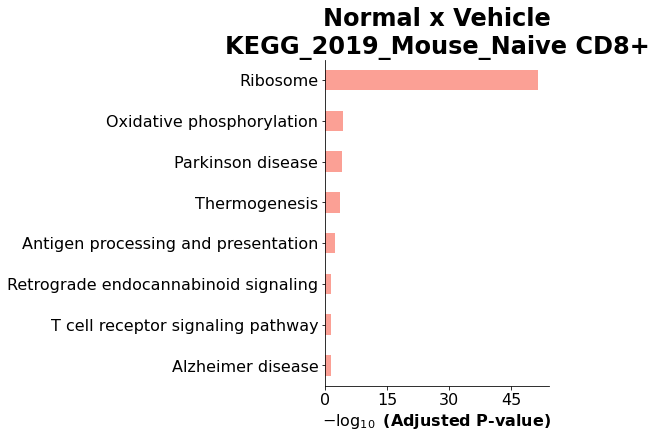

Neutrophils
No sig. genes
Peri. Macs
27
18


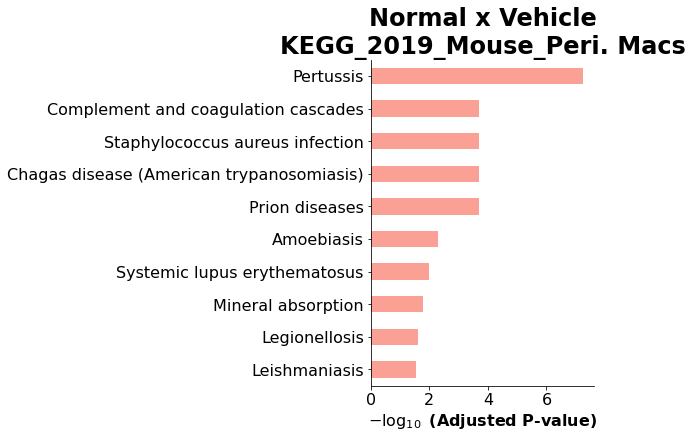

Y-Delta T Cells
8
7


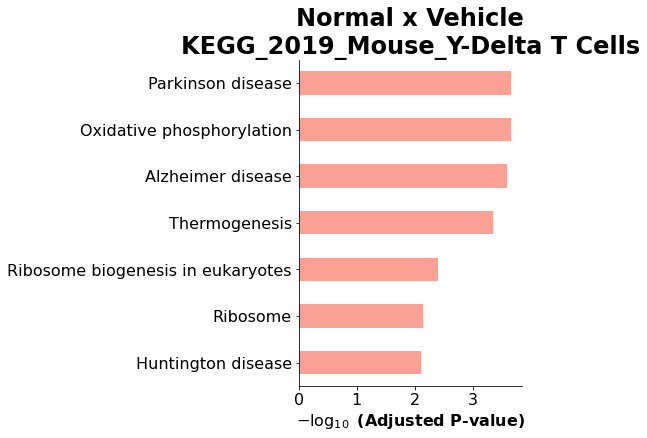

pDCs
11
7


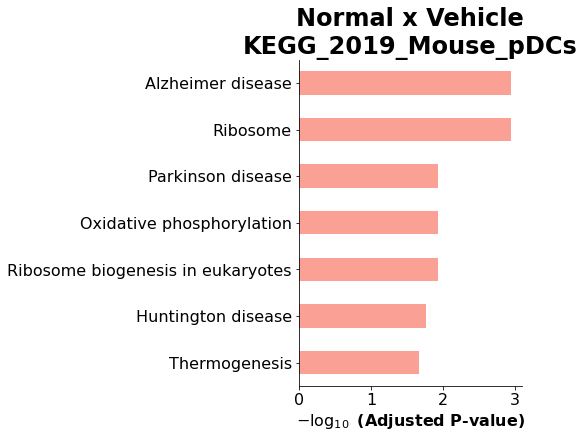


Vehicle x RCF


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cd79a++' 'Cholangiocytes'
 'Endothelial Cells' 'ILC1s' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells'
 'Naive CD4+' 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Stellate Cells'
 'Stmn1++' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s' 'pDCs']
B Cells
44
9


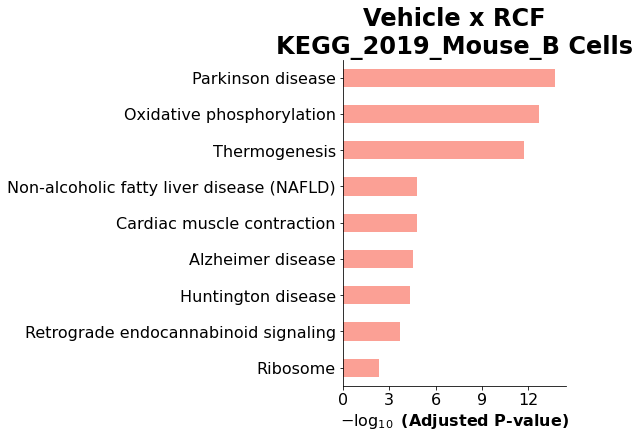

Basophils
No sig. genes
CTLs
48
9


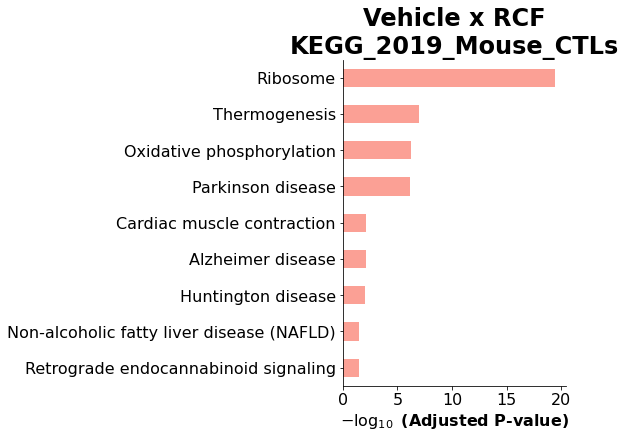

CV & Cap. Macs
75
18


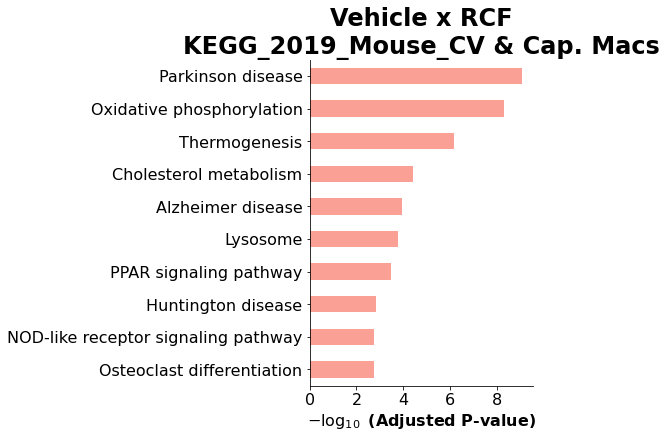

Cholangiocytes
No sig. genes
Endothelial Cells
No sig. genes
ILC1s
22
8


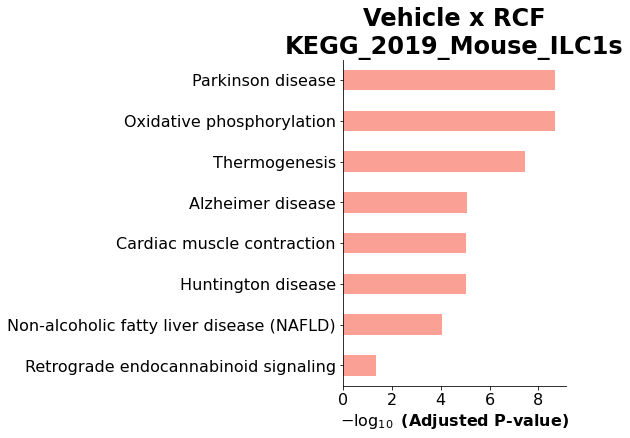

LAMs
379
76


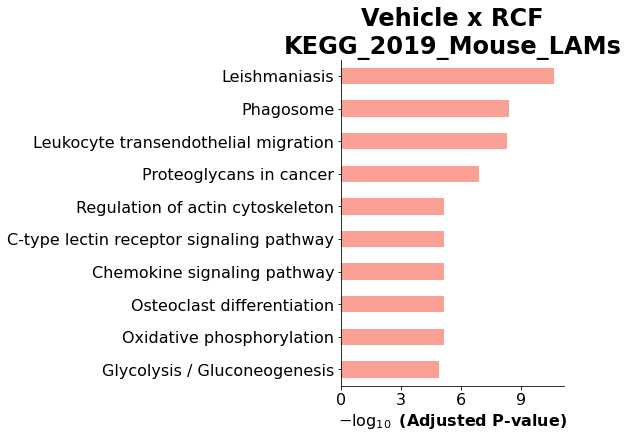

Mig. cDCs
3
7


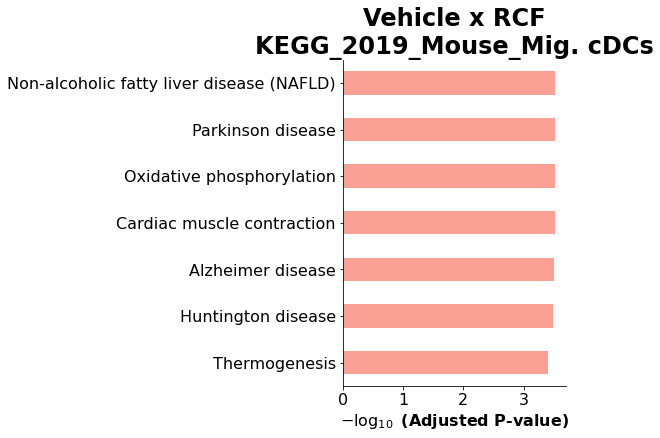

Monocytes
83
10


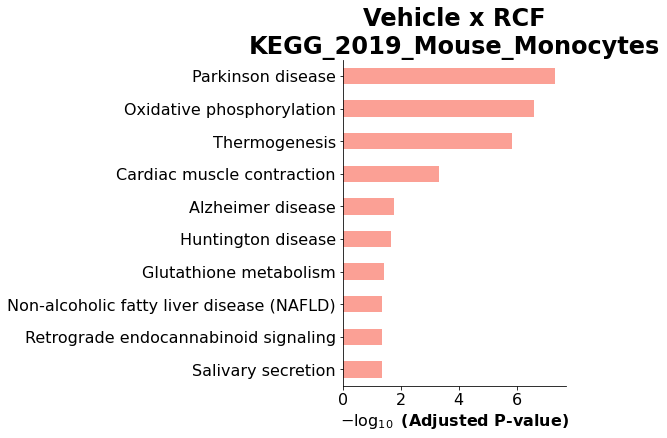

NK Cells
7
8


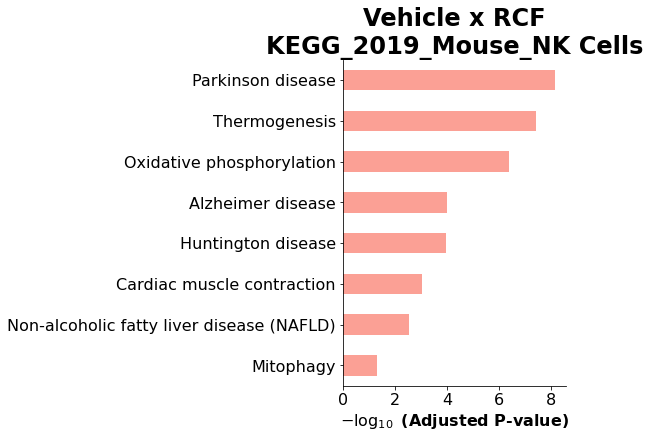

Naive CD4+
8
8


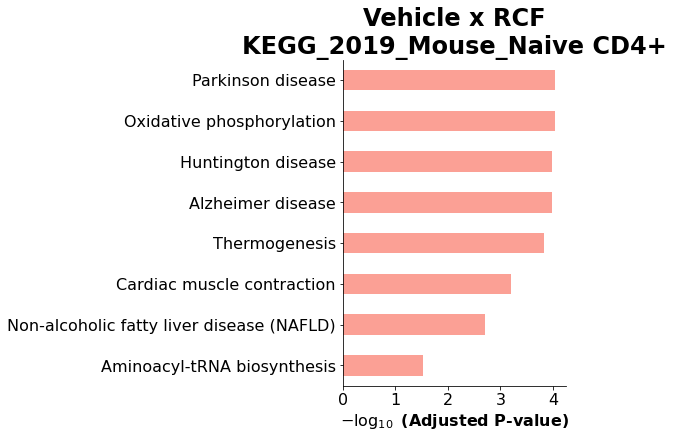

Naive CD8+
71
15


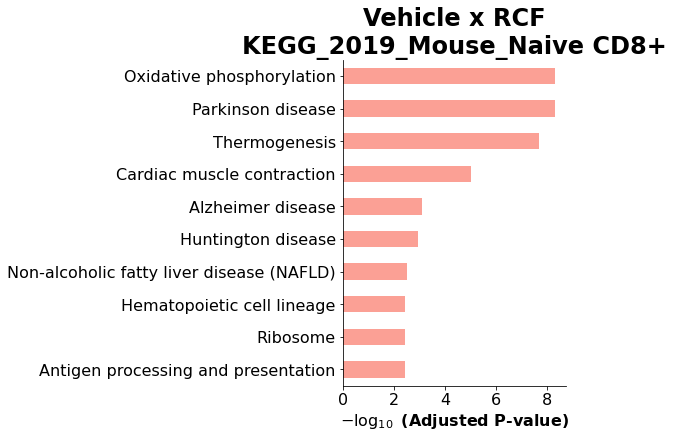

Neutrophils
71
18


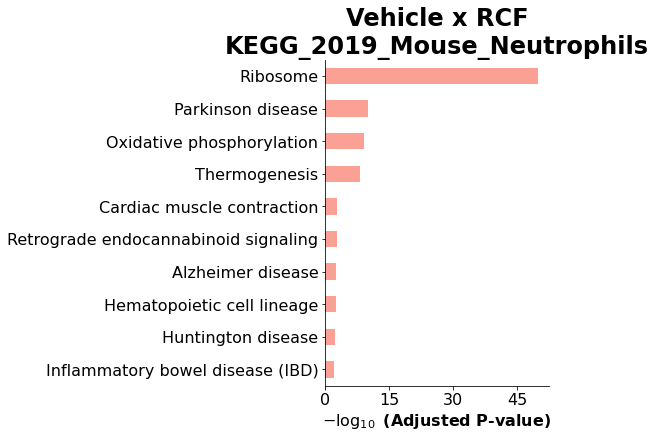

Pat. Mono
9
10


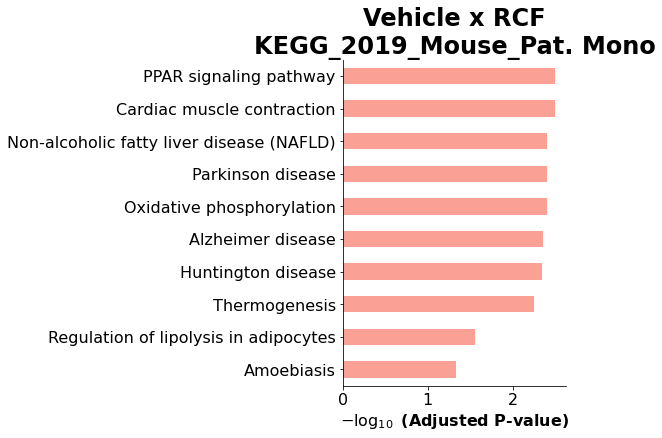

Stellate Cells
No sig. genes
Stmn1++
No sig. genes
TRegs
5
9


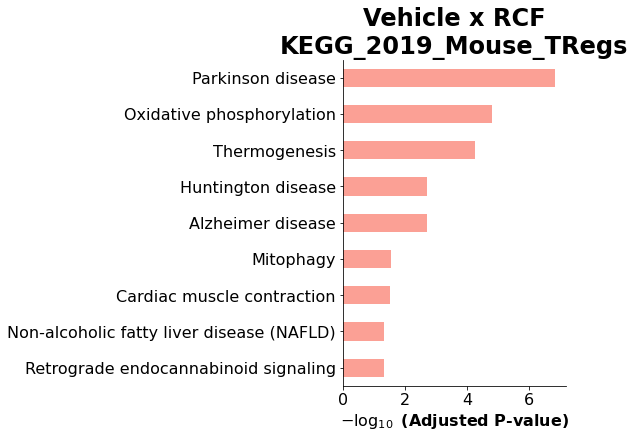

Trans. Mono
467
84


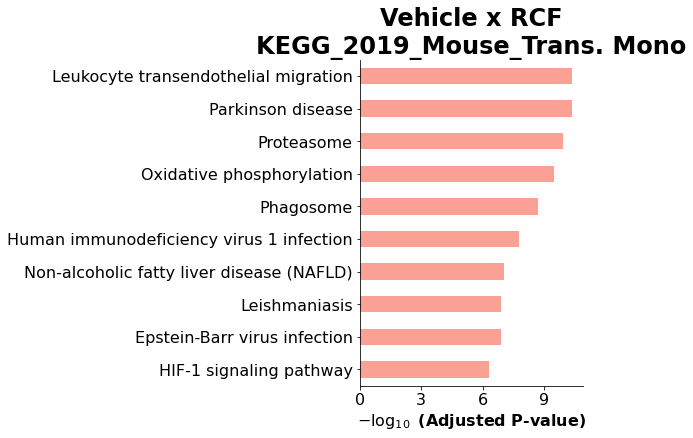

Y-Delta T Cells
1
No Significant Stuffs
cDC1s
4
7


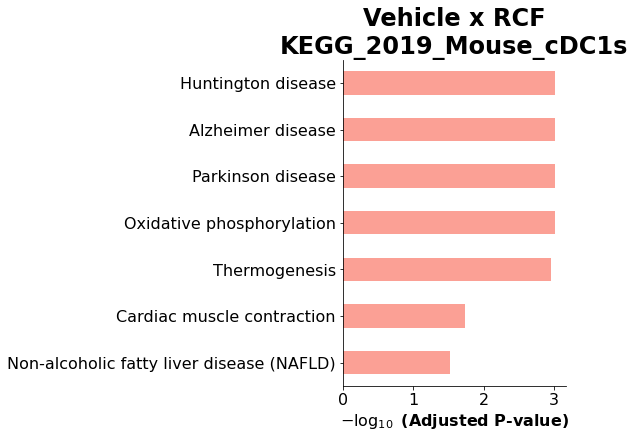

cDC2s
19
10


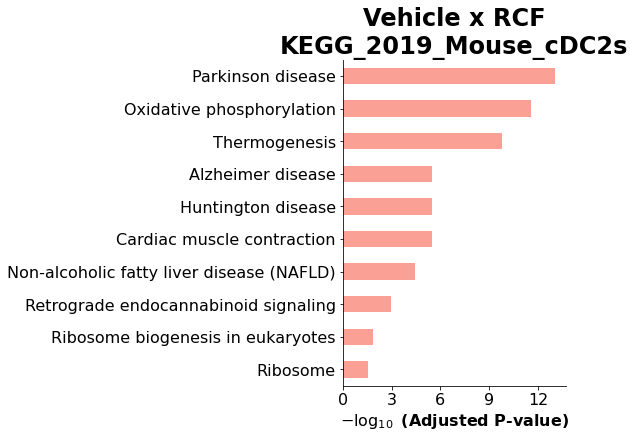

pDCs
10
9


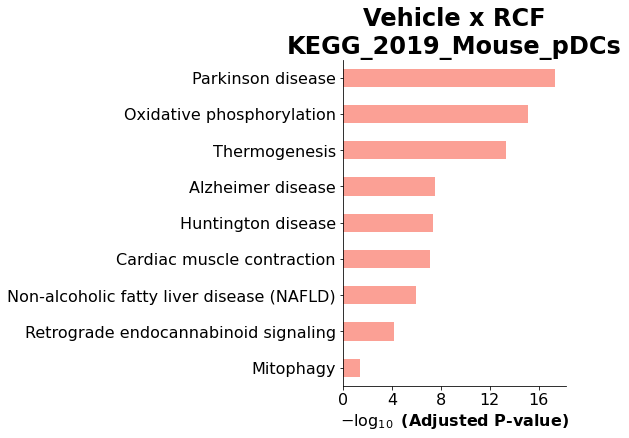


Vehicle x LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cd79a++' 'Cholangiocytes'
 'Endothelial Cells' 'H2-Ab1++' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s' 'pDCs']
B Cells
10
10


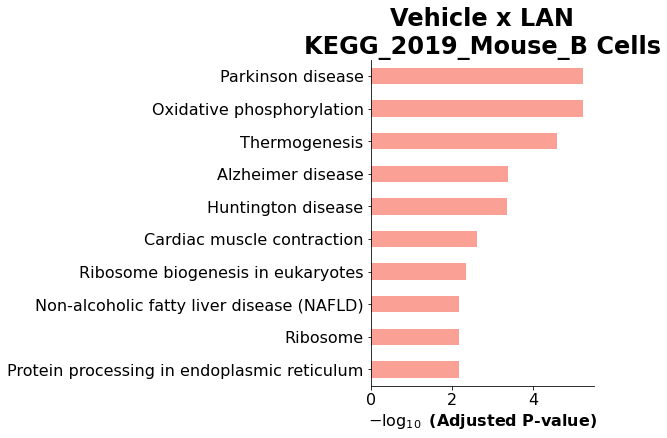

Basophils
No sig. genes
CTLs
7
9


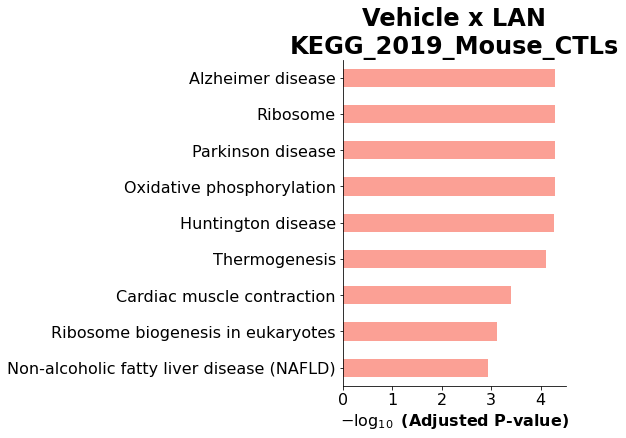

CV & Cap. Macs
115
43


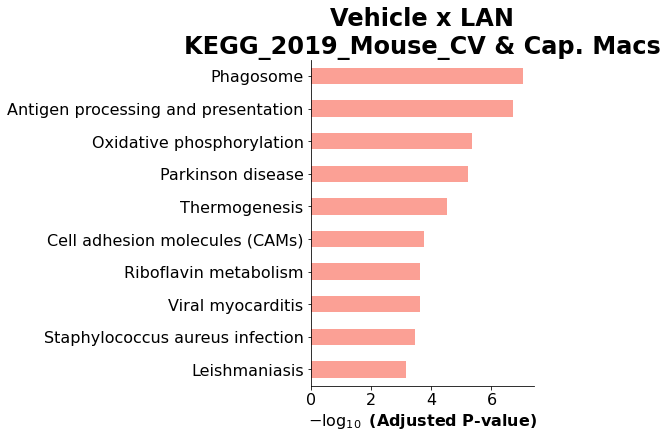

Cholangiocytes
3
7


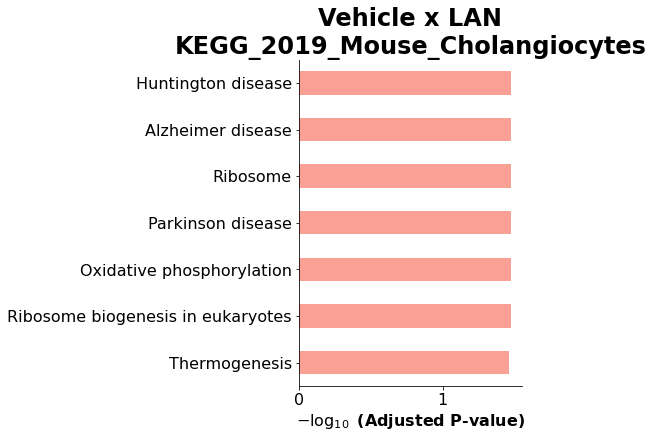

Endothelial Cells
No sig. genes
Hepatocytes
No sig. genes
ILC1s
13
11


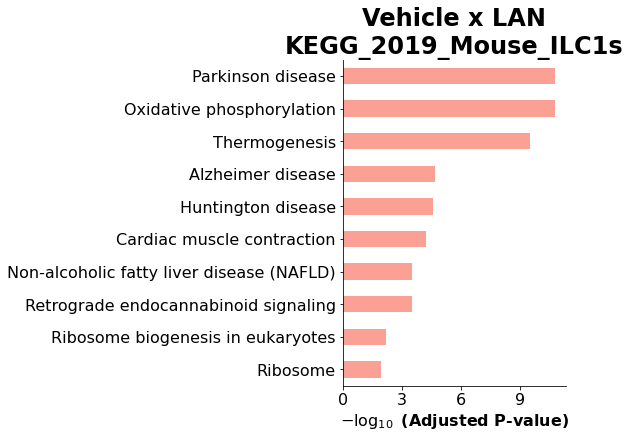

Jchain++
No sig. genes
Kupffer Cells
62
27


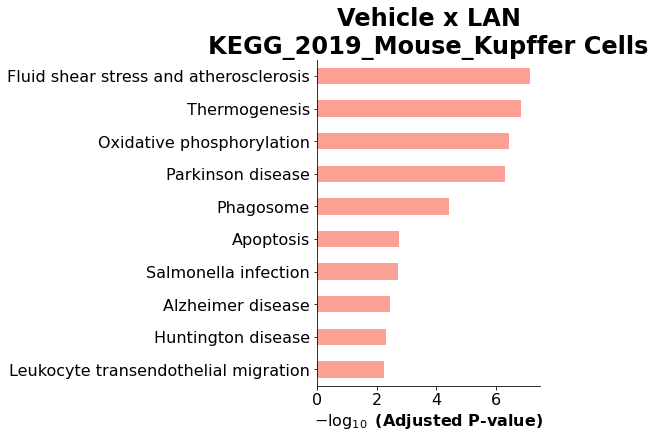

LAMs
64
40


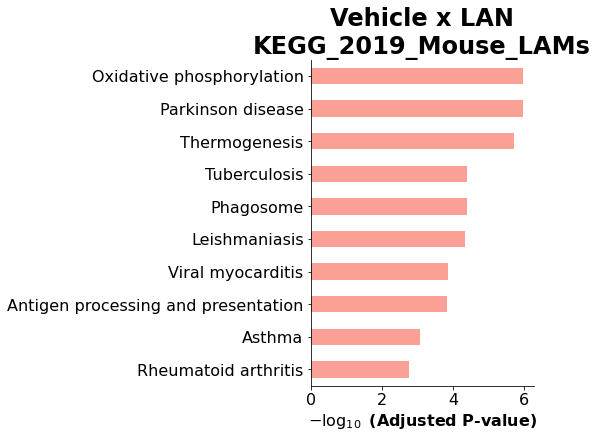

Mig. cDCs
7
9


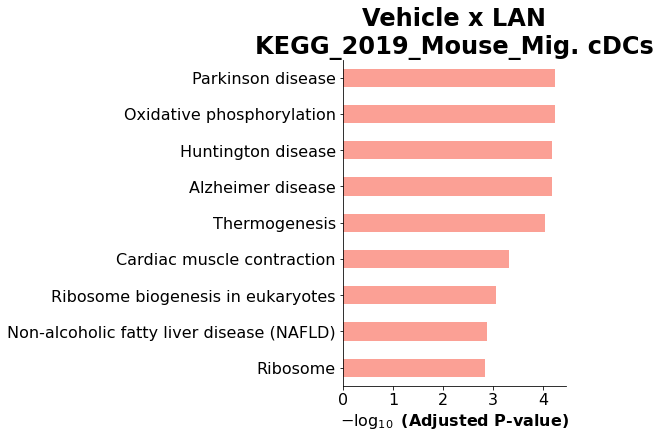

Monocytes
48
3


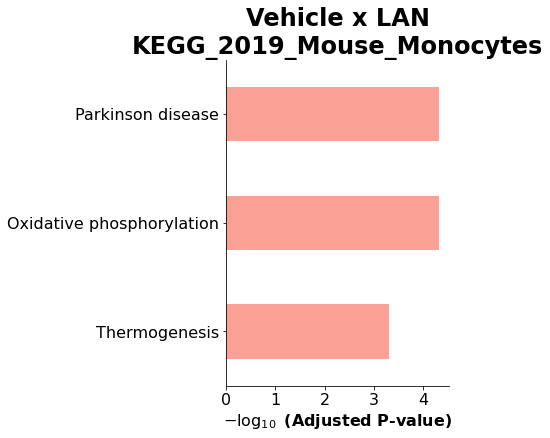

NK Cells
6
9


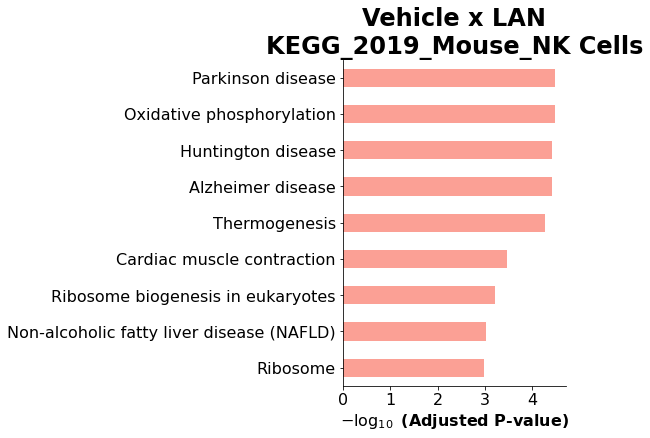

Naive CD4+
10
11


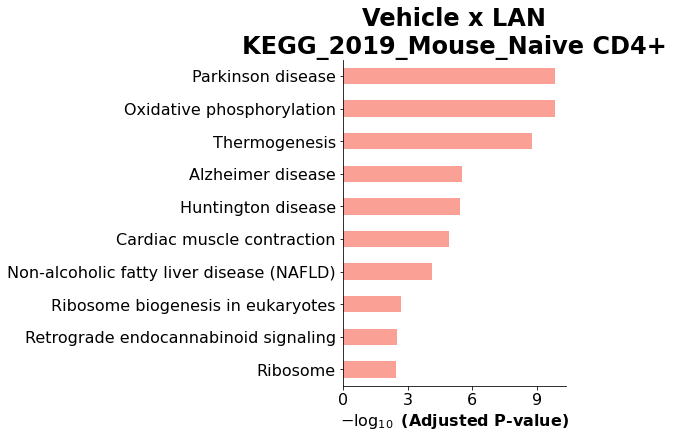

Naive CD8+
15
10


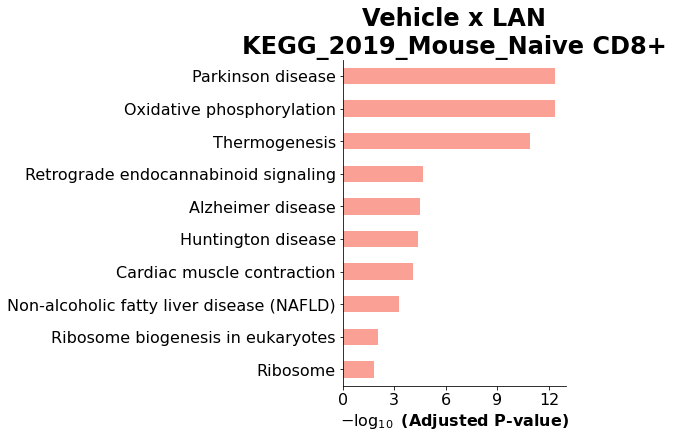

Neutrophils
5
4


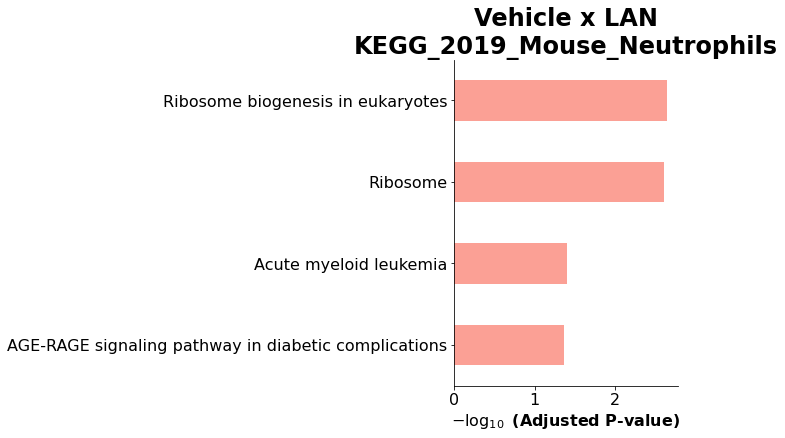

Pat. Mono
1
No Significant Stuffs
Peri. Macs
12
7


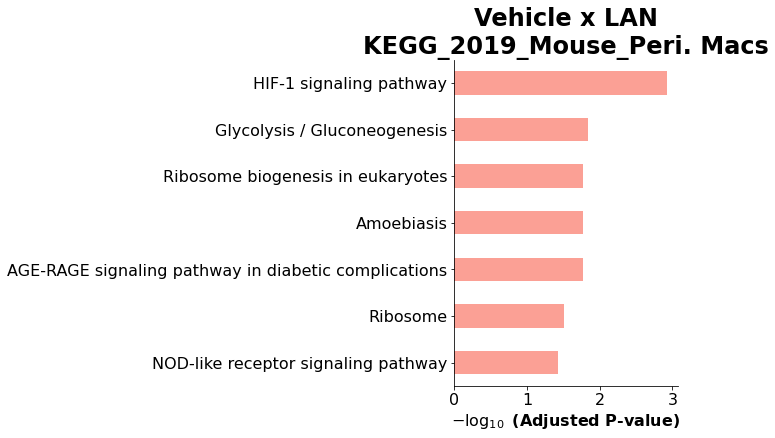

Stellate Cells
1
No Significant Stuffs
Stmn1++
1
No Significant Stuffs
TRegs
7
9


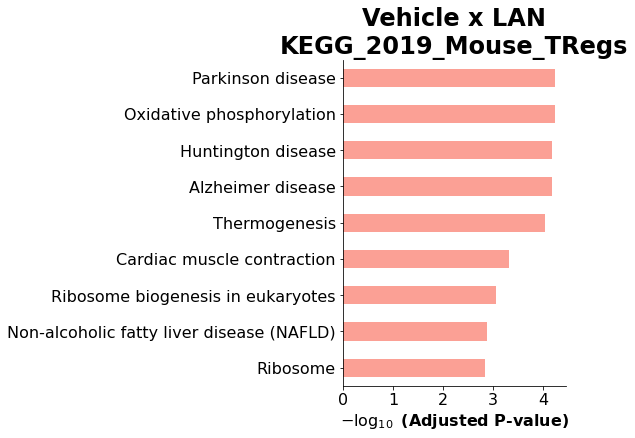

Trans. Mono
91
28


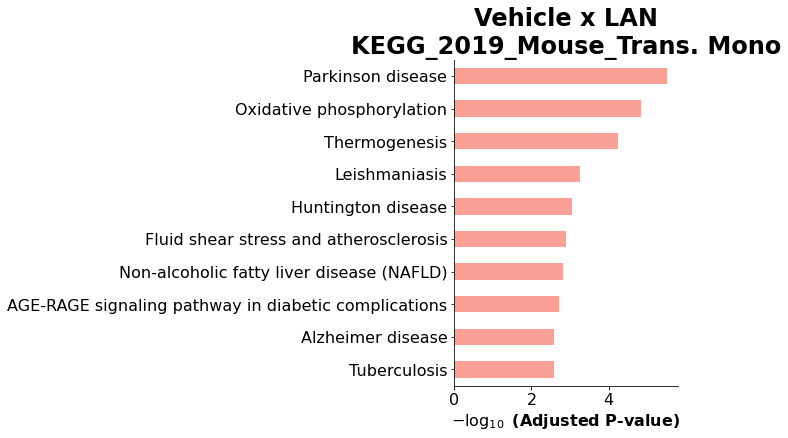

Y-Delta T Cells
6
9


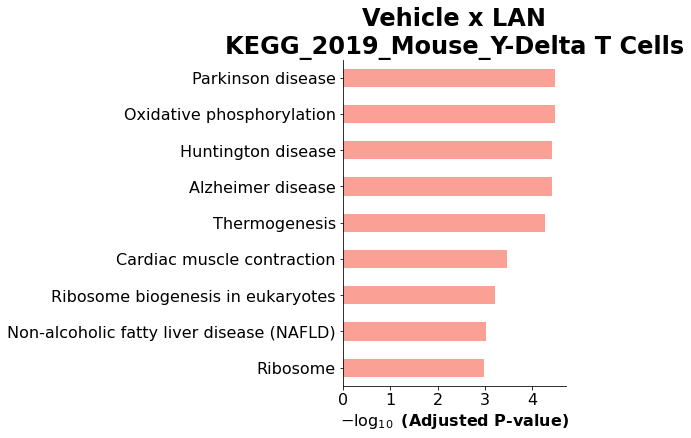

cDC1s
7
9


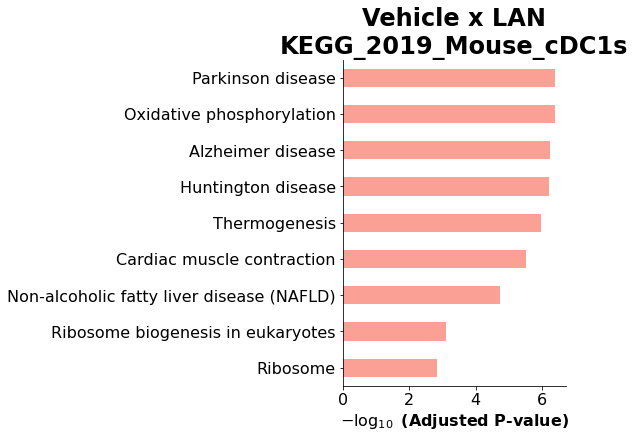

cDC2s
20
23


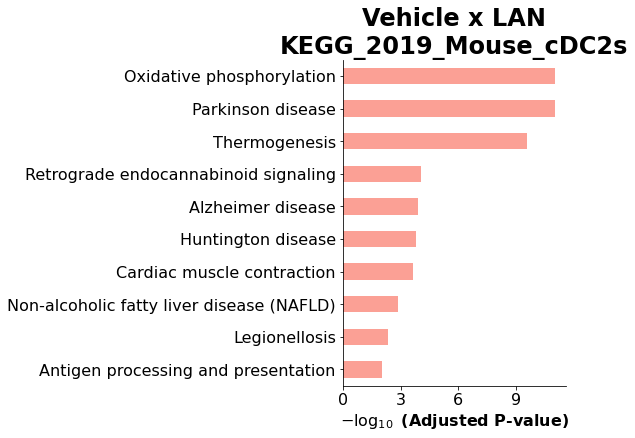

pDCs
8
7


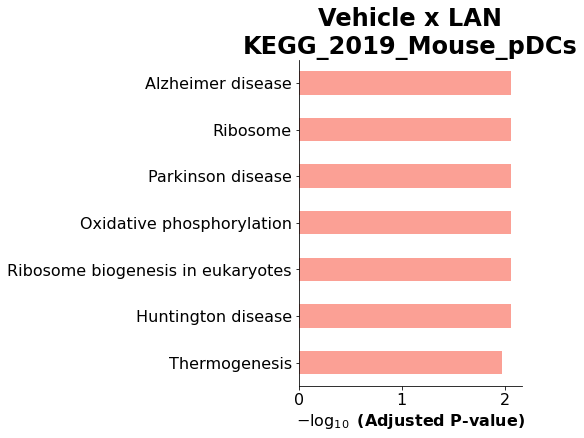


Vehicle x RCF+LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes'
 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Kupffer Cells' 'LAMs'
 'Mig. cDCs' 'Monocytes' 'NK Cells' 'NKT Cells' 'Naive CD4+' 'Naive CD8+'
 'Neutrophils' 'Pat. Mono' 'Stellate Cells' 'Stmn1++' 'TRegs' 'Th1s'
 'Trans. Mono' 'VSMCs' 'Y-Delta T Cells' 'cDC1s' 'cDC2s' 'pDCs']
B Cells
40
4


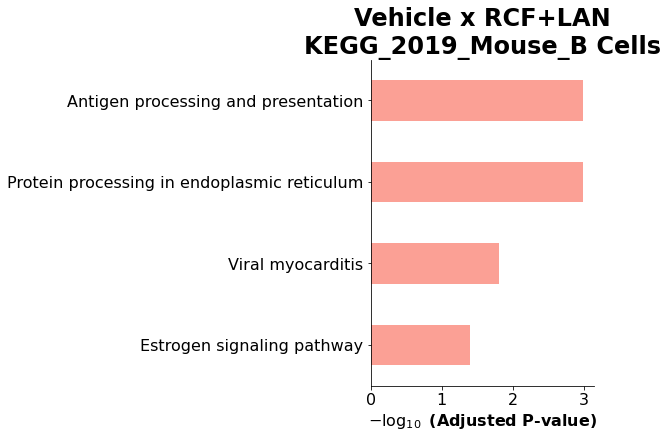

Basophils
No sig. genes
CTLs
27
4


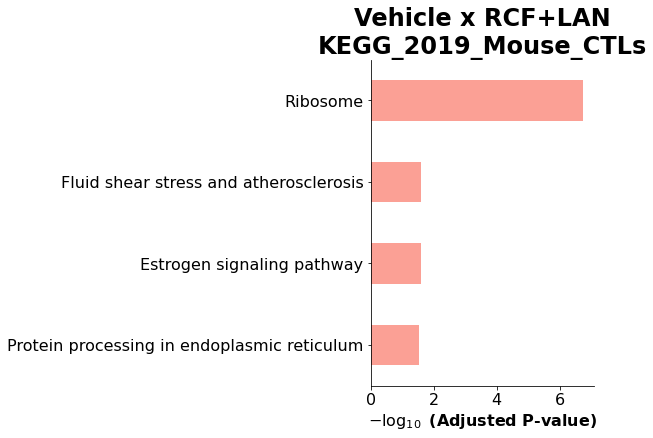

CV & Cap. Macs
106
23


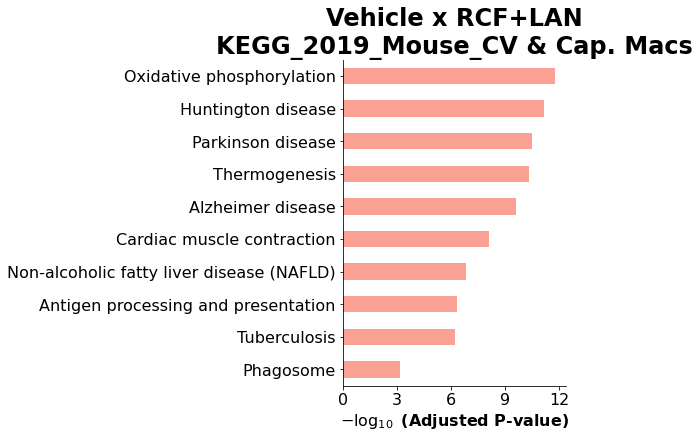

Cholangiocytes
3
4


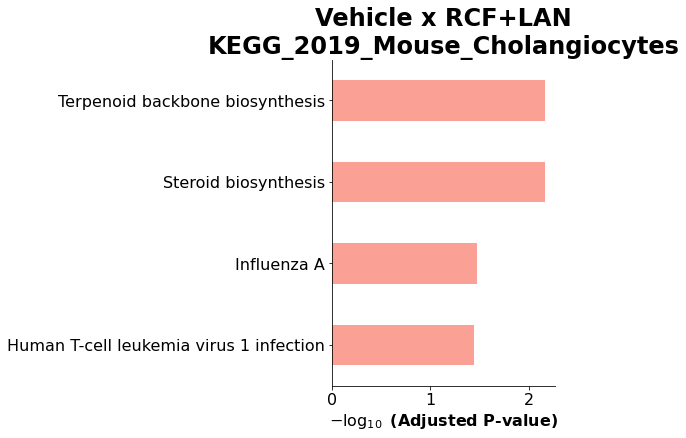

Endothelial Cells
No sig. genes
Hepatocytes
No sig. genes
ILC1s
64
17


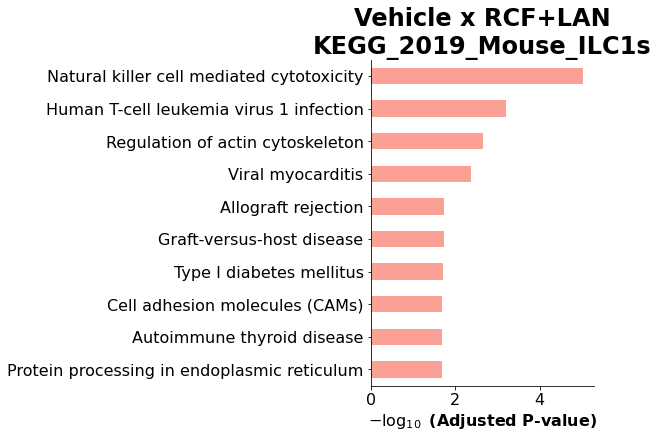

Kupffer Cells
389
131


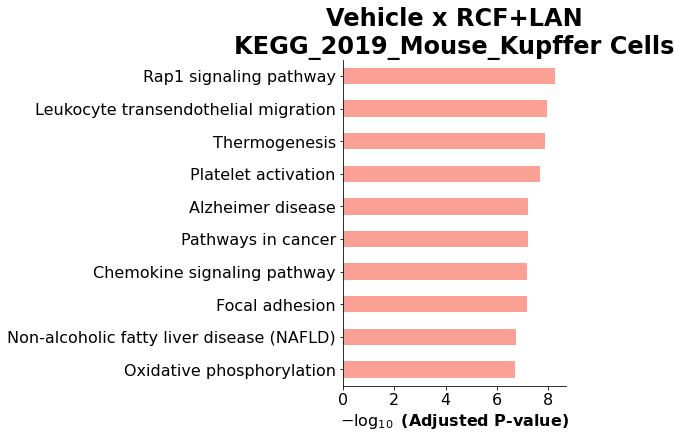

LAMs
54
44


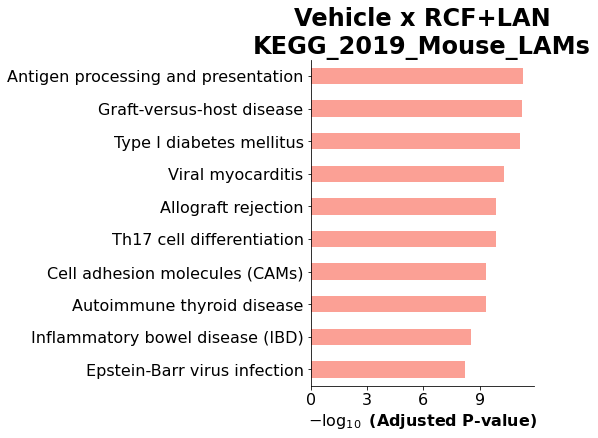

Mig. cDCs
1
No Significant Stuffs
Monocytes
96
1


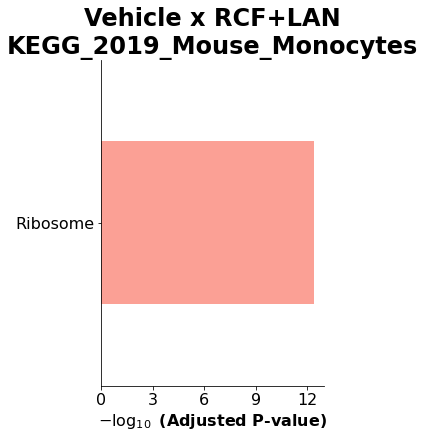

NK Cells
45
27


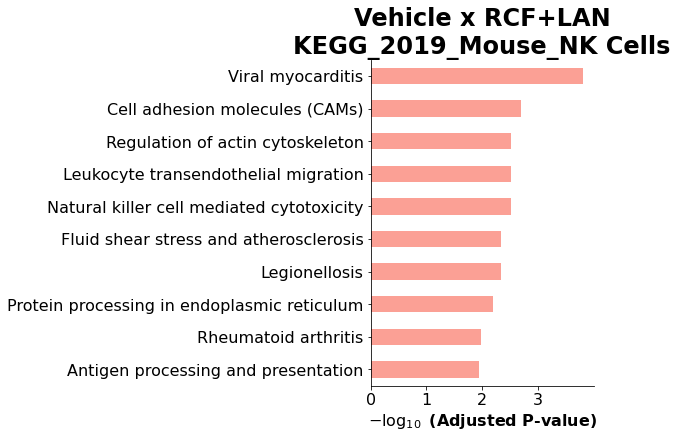

Naive CD4+
13
4


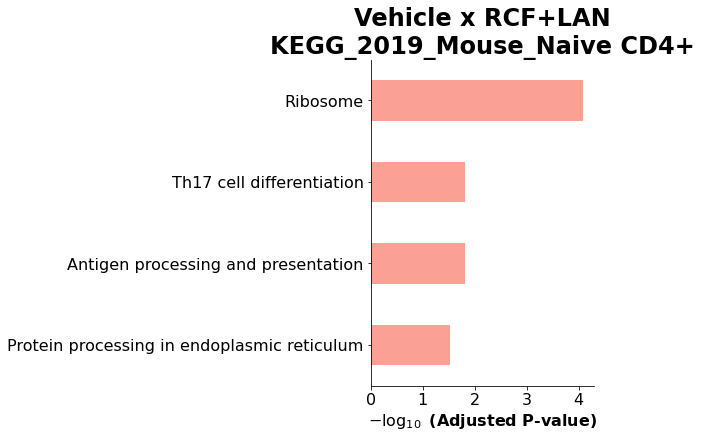

Naive CD8+
51
2


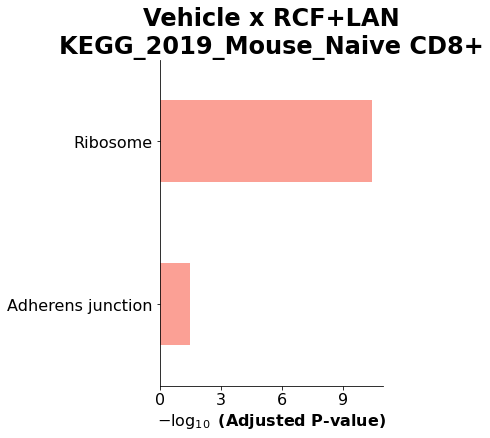

Neutrophils
46
1


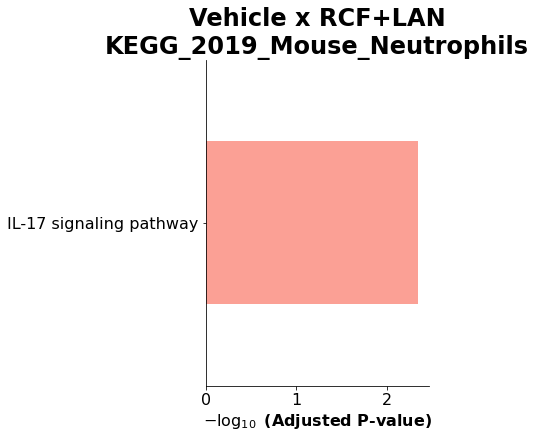

Pat. Mono
21
9


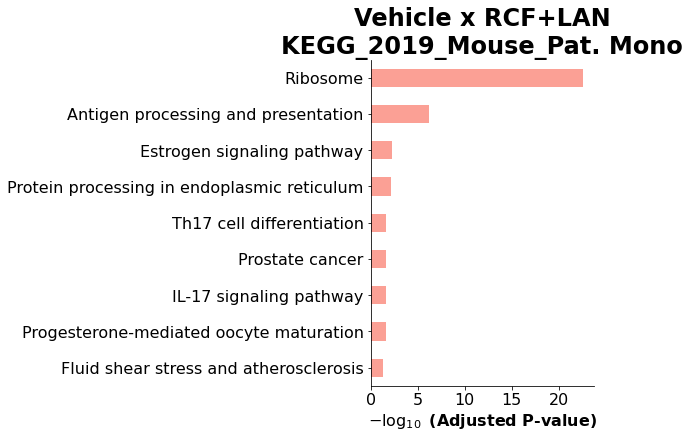

Stellate Cells
No sig. genes
Stmn1++
1
No Significant Stuffs
TRegs
6
1


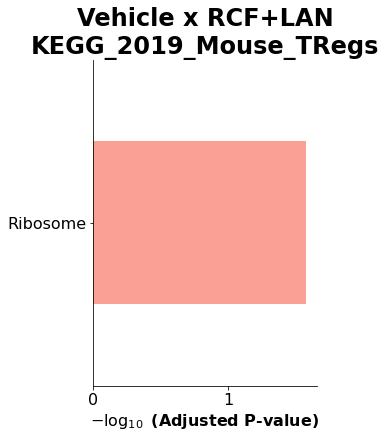

Trans. Mono
298
66


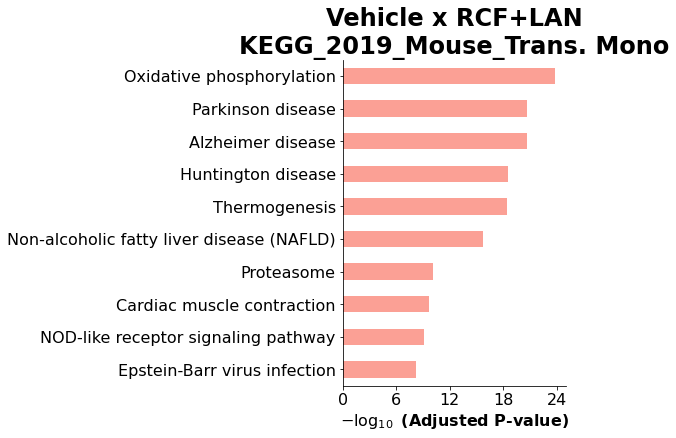

Y-Delta T Cells
4
11


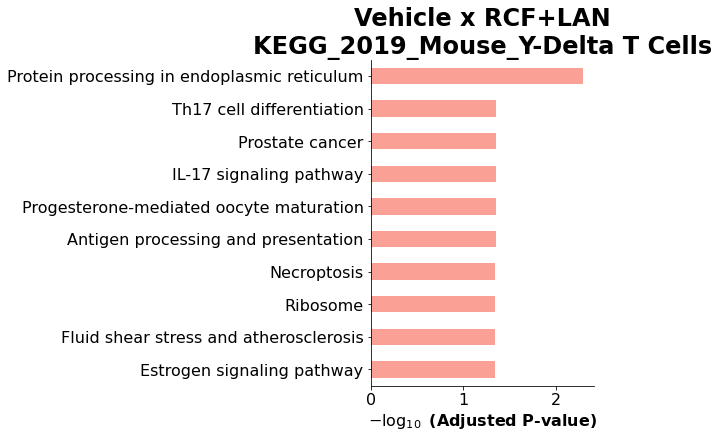

cDC1s
2
1


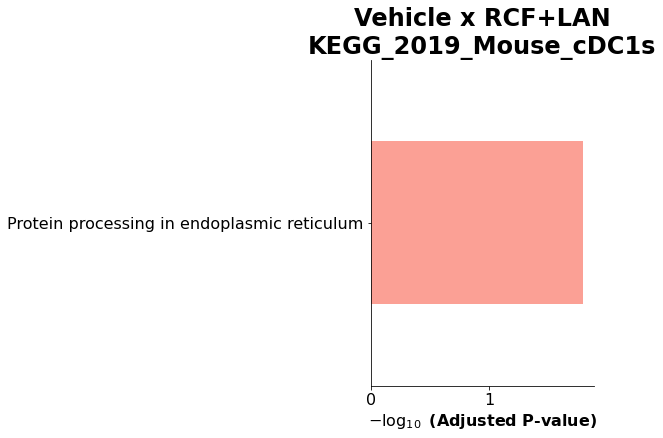

cDC2s
25
22


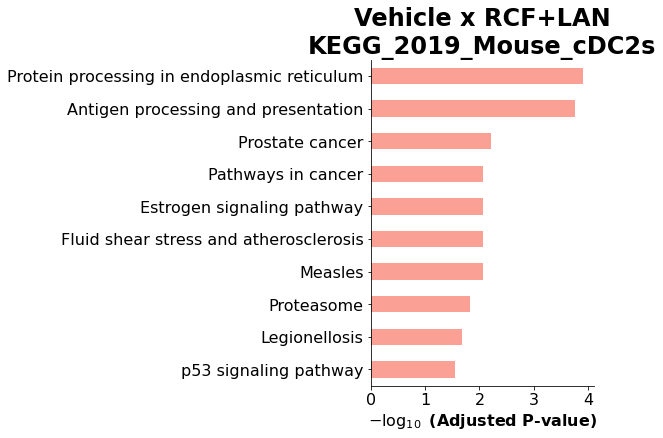

pDCs
19
19


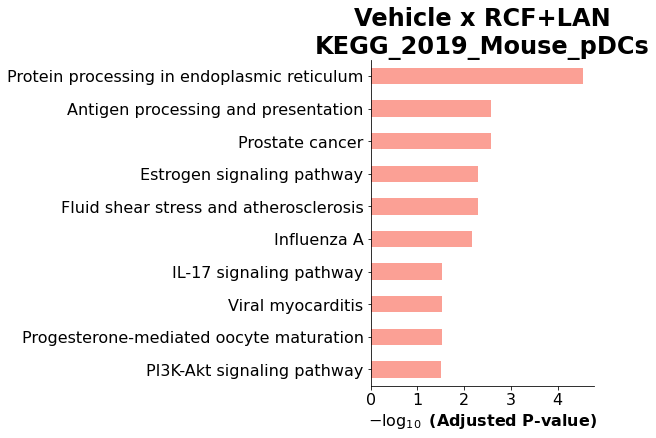


RCF x LAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cd79a++' 'Cholangiocytes'
 'Endothelial Cells' 'H2-Ab1++' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s' 'pDCs']
B Cells
18
17


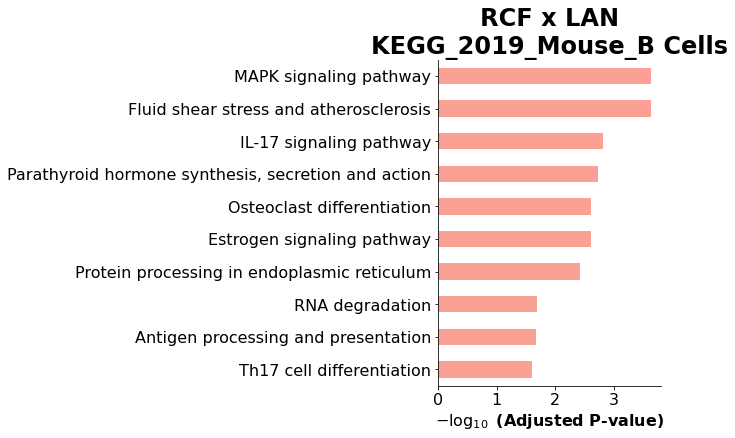

Basophils
No sig. genes
CTLs
20
10


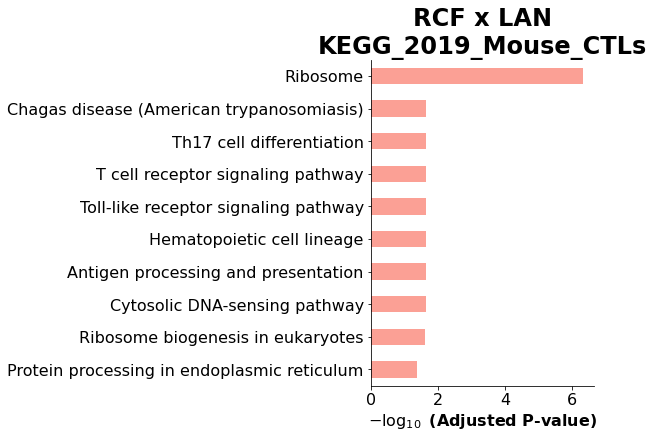

CV & Cap. Macs
41
61


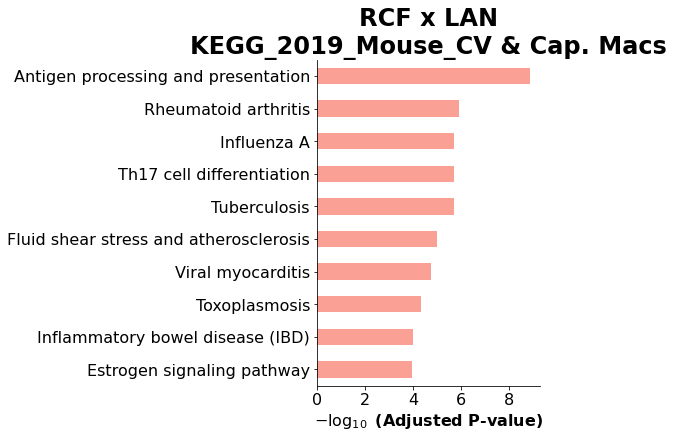

Cd79a++
No sig. genes
Cholangiocytes
No sig. genes
Endothelial Cells
No sig. genes
ILC1s
8
3


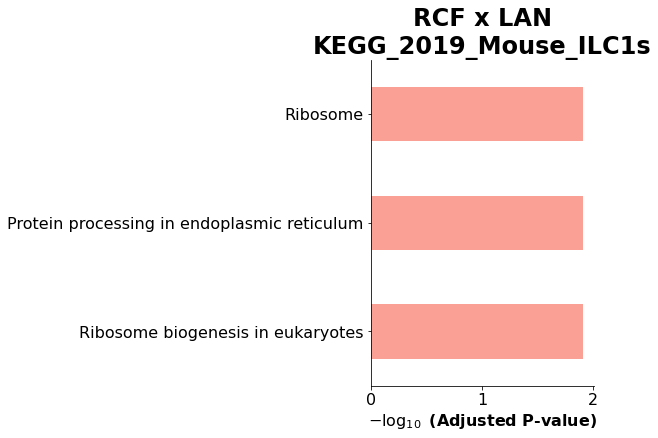

LAMs
55
31


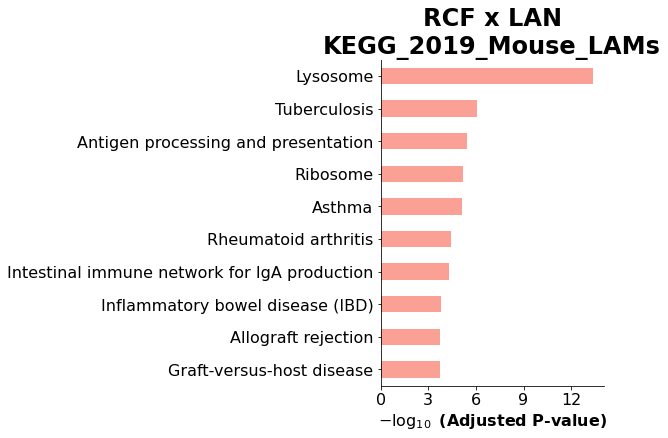

Mig. cDCs
No sig. genes
Monocytes
18
36


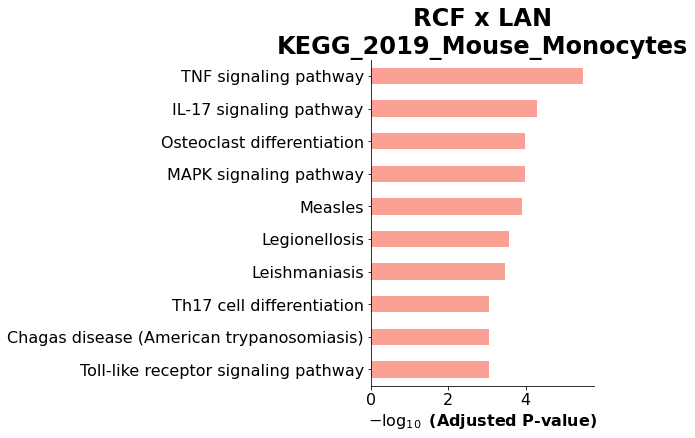

NK Cells
13
15


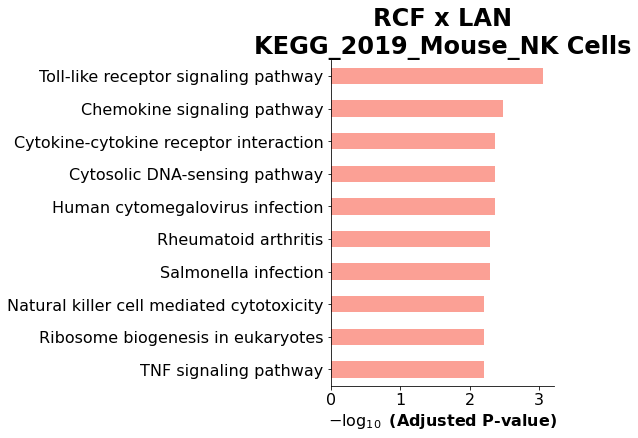

Naive CD4+
8
7


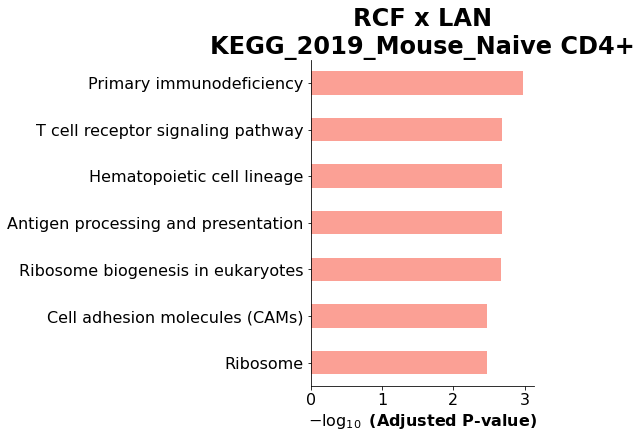

Naive CD8+
54
28


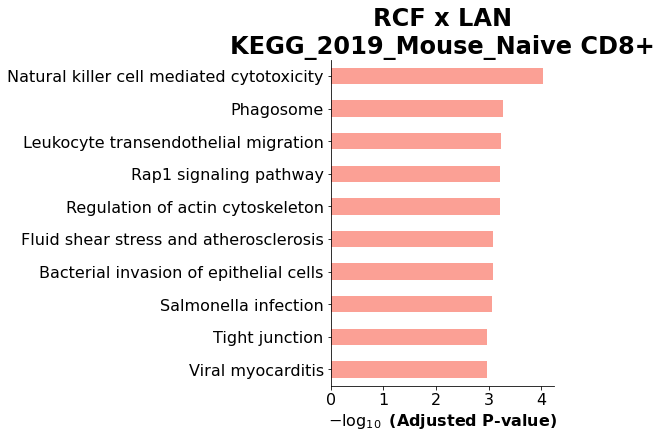

Neutrophils
19
3


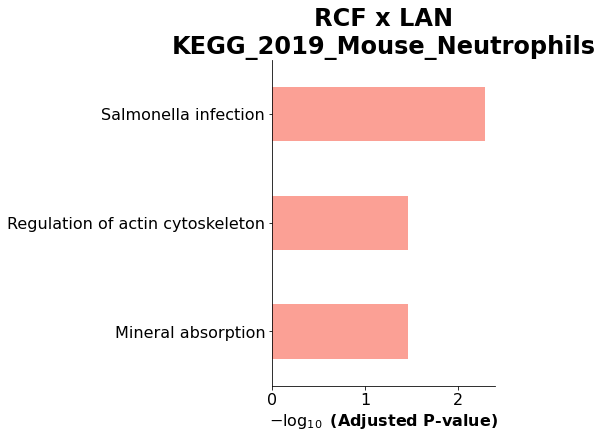

Pat. Mono
4
9


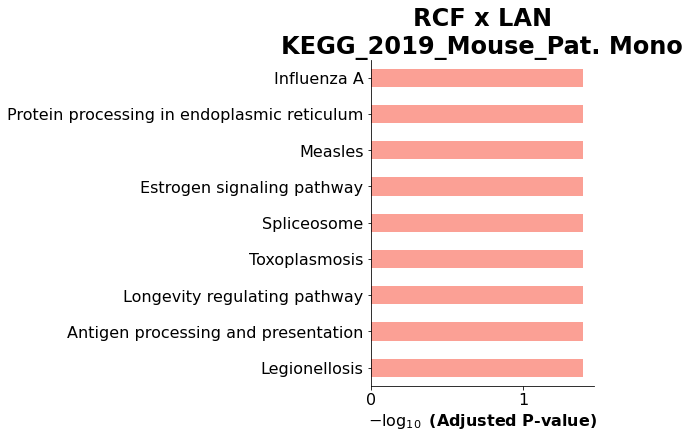

Stellate Cells
No sig. genes
Stmn1++
1
11


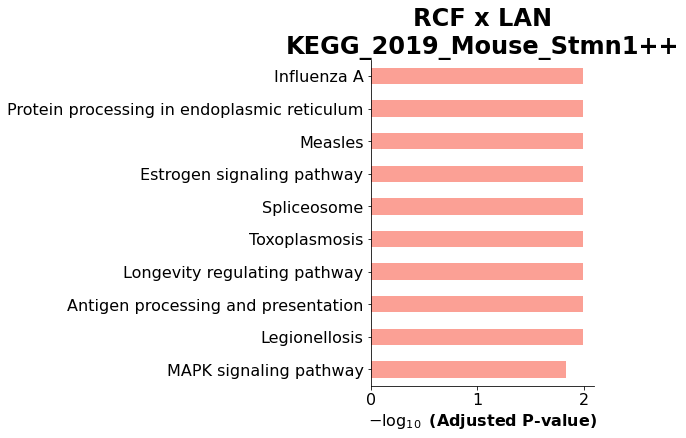

TRegs
4
3


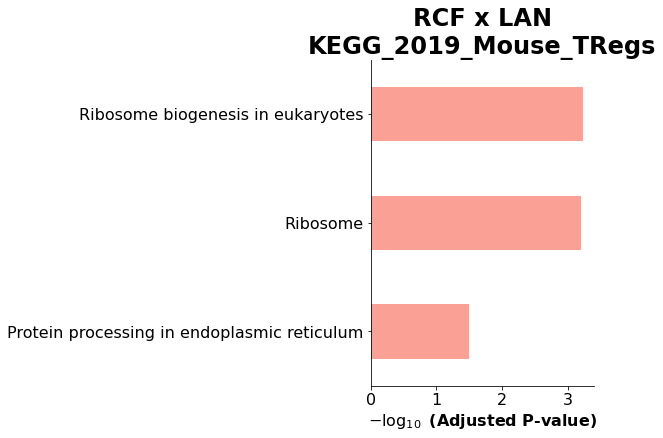

Trans. Mono
92
54


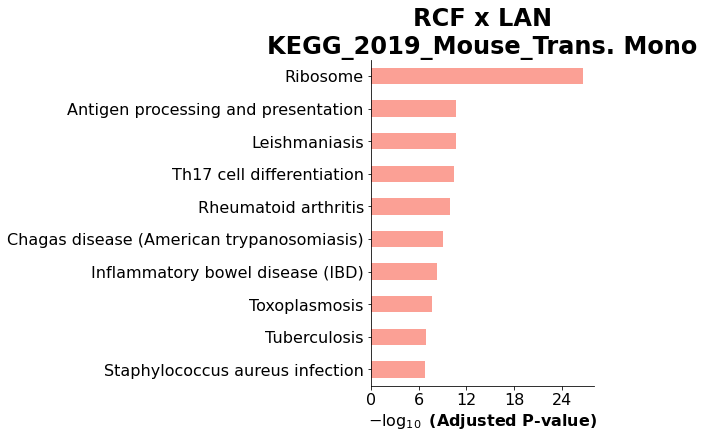

Y-Delta T Cells
5
2


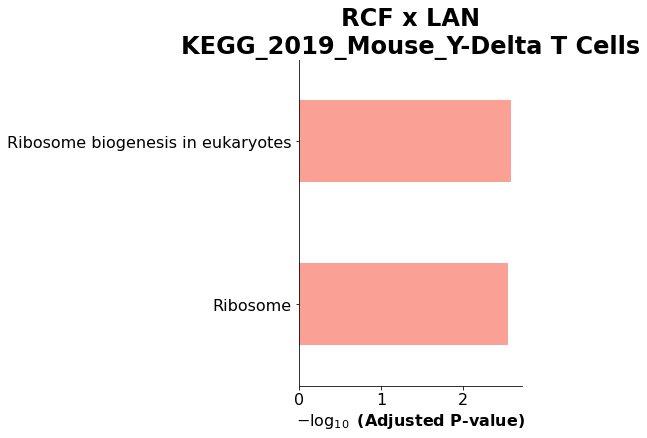

cDC1s
1
No Significant Stuffs
cDC2s
13
26


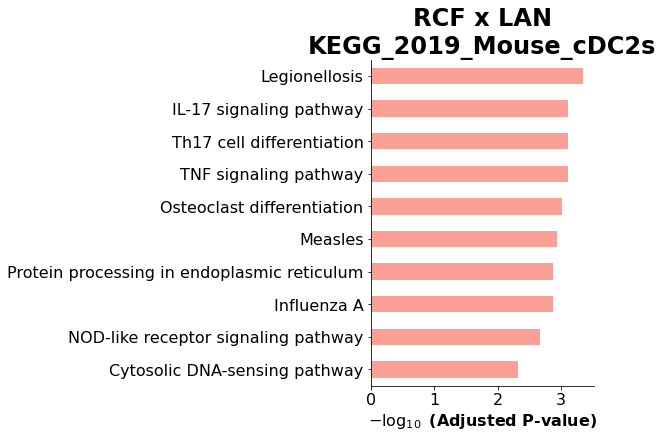

pDCs
9
15


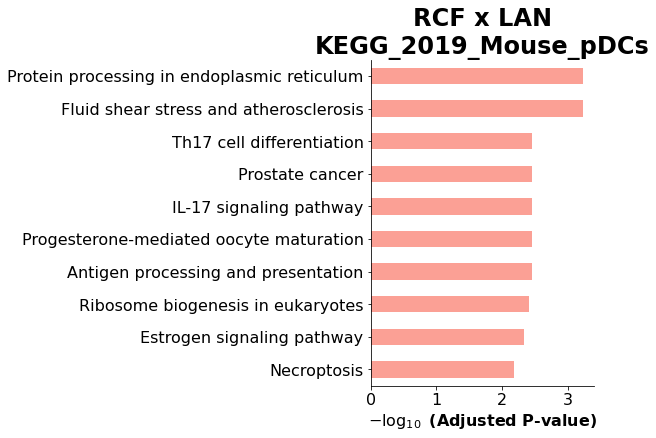

            Comparison         Gene_set Cell Type  \
0     Normal x Vehicle  KEGG_2019_Mouse   B Cells   
1     Normal x Vehicle  KEGG_2019_Mouse   B Cells   
2     Normal x Vehicle  KEGG_2019_Mouse   B Cells   
3     Normal x Vehicle  KEGG_2019_Mouse   B Cells   
4     Normal x Vehicle  KEGG_2019_Mouse   B Cells   
...                ...              ...       ...   
1966         RCF x LAN  KEGG_2019_Mouse      pDCs   
1967         RCF x LAN  KEGG_2019_Mouse      pDCs   
1968         RCF x LAN  KEGG_2019_Mouse      pDCs   
1969         RCF x LAN  KEGG_2019_Mouse      pDCs   
1970         RCF x LAN  KEGG_2019_Mouse      pDCs   

                                             Term Overlap  Adjusted P-value  \
0                       Oxidative phosphorylation  13/134          0.000006   
1                                        Ribosome  14/170          0.000006   
2                                   Thermogenesis  16/231          0.000006   
3     Protein processing in endoplasmic reticul

In [11]:
#gene_set_names = gseapy.get_library_name(organism='Mouse')
#print(gene_set_names)

#treatments1 = ['NonfatVehicle','FriedVehicle', 'FriedVehicle', 'FriedVehicle', 'FriedCRV431']
#treatments2 = ['FriedVehicle', 'FriedCRV431','FriedLANI','FriedCRVLAN', 'FriedLANI']
treatments1 = ['Normal', 'Vehicle', 'Vehicle', 'Vehicle', 'RCF']
treatments2 = ['Vehicle', 'RCF', 'LAN', 'RCF+LAN', 'LAN']
depth='fine'
analysis = ['KEGG_2019_Mouse']
save=False
bigExcel=True
#analysis = 'GO_Biological_Process_2021' #['KEGG_2019_Mouse', 'GO_Biological_Process_2021', 'WikiPathways_2019_Mouse']
savePics=False

t0 = time.time()
dfs=[]
for treat1,treat2 in zip(treatments1, treatments2):
    comparison = f"{treat1} x {treat2}"
    print('\n'+comparison)
    cadata = process.catAdata(Data, [treat1, treat2], normReads=False, combat=False)
    cadata = process.dgeNorm(cadata)
    print(np.unique(cadata[cadata.obs['batch']==treat2].obs[f'{depth}Clusters']))
    
    df = process.enrichAllCellTypes(cadata, treat1, treat2, analysis, comparison, obsKey=f'{depth}Clusters', savePics=savePics)
    '''
    cellTypes = sorted(( set(np.unique(cadata[cadata.obs['batch']==treat2].obs[f'{depth}Clusters'])) & set(np.unique(cadata[cadata.obs['batch']==treat1].obs[f'{depth}Clusters']) )))
    for cellType in cellTypes:
        #for cellType in np.unique(cadata[cadata.obs['batch']==treat2].obs[f'{depth}Clusters']):
        #print(np.unique(cadata[cadata.obs['batch']==treat1].obs[f'{depth}Clusters']))
        #if cellType in np.unique(cadata[cadata.obs['batch']==treat1].obs[f'{depth}Clusters']):
        print(cellType)
        adata = cadata[cadata.obs[f'{depth}Clusters']==cellType]
        sc.tl.rank_genes_groups(adata, 'batch', groups=[treat2], reference=treat1, use_raw=False, method='wilcoxon', max_iter=2000, pts=False, key_added = "wilcoxon")
        glist = sc.get.rank_genes_groups_df(adata, group=treat2, 
                                            key='wilcoxon', log2fc_min=0.25, 
                                            pval_cutoff=0.01)['names'].squeeze()
        if type(glist)!=str:
            glist = glist.str.strip().tolist()
        else:
              glist=[glist]

        if len(glist)>0:
            print(len(glist))
            result = process.enrich(glist, analyses=analysis, treatment=comparison, title_suffix='_'+cellType, return_df=True)[0]
            if savePics:
                plt.savefig(f"images/{comparison}_{cellType}_{analysis}.png", bbox_inches='tight')
            plt.show()
            result = result[result['Adjusted P-value']<0.1]
            result['Cell Type'] = [cellType]*result.shape[0]
            result = result[['Gene_set','Cell Type', 'Term','Overlap','Adjusted P-value','Genes']]

            df.append(result)
        else:
            print("No sig. genes")
    '''
    df= pd.concat(df, ignore_index=True)
    df['Comparison'] = [comparison]*df.shape[0]
    dfs.append(df)
    if save: df.to_csv(f"{analysis}/{comparison}.csv")
        
if bigExcel:
    bigDF = pd.concat(dfs, ignore_index=True)
    bigDF = bigDF[['Comparison', 'Gene_set','Cell Type', 'Term','Overlap','Adjusted P-value','Genes']]
    print(bigDF)
    out.makeSpreadsheet(bigDF, filename='combinedKEGG.xlsx', sheetKey='Comparison', sortKey=['Cell Type', 'Adjusted P-value'])
    

print("Finished")
print(f"{time.time()-t0}s")

In [32]:
bigDF = bigDF[['Comparison', 'Gene_set','Cell Type', 'Term','Overlap','Adjusted P-value','Genes']]
print(bigDF)
out.makeSpreadsheet(bigDF, filename='combinedKEGG.xlsx', sheetKey='Comparison', sortKey=['Cell Type', 'Adjusted P-value'])


                        Comparison         Gene_set Cell Type  \
0     NonfatVehicle x FriedVehicle  KEGG_2019_Mouse   B Cells   
1     NonfatVehicle x FriedVehicle  KEGG_2019_Mouse   B Cells   
2     NonfatVehicle x FriedVehicle  KEGG_2019_Mouse   B Cells   
3     NonfatVehicle x FriedVehicle  KEGG_2019_Mouse   B Cells   
4     NonfatVehicle x FriedVehicle  KEGG_2019_Mouse   B Cells   
...                            ...              ...       ...   
1998       FriedCRV431 x FriedLANI  KEGG_2019_Mouse      pDCs   
1999       FriedCRV431 x FriedLANI  KEGG_2019_Mouse      pDCs   
2000       FriedCRV431 x FriedLANI  KEGG_2019_Mouse      pDCs   
2001       FriedCRV431 x FriedLANI  KEGG_2019_Mouse      pDCs   
2002       FriedCRV431 x FriedLANI  KEGG_2019_Mouse      pDCs   

                                             Term Overlap  Adjusted P-value  \
0                       Oxidative phosphorylation  13/134          0.000006   
1                                        Ribosome  14/170    

In [20]:
print(df.sort_values('Adjusted P-value'))
filtDF = df[df['Cell Type'] == 'LAMs']
print(filtDF.sort_values('Adjusted P-value').head(20))

            Gene_set    Cell Type                                  Term  \
216  KEGG_2019_Mouse  Neutrophils                              Ribosome   
15   KEGG_2019_Mouse         CTLs                              Ribosome   
378  KEGG_2019_Mouse         pDCs                     Parkinson disease   
379  KEGG_2019_Mouse         pDCs             Oxidative phosphorylation   
284  KEGG_2019_Mouse  Trans. Mono                     Parkinson disease   
..               ...          ...                                   ...   
359  KEGG_2019_Mouse  Trans. Mono  Toll-like receptor signaling pathway   
155  KEGG_2019_Mouse         LAMs     B cell receptor signaling pathway   
189  KEGG_2019_Mouse     NK Cells                           Endocytosis   
243  KEGG_2019_Mouse  Neutrophils   Antigen processing and presentation   
360  KEGG_2019_Mouse  Trans. Mono              Type I diabetes mellitus   

    Overlap  Adjusted P-value  \
216  34/170      1.293355e-50   
15   16/170      3.602431e-20   


           Gene_set                                         Term Overlap  \
0   KEGG_2019_Mouse  Protein processing in endoplasmic reticulum   5/163   
1   KEGG_2019_Mouse          Antigen processing and presentation    4/90   
2   KEGG_2019_Mouse                            Viral myocarditis    3/87   
3   KEGG_2019_Mouse                   Estrogen signaling pathway   3/134   
4   KEGG_2019_Mouse               Cell adhesion molecules (CAMs)   3/170   
..              ...                                          ...     ...   
62  KEGG_2019_Mouse             Regulation of actin cytoskeleton   1/217   
63  KEGG_2019_Mouse     Human immunodeficiency virus 1 infection   1/238   
64  KEGG_2019_Mouse      Human T-cell leukemia virus 1 infection   1/245   
65  KEGG_2019_Mouse                       MAPK signaling pathway   1/294   
66  KEGG_2019_Mouse               Human papillomavirus infection   1/360   

     P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0   0.

<AxesSubplot: title={'center': 'WikiPathways_2019_Mouse'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

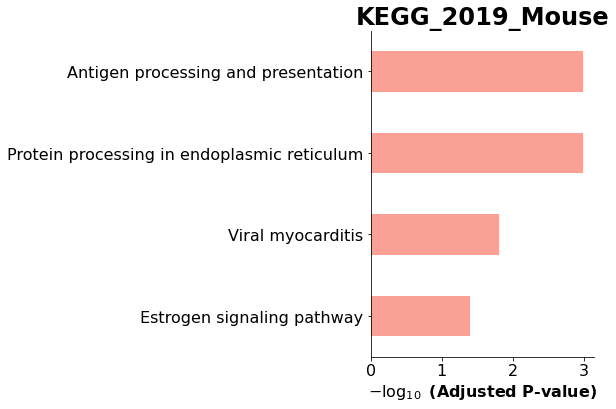

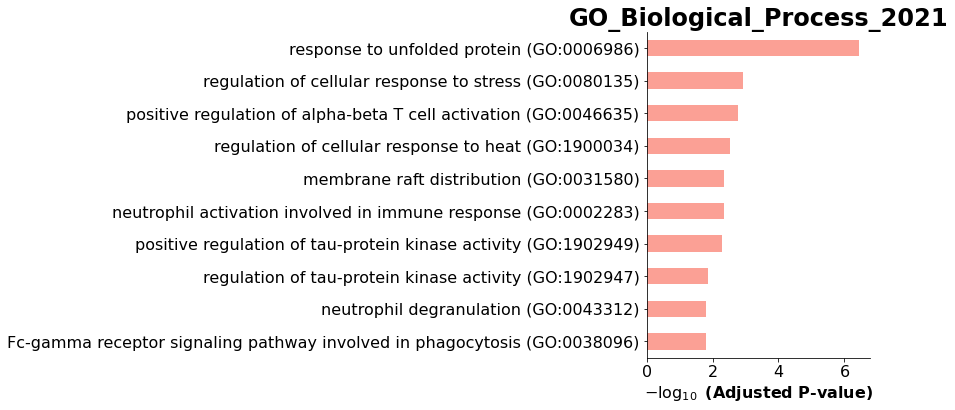

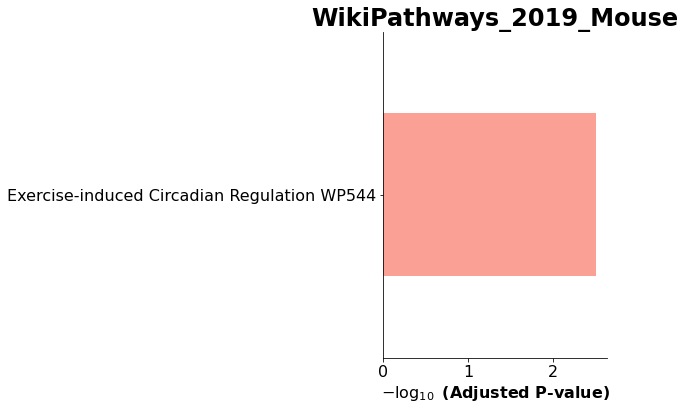

In [68]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='KEGG_2019_Mouse',
                     cutoff = 0.5)
print(enr_res.res2d)
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse')
enr_res.results = enr_res.results[['Gene_set','Term','Overlap','Adjusted P-value','Genes']]
enr_res.results=enr_res.results[enr_res.results['Adjusted P-value']<0.1]
print(enr_res.results)

enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='GO_Biological_Process_2021',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2021')

enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='WikiPathways_2019_Mouse',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='WikiPathways_2019_Mouse')

In [40]:
print(enr_res.results[['Gene_set','Term','Overlap','Adjusted P-value','Genes']])

                   Gene_set                                 Term Overlap  \
0   WikiPathways_2019_Mouse       Electron Transport Chain WP295   9/103   
1   WikiPathways_2019_Mouse         TYROBP Causal Network WP3625    7/58   
2   WikiPathways_2019_Mouse         MAPK signaling pathway WP493  10/159   
3   WikiPathways_2019_Mouse                  Focal Adhesion WP85  10/185   
4   WikiPathways_2019_Mouse   Chemokine signaling pathway WP2292  10/190   
..                      ...                                  ...     ...   
83  WikiPathways_2019_Mouse      ESC Pluripotency Pathways WP339   1/118   
84  WikiPathways_2019_Mouse                mRNA processing WP310   3/457   
85  WikiPathways_2019_Mouse                    GPCRs, Other WP41   1/155   
86  WikiPathways_2019_Mouse             Purine metabolism WP2185   1/171   
87  WikiPathways_2019_Mouse  GPCRs, Class A Rhodopsin-like WP189   1/228   

    Adjusted P-value                                              Genes  
0           0